# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

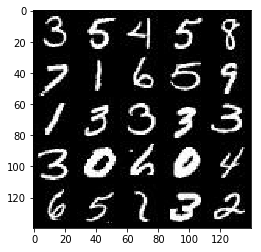

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

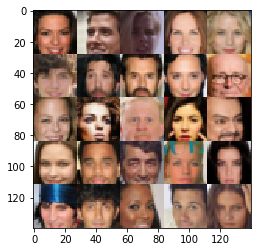

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')    
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name="learning_rate")

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    alpha = 0.2
    # TODO: Implement Function
    with tf.variable_scope("discriminator", reuse = reuse):      
        # Input layer is 28x28x3        
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha=0.1
    with tf.variable_scope("generator", reuse= not(is_train)):
        #Fully connected layer
        x1 = tf.layers.dense(z, 7 * 7 * 256, kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))

        #Reshape the fully connected layer to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 28x28x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='same')
        # 28x28x3 now
        
        out = tf.tanh(logits)   
        
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    #using the parameter smooth. Typically used with classifiers to improve performance.
    smooth = 0.1
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse = True)
    
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_real,labels = tf.ones_like(d_model_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    #Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(g_loss, var_list=g_vars)
        
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    steps = 0
    print_every = 10
    show_every = 100
    
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, lr = model_inputs(image_width, image_height,image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z,image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    is_train = tf.placeholder(tf.bool)  
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images * 2
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate})
                               
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{} Step {}...".format(epoch_i+1, epoch_count, steps),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))
    
                if steps % show_every == 0:
                    #Print the current image
                    show_generator_output(sess, 25, input_z, image_channels, data_image_mode)                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2 Step 10... Discriminator Loss: 0.4162... Generator Loss: 4.6087
Epoch 1/2 Step 20... Discriminator Loss: 0.4501... Generator Loss: 2.5648
Epoch 1/2 Step 30... Discriminator Loss: 0.4473... Generator Loss: 5.5668
Epoch 1/2 Step 40... Discriminator Loss: 0.8144... Generator Loss: 1.7805
Epoch 1/2 Step 50... Discriminator Loss: 0.5995... Generator Loss: 2.1799
Epoch 1/2 Step 60... Discriminator Loss: 0.9210... Generator Loss: 1.9464
Epoch 1/2 Step 70... Discriminator Loss: 0.7397... Generator Loss: 1.8119
Epoch 1/2 Step 80... Discriminator Loss: 1.0817... Generator Loss: 2.0575
Epoch 1/2 Step 90... Discriminator Loss: 1.3563... Generator Loss: 2.5081
Epoch 1/2 Step 100... Discriminator Loss: 1.1096... Generator Loss: 0.9838


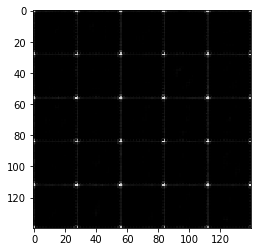

Epoch 1/2 Step 110... Discriminator Loss: 1.1064... Generator Loss: 0.8206
Epoch 1/2 Step 120... Discriminator Loss: 1.1948... Generator Loss: 0.9123
Epoch 1/2 Step 130... Discriminator Loss: 1.5127... Generator Loss: 0.4818
Epoch 1/2 Step 140... Discriminator Loss: 1.0324... Generator Loss: 1.4577
Epoch 1/2 Step 150... Discriminator Loss: 1.0713... Generator Loss: 1.0183
Epoch 1/2 Step 160... Discriminator Loss: 1.0482... Generator Loss: 1.7654
Epoch 1/2 Step 170... Discriminator Loss: 1.1345... Generator Loss: 1.9795
Epoch 1/2 Step 180... Discriminator Loss: 0.9310... Generator Loss: 1.0294
Epoch 1/2 Step 190... Discriminator Loss: 1.1152... Generator Loss: 0.7662
Epoch 1/2 Step 200... Discriminator Loss: 1.1132... Generator Loss: 1.6096


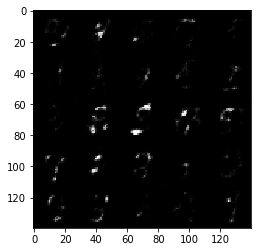

Epoch 1/2 Step 210... Discriminator Loss: 0.9283... Generator Loss: 0.9879
Epoch 1/2 Step 220... Discriminator Loss: 0.9135... Generator Loss: 1.1453
Epoch 1/2 Step 230... Discriminator Loss: 0.8613... Generator Loss: 1.2542
Epoch 1/2 Step 240... Discriminator Loss: 0.9460... Generator Loss: 1.3988
Epoch 1/2 Step 250... Discriminator Loss: 0.8946... Generator Loss: 1.1722
Epoch 1/2 Step 260... Discriminator Loss: 0.8205... Generator Loss: 1.3204
Epoch 1/2 Step 270... Discriminator Loss: 0.8576... Generator Loss: 1.3610
Epoch 1/2 Step 280... Discriminator Loss: 0.9154... Generator Loss: 1.4812
Epoch 1/2 Step 290... Discriminator Loss: 1.2526... Generator Loss: 2.5330
Epoch 1/2 Step 300... Discriminator Loss: 0.8713... Generator Loss: 1.2218


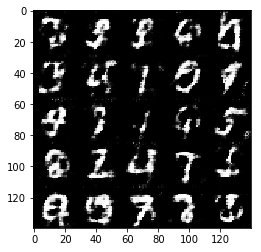

Epoch 1/2 Step 310... Discriminator Loss: 0.8615... Generator Loss: 1.3869
Epoch 1/2 Step 320... Discriminator Loss: 1.0955... Generator Loss: 0.7988
Epoch 1/2 Step 330... Discriminator Loss: 1.1397... Generator Loss: 0.7575
Epoch 1/2 Step 340... Discriminator Loss: 1.0353... Generator Loss: 2.0635
Epoch 1/2 Step 350... Discriminator Loss: 1.2707... Generator Loss: 2.8639
Epoch 1/2 Step 360... Discriminator Loss: 0.9157... Generator Loss: 1.2263
Epoch 1/2 Step 370... Discriminator Loss: 1.0543... Generator Loss: 1.1553
Epoch 1/2 Step 380... Discriminator Loss: 1.0711... Generator Loss: 1.4519
Epoch 1/2 Step 390... Discriminator Loss: 1.0245... Generator Loss: 1.0673
Epoch 1/2 Step 400... Discriminator Loss: 1.1086... Generator Loss: 1.0315


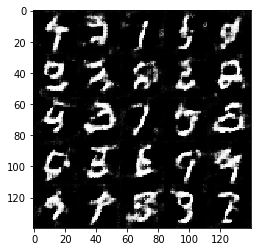

Epoch 1/2 Step 410... Discriminator Loss: 1.2736... Generator Loss: 0.5852
Epoch 1/2 Step 420... Discriminator Loss: 1.1110... Generator Loss: 1.2544
Epoch 1/2 Step 430... Discriminator Loss: 1.0199... Generator Loss: 0.9989
Epoch 1/2 Step 440... Discriminator Loss: 1.0474... Generator Loss: 1.2390
Epoch 1/2 Step 450... Discriminator Loss: 0.9688... Generator Loss: 1.4482
Epoch 1/2 Step 460... Discriminator Loss: 1.1181... Generator Loss: 0.7780
Epoch 1/2 Step 470... Discriminator Loss: 0.9287... Generator Loss: 1.4584
Epoch 1/2 Step 480... Discriminator Loss: 1.0113... Generator Loss: 1.2287
Epoch 1/2 Step 490... Discriminator Loss: 1.0633... Generator Loss: 0.9347
Epoch 1/2 Step 500... Discriminator Loss: 1.0378... Generator Loss: 1.0422


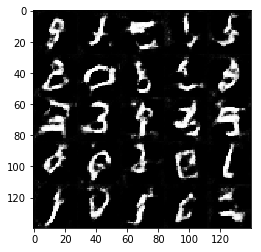

Epoch 1/2 Step 510... Discriminator Loss: 1.0329... Generator Loss: 1.3286
Epoch 1/2 Step 520... Discriminator Loss: 0.9473... Generator Loss: 1.0131
Epoch 1/2 Step 530... Discriminator Loss: 0.9963... Generator Loss: 1.5298
Epoch 1/2 Step 540... Discriminator Loss: 0.9847... Generator Loss: 1.5873
Epoch 1/2 Step 550... Discriminator Loss: 1.0421... Generator Loss: 0.9462
Epoch 1/2 Step 560... Discriminator Loss: 1.0019... Generator Loss: 1.0953
Epoch 1/2 Step 570... Discriminator Loss: 0.9065... Generator Loss: 1.4824
Epoch 1/2 Step 580... Discriminator Loss: 1.1857... Generator Loss: 0.6862
Epoch 1/2 Step 590... Discriminator Loss: 1.0023... Generator Loss: 1.0988
Epoch 1/2 Step 600... Discriminator Loss: 0.9837... Generator Loss: 1.2255


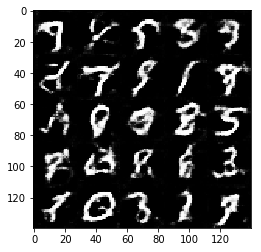

Epoch 1/2 Step 610... Discriminator Loss: 1.1262... Generator Loss: 0.7545
Epoch 1/2 Step 620... Discriminator Loss: 0.9845... Generator Loss: 1.2048
Epoch 1/2 Step 630... Discriminator Loss: 0.9523... Generator Loss: 1.8169
Epoch 1/2 Step 640... Discriminator Loss: 1.3460... Generator Loss: 2.2265
Epoch 1/2 Step 650... Discriminator Loss: 1.0349... Generator Loss: 0.9005
Epoch 1/2 Step 660... Discriminator Loss: 1.0894... Generator Loss: 0.8867
Epoch 1/2 Step 670... Discriminator Loss: 1.0157... Generator Loss: 1.0711
Epoch 1/2 Step 680... Discriminator Loss: 1.0939... Generator Loss: 1.8559
Epoch 1/2 Step 690... Discriminator Loss: 1.0349... Generator Loss: 1.4791
Epoch 1/2 Step 700... Discriminator Loss: 1.0698... Generator Loss: 1.3614


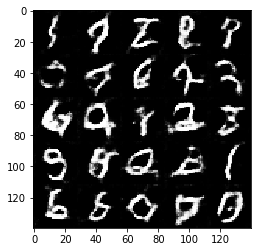

Epoch 1/2 Step 710... Discriminator Loss: 1.0955... Generator Loss: 0.7910
Epoch 1/2 Step 720... Discriminator Loss: 1.0201... Generator Loss: 1.0462
Epoch 1/2 Step 730... Discriminator Loss: 1.0944... Generator Loss: 1.5817
Epoch 1/2 Step 740... Discriminator Loss: 0.9611... Generator Loss: 1.0950
Epoch 1/2 Step 750... Discriminator Loss: 1.1010... Generator Loss: 0.7973
Epoch 1/2 Step 760... Discriminator Loss: 0.9999... Generator Loss: 1.0005
Epoch 1/2 Step 770... Discriminator Loss: 1.1852... Generator Loss: 0.6859
Epoch 1/2 Step 780... Discriminator Loss: 1.0418... Generator Loss: 1.1899
Epoch 1/2 Step 790... Discriminator Loss: 1.0319... Generator Loss: 0.8962
Epoch 1/2 Step 800... Discriminator Loss: 0.9108... Generator Loss: 1.0475


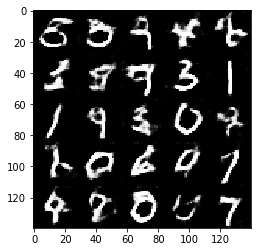

Epoch 1/2 Step 810... Discriminator Loss: 1.1141... Generator Loss: 2.3206
Epoch 1/2 Step 820... Discriminator Loss: 0.9273... Generator Loss: 1.1011
Epoch 1/2 Step 830... Discriminator Loss: 1.1662... Generator Loss: 0.6753
Epoch 1/2 Step 840... Discriminator Loss: 0.8071... Generator Loss: 1.3748
Epoch 1/2 Step 850... Discriminator Loss: 1.0708... Generator Loss: 0.7503
Epoch 1/2 Step 860... Discriminator Loss: 0.9500... Generator Loss: 1.0558
Epoch 1/2 Step 870... Discriminator Loss: 0.9473... Generator Loss: 2.0067
Epoch 1/2 Step 880... Discriminator Loss: 0.8964... Generator Loss: 1.3017
Epoch 1/2 Step 890... Discriminator Loss: 1.0043... Generator Loss: 1.0989
Epoch 1/2 Step 900... Discriminator Loss: 1.0849... Generator Loss: 0.7652


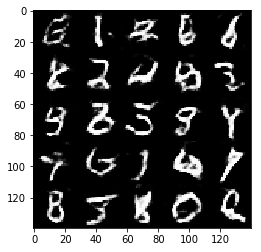

Epoch 1/2 Step 910... Discriminator Loss: 0.9292... Generator Loss: 1.4318
Epoch 1/2 Step 920... Discriminator Loss: 0.9113... Generator Loss: 1.0068
Epoch 1/2 Step 930... Discriminator Loss: 0.9685... Generator Loss: 1.1394
Epoch 2/2 Step 940... Discriminator Loss: 1.2466... Generator Loss: 0.6814
Epoch 2/2 Step 950... Discriminator Loss: 0.8876... Generator Loss: 1.1954
Epoch 2/2 Step 960... Discriminator Loss: 0.9523... Generator Loss: 1.2135
Epoch 2/2 Step 970... Discriminator Loss: 0.9246... Generator Loss: 1.5266
Epoch 2/2 Step 980... Discriminator Loss: 0.9256... Generator Loss: 1.1807
Epoch 2/2 Step 990... Discriminator Loss: 1.8458... Generator Loss: 2.3669
Epoch 2/2 Step 1000... Discriminator Loss: 0.9611... Generator Loss: 1.0115


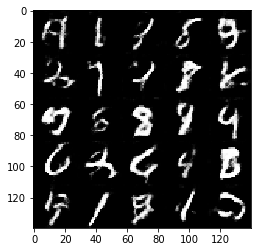

Epoch 2/2 Step 1010... Discriminator Loss: 0.8878... Generator Loss: 1.2452
Epoch 2/2 Step 1020... Discriminator Loss: 0.8281... Generator Loss: 1.8406
Epoch 2/2 Step 1030... Discriminator Loss: 0.8784... Generator Loss: 1.3623
Epoch 2/2 Step 1040... Discriminator Loss: 0.8654... Generator Loss: 1.5880
Epoch 2/2 Step 1050... Discriminator Loss: 0.8582... Generator Loss: 1.1364
Epoch 2/2 Step 1060... Discriminator Loss: 0.8819... Generator Loss: 1.0710
Epoch 2/2 Step 1070... Discriminator Loss: 1.1185... Generator Loss: 0.7457
Epoch 2/2 Step 1080... Discriminator Loss: 1.0064... Generator Loss: 0.8510
Epoch 2/2 Step 1090... Discriminator Loss: 0.8151... Generator Loss: 1.3389
Epoch 2/2 Step 1100... Discriminator Loss: 0.9052... Generator Loss: 1.0550


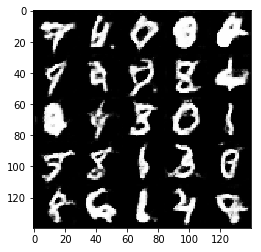

Epoch 2/2 Step 1110... Discriminator Loss: 1.2294... Generator Loss: 2.1195
Epoch 2/2 Step 1120... Discriminator Loss: 0.8222... Generator Loss: 1.5338
Epoch 2/2 Step 1130... Discriminator Loss: 0.8814... Generator Loss: 1.0828
Epoch 2/2 Step 1140... Discriminator Loss: 1.1859... Generator Loss: 0.6962
Epoch 2/2 Step 1150... Discriminator Loss: 0.9573... Generator Loss: 0.9526
Epoch 2/2 Step 1160... Discriminator Loss: 1.0585... Generator Loss: 0.9485
Epoch 2/2 Step 1170... Discriminator Loss: 0.9608... Generator Loss: 1.3576
Epoch 2/2 Step 1180... Discriminator Loss: 0.9671... Generator Loss: 1.1016
Epoch 2/2 Step 1190... Discriminator Loss: 1.6708... Generator Loss: 2.3253
Epoch 2/2 Step 1200... Discriminator Loss: 0.8876... Generator Loss: 1.1496


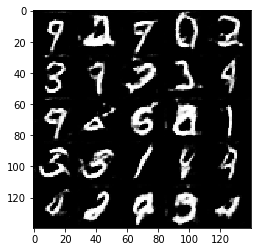

Epoch 2/2 Step 1210... Discriminator Loss: 0.8187... Generator Loss: 1.2742
Epoch 2/2 Step 1220... Discriminator Loss: 1.0649... Generator Loss: 0.8214
Epoch 2/2 Step 1230... Discriminator Loss: 0.9280... Generator Loss: 1.0675
Epoch 2/2 Step 1240... Discriminator Loss: 2.2895... Generator Loss: 0.2432
Epoch 2/2 Step 1250... Discriminator Loss: 0.8831... Generator Loss: 1.1257
Epoch 2/2 Step 1260... Discriminator Loss: 0.8872... Generator Loss: 1.2693
Epoch 2/2 Step 1270... Discriminator Loss: 1.1508... Generator Loss: 0.6783
Epoch 2/2 Step 1280... Discriminator Loss: 0.9536... Generator Loss: 0.9549
Epoch 2/2 Step 1290... Discriminator Loss: 0.9011... Generator Loss: 1.1919
Epoch 2/2 Step 1300... Discriminator Loss: 1.1839... Generator Loss: 0.7487


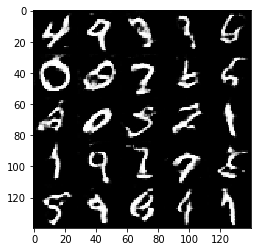

Epoch 2/2 Step 1310... Discriminator Loss: 0.9917... Generator Loss: 1.6058
Epoch 2/2 Step 1320... Discriminator Loss: 1.5919... Generator Loss: 0.4700
Epoch 2/2 Step 1330... Discriminator Loss: 0.9752... Generator Loss: 1.3193
Epoch 2/2 Step 1340... Discriminator Loss: 0.9096... Generator Loss: 1.2097
Epoch 2/2 Step 1350... Discriminator Loss: 0.9147... Generator Loss: 1.1457
Epoch 2/2 Step 1360... Discriminator Loss: 1.1352... Generator Loss: 0.7007
Epoch 2/2 Step 1370... Discriminator Loss: 0.8371... Generator Loss: 1.2499
Epoch 2/2 Step 1380... Discriminator Loss: 1.0188... Generator Loss: 0.9932
Epoch 2/2 Step 1390... Discriminator Loss: 0.9486... Generator Loss: 0.9751
Epoch 2/2 Step 1400... Discriminator Loss: 1.1095... Generator Loss: 0.7561


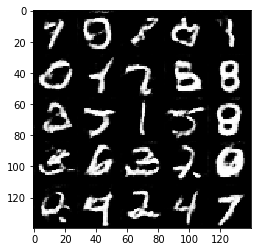

Epoch 2/2 Step 1410... Discriminator Loss: 0.9843... Generator Loss: 1.9614
Epoch 2/2 Step 1420... Discriminator Loss: 1.0536... Generator Loss: 1.2024
Epoch 2/2 Step 1430... Discriminator Loss: 0.9966... Generator Loss: 0.9679
Epoch 2/2 Step 1440... Discriminator Loss: 0.8795... Generator Loss: 1.2411
Epoch 2/2 Step 1450... Discriminator Loss: 1.5527... Generator Loss: 0.4215
Epoch 2/2 Step 1460... Discriminator Loss: 0.9585... Generator Loss: 1.3212
Epoch 2/2 Step 1470... Discriminator Loss: 1.1972... Generator Loss: 0.7713
Epoch 2/2 Step 1480... Discriminator Loss: 0.9988... Generator Loss: 0.9104
Epoch 2/2 Step 1490... Discriminator Loss: 1.0103... Generator Loss: 0.8272
Epoch 2/2 Step 1500... Discriminator Loss: 0.8845... Generator Loss: 1.2660


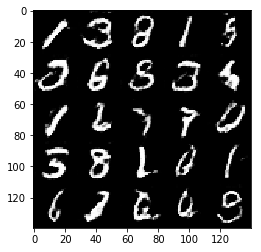

Epoch 2/2 Step 1510... Discriminator Loss: 1.0037... Generator Loss: 0.8761
Epoch 2/2 Step 1520... Discriminator Loss: 0.8962... Generator Loss: 2.1978
Epoch 2/2 Step 1530... Discriminator Loss: 1.3246... Generator Loss: 0.5915
Epoch 2/2 Step 1540... Discriminator Loss: 0.9460... Generator Loss: 1.2572
Epoch 2/2 Step 1550... Discriminator Loss: 0.8171... Generator Loss: 1.2095
Epoch 2/2 Step 1560... Discriminator Loss: 0.7383... Generator Loss: 1.3653
Epoch 2/2 Step 1570... Discriminator Loss: 1.2300... Generator Loss: 0.7300
Epoch 2/2 Step 1580... Discriminator Loss: 1.0906... Generator Loss: 0.8131
Epoch 2/2 Step 1590... Discriminator Loss: 1.0964... Generator Loss: 0.7964
Epoch 2/2 Step 1600... Discriminator Loss: 0.9589... Generator Loss: 0.9148


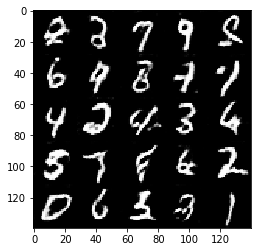

Epoch 2/2 Step 1610... Discriminator Loss: 0.9250... Generator Loss: 0.9804
Epoch 2/2 Step 1620... Discriminator Loss: 0.9286... Generator Loss: 0.9892
Epoch 2/2 Step 1630... Discriminator Loss: 0.7252... Generator Loss: 1.6163
Epoch 2/2 Step 1640... Discriminator Loss: 1.4867... Generator Loss: 2.3661
Epoch 2/2 Step 1650... Discriminator Loss: 0.8870... Generator Loss: 1.5270
Epoch 2/2 Step 1660... Discriminator Loss: 1.2681... Generator Loss: 0.6485
Epoch 2/2 Step 1670... Discriminator Loss: 1.0687... Generator Loss: 0.8512
Epoch 2/2 Step 1680... Discriminator Loss: 1.1543... Generator Loss: 0.6936
Epoch 2/2 Step 1690... Discriminator Loss: 0.8689... Generator Loss: 1.7539
Epoch 2/2 Step 1700... Discriminator Loss: 1.0251... Generator Loss: 0.8581


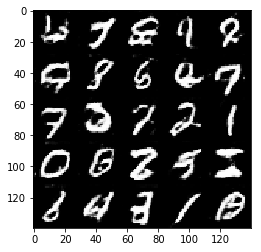

Epoch 2/2 Step 1710... Discriminator Loss: 0.8602... Generator Loss: 1.6127
Epoch 2/2 Step 1720... Discriminator Loss: 1.2149... Generator Loss: 0.6106
Epoch 2/2 Step 1730... Discriminator Loss: 0.9304... Generator Loss: 1.1587
Epoch 2/2 Step 1740... Discriminator Loss: 0.9814... Generator Loss: 0.9145
Epoch 2/2 Step 1750... Discriminator Loss: 1.0133... Generator Loss: 0.8931
Epoch 2/2 Step 1760... Discriminator Loss: 1.0372... Generator Loss: 0.8407
Epoch 2/2 Step 1770... Discriminator Loss: 0.7998... Generator Loss: 1.2667
Epoch 2/2 Step 1780... Discriminator Loss: 0.8807... Generator Loss: 1.1313
Epoch 2/2 Step 1790... Discriminator Loss: 1.0720... Generator Loss: 0.8309
Epoch 2/2 Step 1800... Discriminator Loss: 0.7322... Generator Loss: 1.4490


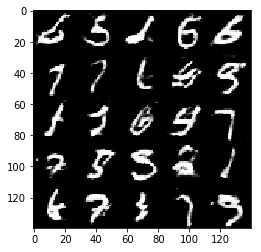

Epoch 2/2 Step 1810... Discriminator Loss: 0.8944... Generator Loss: 1.1861
Epoch 2/2 Step 1820... Discriminator Loss: 0.8928... Generator Loss: 2.3350
Epoch 2/2 Step 1830... Discriminator Loss: 1.3931... Generator Loss: 0.5252
Epoch 2/2 Step 1840... Discriminator Loss: 0.7802... Generator Loss: 1.2602
Epoch 2/2 Step 1850... Discriminator Loss: 1.7614... Generator Loss: 0.3378
Epoch 2/2 Step 1860... Discriminator Loss: 0.9695... Generator Loss: 1.1347
Epoch 2/2 Step 1870... Discriminator Loss: 0.9210... Generator Loss: 0.9941


In [12]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1 Step 10... Discriminator Loss: 2.8314... Generator Loss: 0.1731
Epoch 1/1 Step 20... Discriminator Loss: 0.6363... Generator Loss: 2.2165
Epoch 1/1 Step 30... Discriminator Loss: 0.4024... Generator Loss: 6.5740
Epoch 1/1 Step 40... Discriminator Loss: 0.7629... Generator Loss: 1.6922
Epoch 1/1 Step 50... Discriminator Loss: 0.5296... Generator Loss: 2.1313
Epoch 1/1 Step 60... Discriminator Loss: 3.2863... Generator Loss: 20.0966
Epoch 1/1 Step 70... Discriminator Loss: 1.0840... Generator Loss: 1.7861
Epoch 1/1 Step 80... Discriminator Loss: 2.5683... Generator Loss: 0.3180
Epoch 1/1 Step 90... Discriminator Loss: 1.4681... Generator Loss: 1.7704
Epoch 1/1 Step 100... Discriminator Loss: 1.3640... Generator Loss: 0.8916


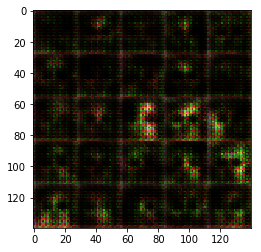

Epoch 1/1 Step 110... Discriminator Loss: 1.2000... Generator Loss: 0.8183
Epoch 1/1 Step 120... Discriminator Loss: 2.3167... Generator Loss: 0.2422
Epoch 1/1 Step 130... Discriminator Loss: 0.8602... Generator Loss: 1.0703
Epoch 1/1 Step 140... Discriminator Loss: 0.8595... Generator Loss: 5.6885
Epoch 1/1 Step 150... Discriminator Loss: 2.4609... Generator Loss: 7.8141
Epoch 1/1 Step 160... Discriminator Loss: 0.4496... Generator Loss: 3.2793
Epoch 1/1 Step 170... Discriminator Loss: 0.5671... Generator Loss: 2.6806
Epoch 1/1 Step 180... Discriminator Loss: 0.5874... Generator Loss: 1.8620
Epoch 1/1 Step 190... Discriminator Loss: 0.8104... Generator Loss: 1.3738
Epoch 1/1 Step 200... Discriminator Loss: 2.4155... Generator Loss: 0.2216


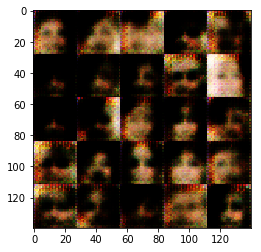

Epoch 1/1 Step 210... Discriminator Loss: 0.7630... Generator Loss: 1.5564
Epoch 1/1 Step 220... Discriminator Loss: 0.8994... Generator Loss: 0.9905
Epoch 1/1 Step 230... Discriminator Loss: 1.2678... Generator Loss: 0.7678
Epoch 1/1 Step 240... Discriminator Loss: 1.9604... Generator Loss: 0.2841
Epoch 1/1 Step 250... Discriminator Loss: 0.7293... Generator Loss: 1.7493
Epoch 1/1 Step 260... Discriminator Loss: 2.1849... Generator Loss: 0.2193
Epoch 1/1 Step 270... Discriminator Loss: 1.0048... Generator Loss: 0.9612
Epoch 1/1 Step 280... Discriminator Loss: 1.4089... Generator Loss: 0.5221
Epoch 1/1 Step 290... Discriminator Loss: 1.4643... Generator Loss: 1.4157
Epoch 1/1 Step 300... Discriminator Loss: 1.0593... Generator Loss: 1.1607


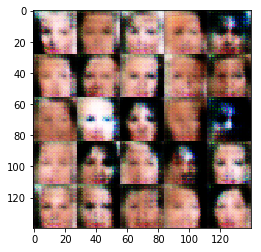

Epoch 1/1 Step 310... Discriminator Loss: 1.2002... Generator Loss: 1.7568
Epoch 1/1 Step 320... Discriminator Loss: 1.3758... Generator Loss: 0.7787
Epoch 1/1 Step 330... Discriminator Loss: 0.6306... Generator Loss: 2.0808
Epoch 1/1 Step 340... Discriminator Loss: 0.6094... Generator Loss: 2.0302
Epoch 1/1 Step 350... Discriminator Loss: 1.1749... Generator Loss: 4.1301
Epoch 1/1 Step 360... Discriminator Loss: 1.0593... Generator Loss: 0.8707
Epoch 1/1 Step 370... Discriminator Loss: 1.1397... Generator Loss: 1.2742
Epoch 1/1 Step 380... Discriminator Loss: 2.6071... Generator Loss: 0.2827
Epoch 1/1 Step 390... Discriminator Loss: 0.8784... Generator Loss: 1.4767
Epoch 1/1 Step 400... Discriminator Loss: 0.9946... Generator Loss: 0.9498


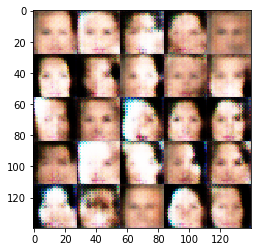

Epoch 1/1 Step 410... Discriminator Loss: 0.6361... Generator Loss: 3.6403
Epoch 1/1 Step 420... Discriminator Loss: 1.3175... Generator Loss: 0.5469
Epoch 1/1 Step 430... Discriminator Loss: 1.0056... Generator Loss: 1.0084
Epoch 1/1 Step 440... Discriminator Loss: 1.1850... Generator Loss: 0.7721
Epoch 1/1 Step 450... Discriminator Loss: 2.2220... Generator Loss: 0.2198
Epoch 1/1 Step 460... Discriminator Loss: 1.1750... Generator Loss: 1.3575
Epoch 1/1 Step 470... Discriminator Loss: 1.7230... Generator Loss: 0.4415
Epoch 1/1 Step 480... Discriminator Loss: 0.8890... Generator Loss: 1.1558
Epoch 1/1 Step 490... Discriminator Loss: 1.4923... Generator Loss: 0.4902
Epoch 1/1 Step 500... Discriminator Loss: 1.1658... Generator Loss: 0.6965


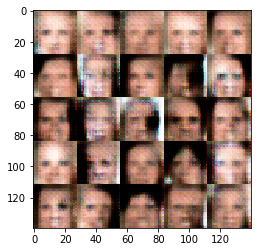

Epoch 1/1 Step 510... Discriminator Loss: 1.1473... Generator Loss: 0.8954
Epoch 1/1 Step 520... Discriminator Loss: 0.9212... Generator Loss: 2.8562
Epoch 1/1 Step 530... Discriminator Loss: 1.1809... Generator Loss: 0.9307
Epoch 1/1 Step 540... Discriminator Loss: 1.2080... Generator Loss: 0.7578
Epoch 1/1 Step 550... Discriminator Loss: 0.9365... Generator Loss: 1.1017
Epoch 1/1 Step 560... Discriminator Loss: 0.8107... Generator Loss: 2.1666
Epoch 1/1 Step 570... Discriminator Loss: 1.1199... Generator Loss: 1.8468
Epoch 1/1 Step 580... Discriminator Loss: 0.8234... Generator Loss: 1.6758
Epoch 1/1 Step 590... Discriminator Loss: 1.0412... Generator Loss: 0.7422
Epoch 1/1 Step 600... Discriminator Loss: 1.0246... Generator Loss: 0.8673


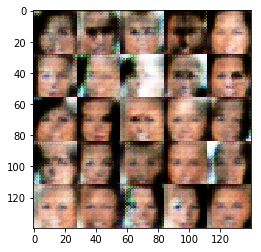

Epoch 1/1 Step 610... Discriminator Loss: 0.8925... Generator Loss: 1.2483
Epoch 1/1 Step 620... Discriminator Loss: 0.6509... Generator Loss: 1.6252
Epoch 1/1 Step 630... Discriminator Loss: 1.0243... Generator Loss: 0.7955
Epoch 1/1 Step 640... Discriminator Loss: 1.6829... Generator Loss: 0.3558
Epoch 1/1 Step 650... Discriminator Loss: 1.1385... Generator Loss: 1.0369
Epoch 1/1 Step 660... Discriminator Loss: 1.3515... Generator Loss: 0.5948
Epoch 1/1 Step 670... Discriminator Loss: 1.6330... Generator Loss: 0.3643
Epoch 1/1 Step 680... Discriminator Loss: 0.5455... Generator Loss: 2.1980
Epoch 1/1 Step 690... Discriminator Loss: 0.8668... Generator Loss: 1.2865
Epoch 1/1 Step 700... Discriminator Loss: 1.1457... Generator Loss: 1.3698


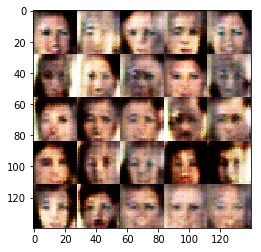

Epoch 1/1 Step 710... Discriminator Loss: 0.6788... Generator Loss: 2.8326
Epoch 1/1 Step 720... Discriminator Loss: 0.9228... Generator Loss: 0.9962
Epoch 1/1 Step 730... Discriminator Loss: 1.4937... Generator Loss: 0.6488
Epoch 1/1 Step 740... Discriminator Loss: 1.2856... Generator Loss: 0.6185
Epoch 1/1 Step 750... Discriminator Loss: 0.9533... Generator Loss: 1.8533
Epoch 1/1 Step 760... Discriminator Loss: 1.2532... Generator Loss: 0.9895
Epoch 1/1 Step 770... Discriminator Loss: 0.7572... Generator Loss: 1.8864
Epoch 1/1 Step 780... Discriminator Loss: 1.0193... Generator Loss: 1.0729
Epoch 1/1 Step 790... Discriminator Loss: 1.0442... Generator Loss: 0.9879
Epoch 1/1 Step 800... Discriminator Loss: 1.0397... Generator Loss: 1.3141


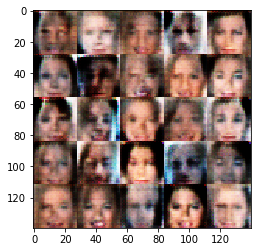

Epoch 1/1 Step 810... Discriminator Loss: 1.3552... Generator Loss: 0.5020
Epoch 1/1 Step 820... Discriminator Loss: 0.6109... Generator Loss: 1.8941
Epoch 1/1 Step 830... Discriminator Loss: 1.3475... Generator Loss: 2.0259
Epoch 1/1 Step 840... Discriminator Loss: 1.2856... Generator Loss: 1.2052
Epoch 1/1 Step 850... Discriminator Loss: 0.9706... Generator Loss: 1.2808
Epoch 1/1 Step 860... Discriminator Loss: 1.4629... Generator Loss: 0.4401
Epoch 1/1 Step 870... Discriminator Loss: 1.3063... Generator Loss: 0.7970
Epoch 1/1 Step 880... Discriminator Loss: 1.1650... Generator Loss: 0.6655
Epoch 1/1 Step 890... Discriminator Loss: 0.9150... Generator Loss: 1.7967
Epoch 1/1 Step 900... Discriminator Loss: 1.1097... Generator Loss: 1.2153


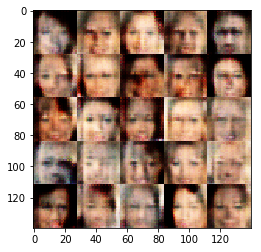

Epoch 1/1 Step 910... Discriminator Loss: 0.9035... Generator Loss: 1.0795
Epoch 1/1 Step 920... Discriminator Loss: 0.9590... Generator Loss: 1.6811
Epoch 1/1 Step 930... Discriminator Loss: 1.4152... Generator Loss: 0.5315
Epoch 1/1 Step 940... Discriminator Loss: 0.5391... Generator Loss: 3.6922
Epoch 1/1 Step 950... Discriminator Loss: 1.1208... Generator Loss: 0.8245
Epoch 1/1 Step 960... Discriminator Loss: 1.1278... Generator Loss: 0.9015
Epoch 1/1 Step 970... Discriminator Loss: 1.3310... Generator Loss: 0.6133
Epoch 1/1 Step 980... Discriminator Loss: 1.7753... Generator Loss: 0.3056
Epoch 1/1 Step 990... Discriminator Loss: 0.7518... Generator Loss: 1.5241
Epoch 1/1 Step 1000... Discriminator Loss: 1.1132... Generator Loss: 0.9499


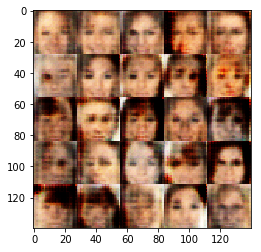

Epoch 1/1 Step 1010... Discriminator Loss: 1.2734... Generator Loss: 0.6841
Epoch 1/1 Step 1020... Discriminator Loss: 0.8247... Generator Loss: 1.5374
Epoch 1/1 Step 1030... Discriminator Loss: 1.0369... Generator Loss: 1.8198
Epoch 1/1 Step 1040... Discriminator Loss: 1.4403... Generator Loss: 0.6859
Epoch 1/1 Step 1050... Discriminator Loss: 0.9077... Generator Loss: 1.8799
Epoch 1/1 Step 1060... Discriminator Loss: 1.2285... Generator Loss: 0.9915
Epoch 1/1 Step 1070... Discriminator Loss: 1.2089... Generator Loss: 0.6412
Epoch 1/1 Step 1080... Discriminator Loss: 0.8495... Generator Loss: 2.0736
Epoch 1/1 Step 1090... Discriminator Loss: 1.4473... Generator Loss: 0.7795
Epoch 1/1 Step 1100... Discriminator Loss: 1.0361... Generator Loss: 0.7989


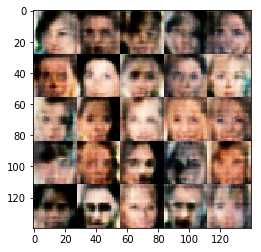

Epoch 1/1 Step 1110... Discriminator Loss: 1.2995... Generator Loss: 0.5988
Epoch 1/1 Step 1120... Discriminator Loss: 1.1399... Generator Loss: 0.9180
Epoch 1/1 Step 1130... Discriminator Loss: 0.7136... Generator Loss: 3.1900
Epoch 1/1 Step 1140... Discriminator Loss: 1.3264... Generator Loss: 0.6132
Epoch 1/1 Step 1150... Discriminator Loss: 1.4551... Generator Loss: 0.5384
Epoch 1/1 Step 1160... Discriminator Loss: 1.5202... Generator Loss: 0.4476
Epoch 1/1 Step 1170... Discriminator Loss: 1.0442... Generator Loss: 1.0471
Epoch 1/1 Step 1180... Discriminator Loss: 1.5882... Generator Loss: 0.4469
Epoch 1/1 Step 1190... Discriminator Loss: 1.2832... Generator Loss: 0.6382
Epoch 1/1 Step 1200... Discriminator Loss: 1.0703... Generator Loss: 1.0562


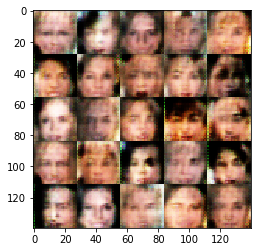

Epoch 1/1 Step 1210... Discriminator Loss: 1.2336... Generator Loss: 0.8640
Epoch 1/1 Step 1220... Discriminator Loss: 1.1337... Generator Loss: 1.0972
Epoch 1/1 Step 1230... Discriminator Loss: 0.8901... Generator Loss: 1.0568
Epoch 1/1 Step 1240... Discriminator Loss: 0.6651... Generator Loss: 3.9437
Epoch 1/1 Step 1250... Discriminator Loss: 1.2367... Generator Loss: 0.7469
Epoch 1/1 Step 1260... Discriminator Loss: 1.5845... Generator Loss: 0.5350
Epoch 1/1 Step 1270... Discriminator Loss: 1.1753... Generator Loss: 1.1922
Epoch 1/1 Step 1280... Discriminator Loss: 1.5568... Generator Loss: 0.6052
Epoch 1/1 Step 1290... Discriminator Loss: 1.3588... Generator Loss: 0.5323
Epoch 1/1 Step 1300... Discriminator Loss: 0.9539... Generator Loss: 0.9070


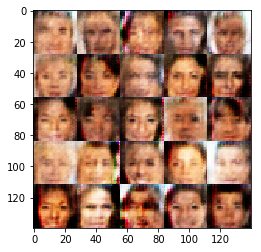

Epoch 1/1 Step 1310... Discriminator Loss: 1.2109... Generator Loss: 0.7524
Epoch 1/1 Step 1320... Discriminator Loss: 1.4073... Generator Loss: 1.1547
Epoch 1/1 Step 1330... Discriminator Loss: 1.5474... Generator Loss: 0.5716
Epoch 1/1 Step 1340... Discriminator Loss: 1.0747... Generator Loss: 0.8940
Epoch 1/1 Step 1350... Discriminator Loss: 1.1956... Generator Loss: 0.9502
Epoch 1/1 Step 1360... Discriminator Loss: 0.8772... Generator Loss: 1.8249
Epoch 1/1 Step 1370... Discriminator Loss: 1.4560... Generator Loss: 0.4517
Epoch 1/1 Step 1380... Discriminator Loss: 1.0891... Generator Loss: 1.1834
Epoch 1/1 Step 1390... Discriminator Loss: 1.2703... Generator Loss: 0.6019
Epoch 1/1 Step 1400... Discriminator Loss: 0.8285... Generator Loss: 1.4562


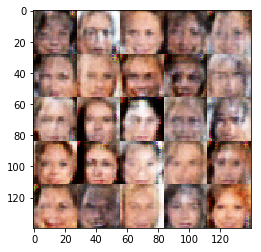

Epoch 1/1 Step 1410... Discriminator Loss: 1.2969... Generator Loss: 0.7211
Epoch 1/1 Step 1420... Discriminator Loss: 1.5234... Generator Loss: 0.4180
Epoch 1/1 Step 1430... Discriminator Loss: 1.5390... Generator Loss: 0.4648
Epoch 1/1 Step 1440... Discriminator Loss: 0.8288... Generator Loss: 1.2455
Epoch 1/1 Step 1450... Discriminator Loss: 0.8473... Generator Loss: 1.0968
Epoch 1/1 Step 1460... Discriminator Loss: 1.6408... Generator Loss: 0.6717
Epoch 1/1 Step 1470... Discriminator Loss: 1.4409... Generator Loss: 0.5903
Epoch 1/1 Step 1480... Discriminator Loss: 1.4606... Generator Loss: 0.5815
Epoch 1/1 Step 1490... Discriminator Loss: 1.6177... Generator Loss: 0.3815
Epoch 1/1 Step 1500... Discriminator Loss: 1.0144... Generator Loss: 1.0939


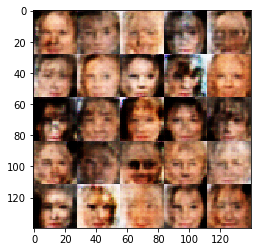

Epoch 1/1 Step 1510... Discriminator Loss: 1.2962... Generator Loss: 0.8692
Epoch 1/1 Step 1520... Discriminator Loss: 1.3030... Generator Loss: 0.7349
Epoch 1/1 Step 1530... Discriminator Loss: 1.5813... Generator Loss: 0.5473
Epoch 1/1 Step 1540... Discriminator Loss: 1.2003... Generator Loss: 0.8949
Epoch 1/1 Step 1550... Discriminator Loss: 1.2388... Generator Loss: 0.7846
Epoch 1/1 Step 1560... Discriminator Loss: 1.3374... Generator Loss: 0.6638
Epoch 1/1 Step 1570... Discriminator Loss: 1.0514... Generator Loss: 1.0439
Epoch 1/1 Step 1580... Discriminator Loss: 1.6065... Generator Loss: 1.1778
Epoch 1/1 Step 1590... Discriminator Loss: 1.6773... Generator Loss: 0.4142
Epoch 1/1 Step 1600... Discriminator Loss: 0.9281... Generator Loss: 1.0209


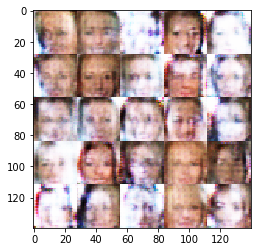

Epoch 1/1 Step 1610... Discriminator Loss: 3.5343... Generator Loss: 0.0566
Epoch 1/1 Step 1620... Discriminator Loss: 0.8808... Generator Loss: 1.0920
Epoch 1/1 Step 1630... Discriminator Loss: 0.8066... Generator Loss: 1.1155
Epoch 1/1 Step 1640... Discriminator Loss: 1.7037... Generator Loss: 0.3558
Epoch 1/1 Step 1650... Discriminator Loss: 3.1325... Generator Loss: 2.7562
Epoch 1/1 Step 1660... Discriminator Loss: 1.5700... Generator Loss: 0.4746
Epoch 1/1 Step 1670... Discriminator Loss: 1.1508... Generator Loss: 1.0794
Epoch 1/1 Step 1680... Discriminator Loss: 1.3060... Generator Loss: 1.5883
Epoch 1/1 Step 1690... Discriminator Loss: 0.7210... Generator Loss: 1.8904
Epoch 1/1 Step 1700... Discriminator Loss: 1.8112... Generator Loss: 0.4196


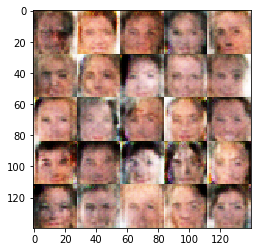

Epoch 1/1 Step 1710... Discriminator Loss: 1.1239... Generator Loss: 1.1305
Epoch 1/1 Step 1720... Discriminator Loss: 1.4098... Generator Loss: 0.7828
Epoch 1/1 Step 1730... Discriminator Loss: 1.2944... Generator Loss: 0.9060
Epoch 1/1 Step 1740... Discriminator Loss: 1.1649... Generator Loss: 0.8518
Epoch 1/1 Step 1750... Discriminator Loss: 1.1770... Generator Loss: 0.7755
Epoch 1/1 Step 1760... Discriminator Loss: 1.8767... Generator Loss: 0.3915
Epoch 1/1 Step 1770... Discriminator Loss: 1.3399... Generator Loss: 0.6950
Epoch 1/1 Step 1780... Discriminator Loss: 1.7372... Generator Loss: 0.3824
Epoch 1/1 Step 1790... Discriminator Loss: 1.0160... Generator Loss: 1.0425
Epoch 1/1 Step 1800... Discriminator Loss: 1.1556... Generator Loss: 0.9592


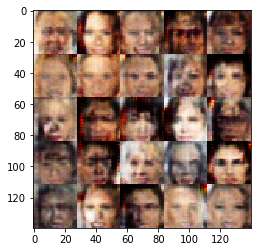

Epoch 1/1 Step 1810... Discriminator Loss: 1.4182... Generator Loss: 0.5606
Epoch 1/1 Step 1820... Discriminator Loss: 1.1018... Generator Loss: 1.0079
Epoch 1/1 Step 1830... Discriminator Loss: 1.2419... Generator Loss: 0.7731
Epoch 1/1 Step 1840... Discriminator Loss: 1.3325... Generator Loss: 0.8008
Epoch 1/1 Step 1850... Discriminator Loss: 0.8660... Generator Loss: 1.3608
Epoch 1/1 Step 1860... Discriminator Loss: 0.7961... Generator Loss: 1.5333
Epoch 1/1 Step 1870... Discriminator Loss: 1.5288... Generator Loss: 0.5924
Epoch 1/1 Step 1880... Discriminator Loss: 1.3737... Generator Loss: 0.5147
Epoch 1/1 Step 1890... Discriminator Loss: 1.1166... Generator Loss: 1.2085
Epoch 1/1 Step 1900... Discriminator Loss: 1.4306... Generator Loss: 0.5876


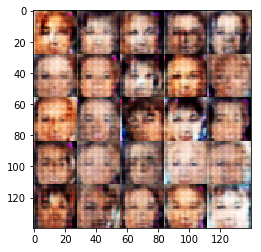

Epoch 1/1 Step 1910... Discriminator Loss: 1.4117... Generator Loss: 0.5592
Epoch 1/1 Step 1920... Discriminator Loss: 1.3747... Generator Loss: 0.7799
Epoch 1/1 Step 1930... Discriminator Loss: 1.4025... Generator Loss: 0.6585
Epoch 1/1 Step 1940... Discriminator Loss: 1.3048... Generator Loss: 0.5601
Epoch 1/1 Step 1950... Discriminator Loss: 1.3539... Generator Loss: 0.6893
Epoch 1/1 Step 1960... Discriminator Loss: 1.8091... Generator Loss: 0.3532
Epoch 1/1 Step 1970... Discriminator Loss: 1.0079... Generator Loss: 1.0057
Epoch 1/1 Step 1980... Discriminator Loss: 1.5716... Generator Loss: 0.3983
Epoch 1/1 Step 1990... Discriminator Loss: 1.2688... Generator Loss: 0.6241
Epoch 1/1 Step 2000... Discriminator Loss: 1.2068... Generator Loss: 0.6927


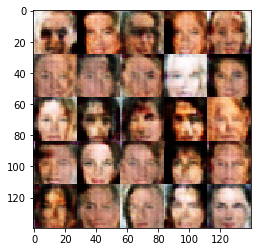

Epoch 1/1 Step 2010... Discriminator Loss: 1.3695... Generator Loss: 0.5981
Epoch 1/1 Step 2020... Discriminator Loss: 1.2138... Generator Loss: 0.8366
Epoch 1/1 Step 2030... Discriminator Loss: 1.3388... Generator Loss: 0.6411
Epoch 1/1 Step 2040... Discriminator Loss: 1.5296... Generator Loss: 0.4163
Epoch 1/1 Step 2050... Discriminator Loss: 1.6230... Generator Loss: 0.5588
Epoch 1/1 Step 2060... Discriminator Loss: 1.2486... Generator Loss: 1.3458
Epoch 1/1 Step 2070... Discriminator Loss: 0.9192... Generator Loss: 1.4330
Epoch 1/1 Step 2080... Discriminator Loss: 1.3537... Generator Loss: 0.5573
Epoch 1/1 Step 2090... Discriminator Loss: 1.4673... Generator Loss: 0.5692
Epoch 1/1 Step 2100... Discriminator Loss: 0.6834... Generator Loss: 1.7905


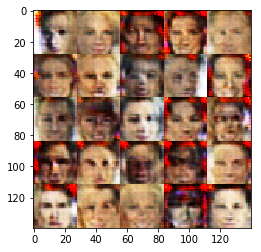

Epoch 1/1 Step 2110... Discriminator Loss: 0.9404... Generator Loss: 1.6770
Epoch 1/1 Step 2120... Discriminator Loss: 1.3061... Generator Loss: 0.9952
Epoch 1/1 Step 2130... Discriminator Loss: 1.3757... Generator Loss: 0.5510
Epoch 1/1 Step 2140... Discriminator Loss: 1.4350... Generator Loss: 0.6615
Epoch 1/1 Step 2150... Discriminator Loss: 1.1373... Generator Loss: 0.8772
Epoch 1/1 Step 2160... Discriminator Loss: 1.4519... Generator Loss: 0.8265
Epoch 1/1 Step 2170... Discriminator Loss: 1.1190... Generator Loss: 0.8273
Epoch 1/1 Step 2180... Discriminator Loss: 1.4038... Generator Loss: 0.8517
Epoch 1/1 Step 2190... Discriminator Loss: 1.4302... Generator Loss: 0.7216
Epoch 1/1 Step 2200... Discriminator Loss: 1.7076... Generator Loss: 0.3853


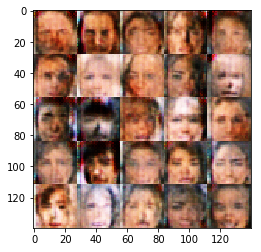

Epoch 1/1 Step 2210... Discriminator Loss: 1.3104... Generator Loss: 0.9513
Epoch 1/1 Step 2220... Discriminator Loss: 1.0976... Generator Loss: 0.8328
Epoch 1/1 Step 2230... Discriminator Loss: 1.4569... Generator Loss: 0.4412
Epoch 1/1 Step 2240... Discriminator Loss: 1.5522... Generator Loss: 0.5080
Epoch 1/1 Step 2250... Discriminator Loss: 1.1087... Generator Loss: 0.7391
Epoch 1/1 Step 2260... Discriminator Loss: 1.1864... Generator Loss: 1.0222
Epoch 1/1 Step 2270... Discriminator Loss: 1.3395... Generator Loss: 1.0025
Epoch 1/1 Step 2280... Discriminator Loss: 0.9561... Generator Loss: 1.4047
Epoch 1/1 Step 2290... Discriminator Loss: 1.0940... Generator Loss: 0.8901
Epoch 1/1 Step 2300... Discriminator Loss: 1.3256... Generator Loss: 0.6920


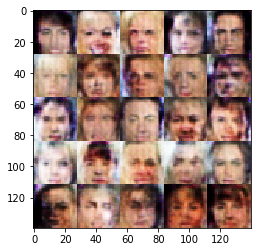

Epoch 1/1 Step 2310... Discriminator Loss: 1.5196... Generator Loss: 0.7002
Epoch 1/1 Step 2320... Discriminator Loss: 1.3406... Generator Loss: 0.7437
Epoch 1/1 Step 2330... Discriminator Loss: 1.6176... Generator Loss: 0.3743
Epoch 1/1 Step 2340... Discriminator Loss: 1.0416... Generator Loss: 0.9670
Epoch 1/1 Step 2350... Discriminator Loss: 1.6913... Generator Loss: 0.5552
Epoch 1/1 Step 2360... Discriminator Loss: 1.2000... Generator Loss: 0.8550
Epoch 1/1 Step 2370... Discriminator Loss: 1.4923... Generator Loss: 0.4786
Epoch 1/1 Step 2380... Discriminator Loss: 1.4220... Generator Loss: 0.5866
Epoch 1/1 Step 2390... Discriminator Loss: 1.0643... Generator Loss: 0.8788
Epoch 1/1 Step 2400... Discriminator Loss: 1.9119... Generator Loss: 1.2986


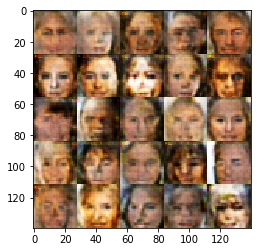

Epoch 1/1 Step 2410... Discriminator Loss: 1.2875... Generator Loss: 0.6570
Epoch 1/1 Step 2420... Discriminator Loss: 1.3330... Generator Loss: 1.0204
Epoch 1/1 Step 2430... Discriminator Loss: 1.2018... Generator Loss: 0.8459
Epoch 1/1 Step 2440... Discriminator Loss: 1.8225... Generator Loss: 0.3176
Epoch 1/1 Step 2450... Discriminator Loss: 0.9154... Generator Loss: 1.2664
Epoch 1/1 Step 2460... Discriminator Loss: 1.4505... Generator Loss: 0.9243
Epoch 1/1 Step 2470... Discriminator Loss: 1.2179... Generator Loss: 0.6460
Epoch 1/1 Step 2480... Discriminator Loss: 1.4792... Generator Loss: 0.5950
Epoch 1/1 Step 2490... Discriminator Loss: 1.2218... Generator Loss: 0.8070
Epoch 1/1 Step 2500... Discriminator Loss: 1.2175... Generator Loss: 0.7895


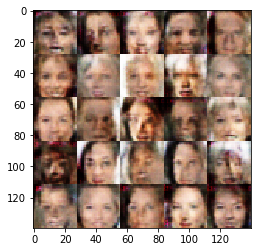

Epoch 1/1 Step 2510... Discriminator Loss: 0.8911... Generator Loss: 1.1411
Epoch 1/1 Step 2520... Discriminator Loss: 1.1446... Generator Loss: 0.9551
Epoch 1/1 Step 2530... Discriminator Loss: 1.3516... Generator Loss: 0.7810
Epoch 1/1 Step 2540... Discriminator Loss: 1.0362... Generator Loss: 1.0090
Epoch 1/1 Step 2550... Discriminator Loss: 1.2283... Generator Loss: 0.9102
Epoch 1/1 Step 2560... Discriminator Loss: 1.4771... Generator Loss: 0.4169
Epoch 1/1 Step 2570... Discriminator Loss: 0.6712... Generator Loss: 1.6847
Epoch 1/1 Step 2580... Discriminator Loss: 1.2147... Generator Loss: 0.9465
Epoch 1/1 Step 2590... Discriminator Loss: 1.0054... Generator Loss: 1.1478
Epoch 1/1 Step 2600... Discriminator Loss: 1.2991... Generator Loss: 0.6462


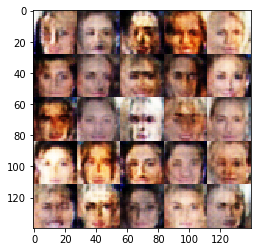

Epoch 1/1 Step 2610... Discriminator Loss: 1.0961... Generator Loss: 0.9158
Epoch 1/1 Step 2620... Discriminator Loss: 1.2583... Generator Loss: 0.6680
Epoch 1/1 Step 2630... Discriminator Loss: 1.0795... Generator Loss: 1.5205
Epoch 1/1 Step 2640... Discriminator Loss: 1.2751... Generator Loss: 0.6592
Epoch 1/1 Step 2650... Discriminator Loss: 0.9031... Generator Loss: 1.0572
Epoch 1/1 Step 2660... Discriminator Loss: 0.9804... Generator Loss: 1.2272
Epoch 1/1 Step 2670... Discriminator Loss: 1.4111... Generator Loss: 0.9740
Epoch 1/1 Step 2680... Discriminator Loss: 1.1068... Generator Loss: 0.8219
Epoch 1/1 Step 2690... Discriminator Loss: 1.4736... Generator Loss: 1.6289
Epoch 1/1 Step 2700... Discriminator Loss: 1.2288... Generator Loss: 0.8866


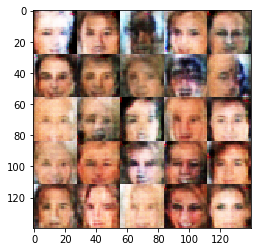

Epoch 1/1 Step 2710... Discriminator Loss: 1.1130... Generator Loss: 1.8155
Epoch 1/1 Step 2720... Discriminator Loss: 1.4508... Generator Loss: 0.7309
Epoch 1/1 Step 2730... Discriminator Loss: 1.4380... Generator Loss: 0.7746
Epoch 1/1 Step 2740... Discriminator Loss: 1.1560... Generator Loss: 0.8278
Epoch 1/1 Step 2750... Discriminator Loss: 1.2441... Generator Loss: 0.9868
Epoch 1/1 Step 2760... Discriminator Loss: 0.9599... Generator Loss: 1.0048
Epoch 1/1 Step 2770... Discriminator Loss: 1.5653... Generator Loss: 0.6921
Epoch 1/1 Step 2780... Discriminator Loss: 1.6049... Generator Loss: 0.7021
Epoch 1/1 Step 2790... Discriminator Loss: 1.3823... Generator Loss: 0.6853
Epoch 1/1 Step 2800... Discriminator Loss: 1.1453... Generator Loss: 1.0238


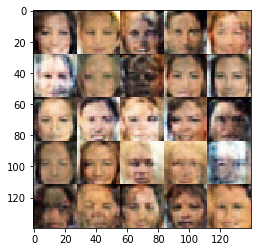

Epoch 1/1 Step 2810... Discriminator Loss: 1.2001... Generator Loss: 0.8984
Epoch 1/1 Step 2820... Discriminator Loss: 1.6316... Generator Loss: 0.3902
Epoch 1/1 Step 2830... Discriminator Loss: 1.2309... Generator Loss: 0.9427
Epoch 1/1 Step 2840... Discriminator Loss: 1.2542... Generator Loss: 0.6681
Epoch 1/1 Step 2850... Discriminator Loss: 1.3169... Generator Loss: 0.6864
Epoch 1/1 Step 2860... Discriminator Loss: 1.0716... Generator Loss: 0.8417
Epoch 1/1 Step 2870... Discriminator Loss: 1.4093... Generator Loss: 0.4958
Epoch 1/1 Step 2880... Discriminator Loss: 1.3698... Generator Loss: 0.7783
Epoch 1/1 Step 2890... Discriminator Loss: 1.0405... Generator Loss: 1.0395
Epoch 1/1 Step 2900... Discriminator Loss: 1.5913... Generator Loss: 0.6080


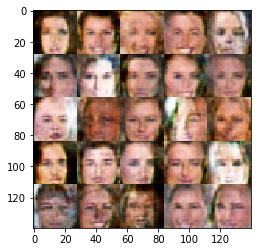

Epoch 1/1 Step 2910... Discriminator Loss: 1.1742... Generator Loss: 0.8489
Epoch 1/1 Step 2920... Discriminator Loss: 1.1431... Generator Loss: 0.6733
Epoch 1/1 Step 2930... Discriminator Loss: 1.3279... Generator Loss: 0.9280
Epoch 1/1 Step 2940... Discriminator Loss: 1.7366... Generator Loss: 0.3564
Epoch 1/1 Step 2950... Discriminator Loss: 1.2697... Generator Loss: 0.9575
Epoch 1/1 Step 2960... Discriminator Loss: 1.4265... Generator Loss: 0.6433
Epoch 1/1 Step 2970... Discriminator Loss: 1.3865... Generator Loss: 0.5733
Epoch 1/1 Step 2980... Discriminator Loss: 1.5285... Generator Loss: 0.4440
Epoch 1/1 Step 2990... Discriminator Loss: 1.1413... Generator Loss: 0.8435
Epoch 1/1 Step 3000... Discriminator Loss: 1.5463... Generator Loss: 0.7320


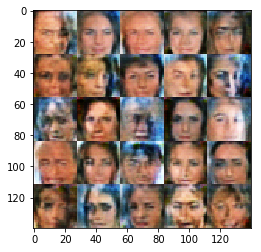

Epoch 1/1 Step 3010... Discriminator Loss: 1.3196... Generator Loss: 0.7821
Epoch 1/1 Step 3020... Discriminator Loss: 1.1606... Generator Loss: 0.9086
Epoch 1/1 Step 3030... Discriminator Loss: 1.5746... Generator Loss: 0.6212
Epoch 1/1 Step 3040... Discriminator Loss: 1.4101... Generator Loss: 0.6792
Epoch 1/1 Step 3050... Discriminator Loss: 0.9800... Generator Loss: 1.0504
Epoch 1/1 Step 3060... Discriminator Loss: 1.3791... Generator Loss: 0.4875
Epoch 1/1 Step 3070... Discriminator Loss: 1.1503... Generator Loss: 0.7992
Epoch 1/1 Step 3080... Discriminator Loss: 1.4164... Generator Loss: 0.5391
Epoch 1/1 Step 3090... Discriminator Loss: 1.5019... Generator Loss: 0.5268
Epoch 1/1 Step 3100... Discriminator Loss: 1.1167... Generator Loss: 0.9359


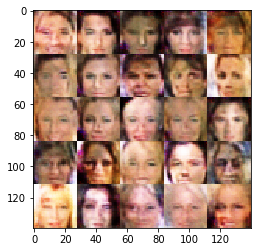

Epoch 1/1 Step 3110... Discriminator Loss: 1.6017... Generator Loss: 0.3763
Epoch 1/1 Step 3120... Discriminator Loss: 1.1336... Generator Loss: 0.9028
Epoch 1/1 Step 3130... Discriminator Loss: 1.0091... Generator Loss: 0.9352
Epoch 1/1 Step 3140... Discriminator Loss: 1.2945... Generator Loss: 0.8607
Epoch 1/1 Step 3150... Discriminator Loss: 1.2922... Generator Loss: 0.6591
Epoch 1/1 Step 3160... Discriminator Loss: 1.4646... Generator Loss: 0.6922
Epoch 1/1 Step 3170... Discriminator Loss: 1.3000... Generator Loss: 0.9262
Epoch 1/1 Step 3180... Discriminator Loss: 1.2726... Generator Loss: 1.5072
Epoch 1/1 Step 3190... Discriminator Loss: 1.3653... Generator Loss: 0.5410
Epoch 1/1 Step 3200... Discriminator Loss: 1.3424... Generator Loss: 0.7457


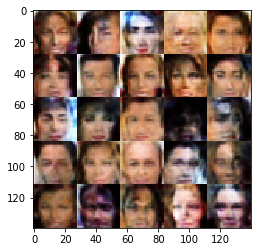

Epoch 1/1 Step 3210... Discriminator Loss: 1.4065... Generator Loss: 0.6548
Epoch 1/1 Step 3220... Discriminator Loss: 0.9571... Generator Loss: 1.2874
Epoch 1/1 Step 3230... Discriminator Loss: 1.2747... Generator Loss: 0.5880
Epoch 1/1 Step 3240... Discriminator Loss: 1.0172... Generator Loss: 1.0870
Epoch 1/1 Step 3250... Discriminator Loss: 1.1446... Generator Loss: 0.7903
Epoch 1/1 Step 3260... Discriminator Loss: 1.4967... Generator Loss: 0.4634
Epoch 1/1 Step 3270... Discriminator Loss: 1.4419... Generator Loss: 0.4913
Epoch 1/1 Step 3280... Discriminator Loss: 1.6569... Generator Loss: 0.4143
Epoch 1/1 Step 3290... Discriminator Loss: 1.0778... Generator Loss: 1.1150
Epoch 1/1 Step 3300... Discriminator Loss: 1.4202... Generator Loss: 0.4745


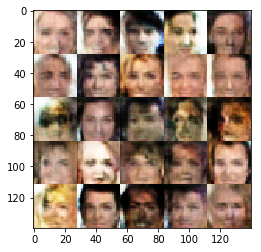

Epoch 1/1 Step 3310... Discriminator Loss: 0.8178... Generator Loss: 1.2744
Epoch 1/1 Step 3320... Discriminator Loss: 1.3035... Generator Loss: 1.4377
Epoch 1/1 Step 3330... Discriminator Loss: 1.0664... Generator Loss: 2.0561
Epoch 1/1 Step 3340... Discriminator Loss: 1.2863... Generator Loss: 0.7661
Epoch 1/1 Step 3350... Discriminator Loss: 1.5050... Generator Loss: 0.6530
Epoch 1/1 Step 3360... Discriminator Loss: 1.3128... Generator Loss: 0.5846
Epoch 1/1 Step 3370... Discriminator Loss: 0.9457... Generator Loss: 1.3424
Epoch 1/1 Step 3380... Discriminator Loss: 0.6240... Generator Loss: 1.6910
Epoch 1/1 Step 3390... Discriminator Loss: 0.8749... Generator Loss: 1.1280
Epoch 1/1 Step 3400... Discriminator Loss: 1.4282... Generator Loss: 0.5079


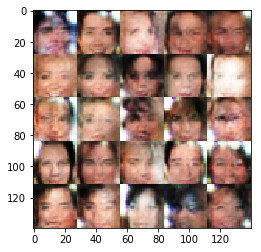

Epoch 1/1 Step 3410... Discriminator Loss: 0.5406... Generator Loss: 1.7803
Epoch 1/1 Step 3420... Discriminator Loss: 1.2538... Generator Loss: 0.5900
Epoch 1/1 Step 3430... Discriminator Loss: 1.0981... Generator Loss: 0.8156
Epoch 1/1 Step 3440... Discriminator Loss: 1.3025... Generator Loss: 0.6572
Epoch 1/1 Step 3450... Discriminator Loss: 1.6234... Generator Loss: 0.4400
Epoch 1/1 Step 3460... Discriminator Loss: 1.2918... Generator Loss: 0.7109
Epoch 1/1 Step 3470... Discriminator Loss: 1.5619... Generator Loss: 0.4534
Epoch 1/1 Step 3480... Discriminator Loss: 1.5046... Generator Loss: 1.4515
Epoch 1/1 Step 3490... Discriminator Loss: 1.1330... Generator Loss: 0.8117
Epoch 1/1 Step 3500... Discriminator Loss: 1.2549... Generator Loss: 0.6031


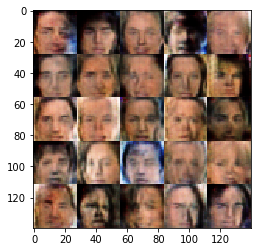

Epoch 1/1 Step 3510... Discriminator Loss: 0.9181... Generator Loss: 1.0377
Epoch 1/1 Step 3520... Discriminator Loss: 1.3842... Generator Loss: 0.6046
Epoch 1/1 Step 3530... Discriminator Loss: 1.0402... Generator Loss: 1.0199
Epoch 1/1 Step 3540... Discriminator Loss: 1.3292... Generator Loss: 0.8342
Epoch 1/1 Step 3550... Discriminator Loss: 1.4313... Generator Loss: 0.5993
Epoch 1/1 Step 3560... Discriminator Loss: 1.3247... Generator Loss: 0.8530
Epoch 1/1 Step 3570... Discriminator Loss: 1.8445... Generator Loss: 0.3615
Epoch 1/1 Step 3580... Discriminator Loss: 0.9534... Generator Loss: 1.2207
Epoch 1/1 Step 3590... Discriminator Loss: 0.6572... Generator Loss: 1.6825
Epoch 1/1 Step 3600... Discriminator Loss: 1.4573... Generator Loss: 0.5049


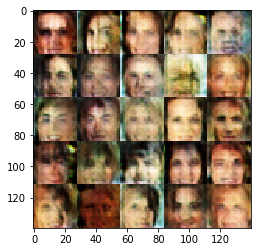

Epoch 1/1 Step 3610... Discriminator Loss: 1.3432... Generator Loss: 0.6206
Epoch 1/1 Step 3620... Discriminator Loss: 0.9165... Generator Loss: 1.2760
Epoch 1/1 Step 3630... Discriminator Loss: 1.0739... Generator Loss: 0.7822
Epoch 1/1 Step 3640... Discriminator Loss: 1.6881... Generator Loss: 0.3111
Epoch 1/1 Step 3650... Discriminator Loss: 1.3554... Generator Loss: 0.6075
Epoch 1/1 Step 3660... Discriminator Loss: 1.1948... Generator Loss: 0.8761
Epoch 1/1 Step 3670... Discriminator Loss: 1.1173... Generator Loss: 0.8875
Epoch 1/1 Step 3680... Discriminator Loss: 1.1345... Generator Loss: 1.1458
Epoch 1/1 Step 3690... Discriminator Loss: 0.9686... Generator Loss: 0.9922
Epoch 1/1 Step 3700... Discriminator Loss: 1.5590... Generator Loss: 0.6763


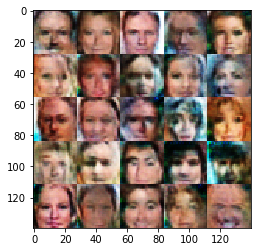

Epoch 1/1 Step 3710... Discriminator Loss: 1.2597... Generator Loss: 0.8041
Epoch 1/1 Step 3720... Discriminator Loss: 1.0762... Generator Loss: 1.0697
Epoch 1/1 Step 3730... Discriminator Loss: 1.4104... Generator Loss: 0.6476
Epoch 1/1 Step 3740... Discriminator Loss: 1.1673... Generator Loss: 0.7028
Epoch 1/1 Step 3750... Discriminator Loss: 1.6191... Generator Loss: 0.5276
Epoch 1/1 Step 3760... Discriminator Loss: 1.4290... Generator Loss: 0.7574
Epoch 1/1 Step 3770... Discriminator Loss: 1.4532... Generator Loss: 0.5386
Epoch 1/1 Step 3780... Discriminator Loss: 1.1116... Generator Loss: 1.1531
Epoch 1/1 Step 3790... Discriminator Loss: 1.0906... Generator Loss: 0.9473
Epoch 1/1 Step 3800... Discriminator Loss: 1.3473... Generator Loss: 0.5402


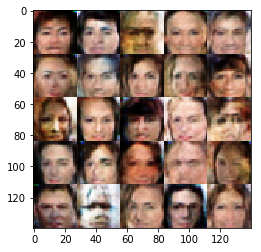

Epoch 1/1 Step 3810... Discriminator Loss: 1.0497... Generator Loss: 0.9265
Epoch 1/1 Step 3820... Discriminator Loss: 1.3354... Generator Loss: 0.5638
Epoch 1/1 Step 3830... Discriminator Loss: 0.8442... Generator Loss: 1.6510
Epoch 1/1 Step 3840... Discriminator Loss: 1.2079... Generator Loss: 0.7149
Epoch 1/1 Step 3850... Discriminator Loss: 1.5493... Generator Loss: 0.6058
Epoch 1/1 Step 3860... Discriminator Loss: 1.1417... Generator Loss: 0.9390
Epoch 1/1 Step 3870... Discriminator Loss: 1.1398... Generator Loss: 0.6824
Epoch 1/1 Step 3880... Discriminator Loss: 1.8306... Generator Loss: 0.3685
Epoch 1/1 Step 3890... Discriminator Loss: 1.2306... Generator Loss: 0.8176
Epoch 1/1 Step 3900... Discriminator Loss: 1.2222... Generator Loss: 0.5932


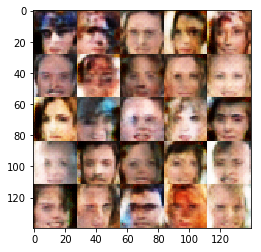

Epoch 1/1 Step 3910... Discriminator Loss: 1.0728... Generator Loss: 0.9305
Epoch 1/1 Step 3920... Discriminator Loss: 1.4011... Generator Loss: 0.6492
Epoch 1/1 Step 3930... Discriminator Loss: 1.3028... Generator Loss: 1.0296
Epoch 1/1 Step 3940... Discriminator Loss: 0.8957... Generator Loss: 1.0472
Epoch 1/1 Step 3950... Discriminator Loss: 1.4097... Generator Loss: 0.7682
Epoch 1/1 Step 3960... Discriminator Loss: 1.0502... Generator Loss: 0.9687
Epoch 1/1 Step 3970... Discriminator Loss: 1.4628... Generator Loss: 0.5931
Epoch 1/1 Step 3980... Discriminator Loss: 1.2524... Generator Loss: 0.7260
Epoch 1/1 Step 3990... Discriminator Loss: 1.3197... Generator Loss: 0.6774
Epoch 1/1 Step 4000... Discriminator Loss: 1.3122... Generator Loss: 0.6221


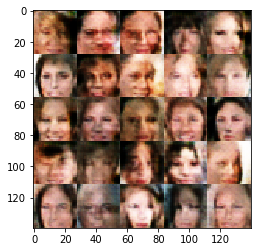

Epoch 1/1 Step 4010... Discriminator Loss: 0.9051... Generator Loss: 1.1605
Epoch 1/1 Step 4020... Discriminator Loss: 1.6188... Generator Loss: 0.4007
Epoch 1/1 Step 4030... Discriminator Loss: 1.2808... Generator Loss: 0.6520
Epoch 1/1 Step 4040... Discriminator Loss: 1.2423... Generator Loss: 0.6495
Epoch 1/1 Step 4050... Discriminator Loss: 1.1731... Generator Loss: 0.8576
Epoch 1/1 Step 4060... Discriminator Loss: 1.5755... Generator Loss: 0.7289
Epoch 1/1 Step 4070... Discriminator Loss: 1.1087... Generator Loss: 0.7238
Epoch 1/1 Step 4080... Discriminator Loss: 1.1113... Generator Loss: 0.8665
Epoch 1/1 Step 4090... Discriminator Loss: 1.3275... Generator Loss: 0.6415
Epoch 1/1 Step 4100... Discriminator Loss: 1.2887... Generator Loss: 0.8187


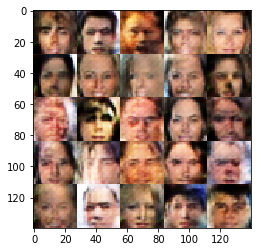

Epoch 1/1 Step 4110... Discriminator Loss: 1.1416... Generator Loss: 0.9825
Epoch 1/1 Step 4120... Discriminator Loss: 1.2581... Generator Loss: 0.8032
Epoch 1/1 Step 4130... Discriminator Loss: 1.3154... Generator Loss: 0.6631
Epoch 1/1 Step 4140... Discriminator Loss: 1.2395... Generator Loss: 1.3066
Epoch 1/1 Step 4150... Discriminator Loss: 1.3717... Generator Loss: 1.4994
Epoch 1/1 Step 4160... Discriminator Loss: 1.3706... Generator Loss: 0.6506
Epoch 1/1 Step 4170... Discriminator Loss: 1.0762... Generator Loss: 0.7726
Epoch 1/1 Step 4180... Discriminator Loss: 1.0892... Generator Loss: 0.8585
Epoch 1/1 Step 4190... Discriminator Loss: 1.6276... Generator Loss: 0.4466
Epoch 1/1 Step 4200... Discriminator Loss: 1.1469... Generator Loss: 0.7180


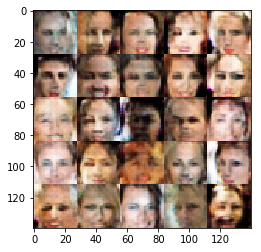

Epoch 1/1 Step 4210... Discriminator Loss: 1.2830... Generator Loss: 0.6678
Epoch 1/1 Step 4220... Discriminator Loss: 0.8870... Generator Loss: 1.0516
Epoch 1/1 Step 4230... Discriminator Loss: 1.5373... Generator Loss: 0.5203
Epoch 1/1 Step 4240... Discriminator Loss: 1.2113... Generator Loss: 0.8670
Epoch 1/1 Step 4250... Discriminator Loss: 1.2527... Generator Loss: 0.9599
Epoch 1/1 Step 4260... Discriminator Loss: 1.2831... Generator Loss: 0.9137
Epoch 1/1 Step 4270... Discriminator Loss: 1.4665... Generator Loss: 0.7097
Epoch 1/1 Step 4280... Discriminator Loss: 1.7860... Generator Loss: 0.4296
Epoch 1/1 Step 4290... Discriminator Loss: 1.3217... Generator Loss: 0.8523
Epoch 1/1 Step 4300... Discriminator Loss: 1.3989... Generator Loss: 0.6980


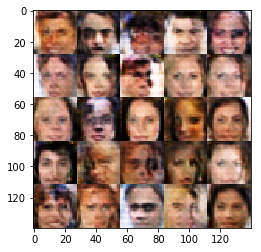

Epoch 1/1 Step 4310... Discriminator Loss: 1.5046... Generator Loss: 0.4891
Epoch 1/1 Step 4320... Discriminator Loss: 1.2772... Generator Loss: 0.8436
Epoch 1/1 Step 4330... Discriminator Loss: 1.4729... Generator Loss: 0.5682
Epoch 1/1 Step 4340... Discriminator Loss: 1.2992... Generator Loss: 0.7395
Epoch 1/1 Step 4350... Discriminator Loss: 1.3322... Generator Loss: 0.7422
Epoch 1/1 Step 4360... Discriminator Loss: 1.5016... Generator Loss: 0.5521
Epoch 1/1 Step 4370... Discriminator Loss: 1.5435... Generator Loss: 0.4784
Epoch 1/1 Step 4380... Discriminator Loss: 1.4527... Generator Loss: 0.5581
Epoch 1/1 Step 4390... Discriminator Loss: 1.1652... Generator Loss: 1.1391
Epoch 1/1 Step 4400... Discriminator Loss: 1.5597... Generator Loss: 0.3954


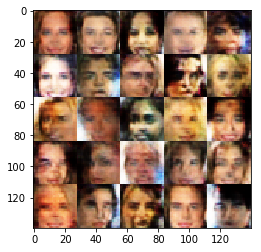

Epoch 1/1 Step 4410... Discriminator Loss: 1.2531... Generator Loss: 0.7905
Epoch 1/1 Step 4420... Discriminator Loss: 1.1271... Generator Loss: 0.9876
Epoch 1/1 Step 4430... Discriminator Loss: 1.0952... Generator Loss: 1.0493
Epoch 1/1 Step 4440... Discriminator Loss: 1.4000... Generator Loss: 0.4879
Epoch 1/1 Step 4450... Discriminator Loss: 1.2512... Generator Loss: 0.7175
Epoch 1/1 Step 4460... Discriminator Loss: 1.0947... Generator Loss: 0.8057
Epoch 1/1 Step 4470... Discriminator Loss: 1.3605... Generator Loss: 0.8008
Epoch 1/1 Step 4480... Discriminator Loss: 1.1799... Generator Loss: 0.8447
Epoch 1/1 Step 4490... Discriminator Loss: 1.2758... Generator Loss: 0.6971
Epoch 1/1 Step 4500... Discriminator Loss: 1.3848... Generator Loss: 0.6261


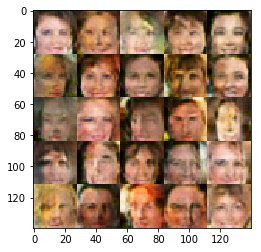

Epoch 1/1 Step 4510... Discriminator Loss: 1.2526... Generator Loss: 0.9141
Epoch 1/1 Step 4520... Discriminator Loss: 1.4172... Generator Loss: 0.6472
Epoch 1/1 Step 4530... Discriminator Loss: 1.1479... Generator Loss: 0.6557
Epoch 1/1 Step 4540... Discriminator Loss: 1.1579... Generator Loss: 0.7575
Epoch 1/1 Step 4550... Discriminator Loss: 1.1679... Generator Loss: 0.7653
Epoch 1/1 Step 4560... Discriminator Loss: 1.1493... Generator Loss: 0.6992
Epoch 1/1 Step 4570... Discriminator Loss: 1.1244... Generator Loss: 0.9523
Epoch 1/1 Step 4580... Discriminator Loss: 1.1327... Generator Loss: 0.9142
Epoch 1/1 Step 4590... Discriminator Loss: 1.3701... Generator Loss: 0.6742
Epoch 1/1 Step 4600... Discriminator Loss: 1.3872... Generator Loss: 0.6844


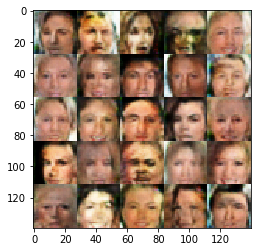

Epoch 1/1 Step 4610... Discriminator Loss: 1.6040... Generator Loss: 0.5436
Epoch 1/1 Step 4620... Discriminator Loss: 1.4051... Generator Loss: 0.7197
Epoch 1/1 Step 4630... Discriminator Loss: 1.4963... Generator Loss: 0.7625
Epoch 1/1 Step 4640... Discriminator Loss: 1.2777... Generator Loss: 0.6827
Epoch 1/1 Step 4650... Discriminator Loss: 1.4231... Generator Loss: 0.5915
Epoch 1/1 Step 4660... Discriminator Loss: 1.2340... Generator Loss: 0.9261
Epoch 1/1 Step 4670... Discriminator Loss: 1.3666... Generator Loss: 0.6273
Epoch 1/1 Step 4680... Discriminator Loss: 1.2795... Generator Loss: 1.2789
Epoch 1/1 Step 4690... Discriminator Loss: 1.2610... Generator Loss: 0.7076
Epoch 1/1 Step 4700... Discriminator Loss: 1.2459... Generator Loss: 0.6485


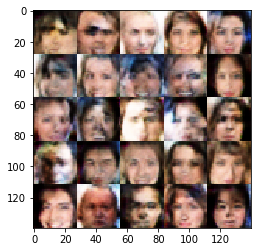

Epoch 1/1 Step 4710... Discriminator Loss: 1.2752... Generator Loss: 0.8920
Epoch 1/1 Step 4720... Discriminator Loss: 1.1905... Generator Loss: 0.6686
Epoch 1/1 Step 4730... Discriminator Loss: 1.1097... Generator Loss: 0.8679
Epoch 1/1 Step 4740... Discriminator Loss: 1.4884... Generator Loss: 0.8931
Epoch 1/1 Step 4750... Discriminator Loss: 1.2427... Generator Loss: 0.8128
Epoch 1/1 Step 4760... Discriminator Loss: 1.1581... Generator Loss: 0.9020
Epoch 1/1 Step 4770... Discriminator Loss: 1.1103... Generator Loss: 1.0758
Epoch 1/1 Step 4780... Discriminator Loss: 1.5856... Generator Loss: 0.4505
Epoch 1/1 Step 4790... Discriminator Loss: 1.1351... Generator Loss: 0.8146
Epoch 1/1 Step 4800... Discriminator Loss: 1.1046... Generator Loss: 1.5503


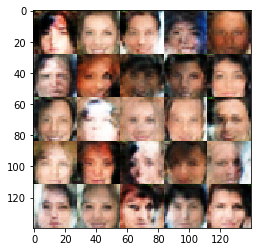

Epoch 1/1 Step 4810... Discriminator Loss: 1.2511... Generator Loss: 0.7935
Epoch 1/1 Step 4820... Discriminator Loss: 1.4825... Generator Loss: 0.5247
Epoch 1/1 Step 4830... Discriminator Loss: 1.3364... Generator Loss: 0.7644
Epoch 1/1 Step 4840... Discriminator Loss: 1.2555... Generator Loss: 0.8001
Epoch 1/1 Step 4850... Discriminator Loss: 1.5098... Generator Loss: 0.5291
Epoch 1/1 Step 4860... Discriminator Loss: 1.1214... Generator Loss: 0.8086
Epoch 1/1 Step 4870... Discriminator Loss: 0.9471... Generator Loss: 1.0992
Epoch 1/1 Step 4880... Discriminator Loss: 1.4278... Generator Loss: 0.4923
Epoch 1/1 Step 4890... Discriminator Loss: 1.1574... Generator Loss: 0.9071
Epoch 1/1 Step 4900... Discriminator Loss: 1.3442... Generator Loss: 0.6205


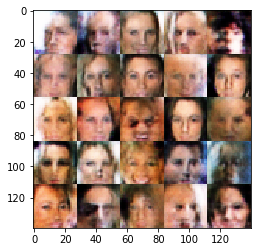

Epoch 1/1 Step 4910... Discriminator Loss: 1.5675... Generator Loss: 0.5888
Epoch 1/1 Step 4920... Discriminator Loss: 1.2793... Generator Loss: 1.0379
Epoch 1/1 Step 4930... Discriminator Loss: 0.7680... Generator Loss: 1.3468
Epoch 1/1 Step 4940... Discriminator Loss: 1.1819... Generator Loss: 0.7626
Epoch 1/1 Step 4950... Discriminator Loss: 1.3576... Generator Loss: 0.5543
Epoch 1/1 Step 4960... Discriminator Loss: 1.3900... Generator Loss: 0.5422
Epoch 1/1 Step 4970... Discriminator Loss: 1.2906... Generator Loss: 0.6776
Epoch 1/1 Step 4980... Discriminator Loss: 1.5798... Generator Loss: 0.4694
Epoch 1/1 Step 4990... Discriminator Loss: 1.2321... Generator Loss: 0.7596
Epoch 1/1 Step 5000... Discriminator Loss: 1.1355... Generator Loss: 0.9503


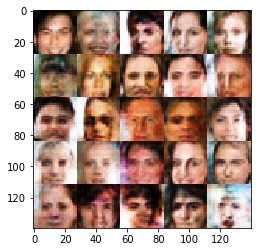

Epoch 1/1 Step 5010... Discriminator Loss: 0.9773... Generator Loss: 1.2667
Epoch 1/1 Step 5020... Discriminator Loss: 1.3196... Generator Loss: 0.7306
Epoch 1/1 Step 5030... Discriminator Loss: 1.5416... Generator Loss: 0.5010
Epoch 1/1 Step 5040... Discriminator Loss: 1.1775... Generator Loss: 0.8473
Epoch 1/1 Step 5050... Discriminator Loss: 1.1869... Generator Loss: 1.0897
Epoch 1/1 Step 5060... Discriminator Loss: 1.3472... Generator Loss: 0.6884
Epoch 1/1 Step 5070... Discriminator Loss: 1.3159... Generator Loss: 0.7256
Epoch 1/1 Step 5080... Discriminator Loss: 1.5239... Generator Loss: 0.5269
Epoch 1/1 Step 5090... Discriminator Loss: 1.1863... Generator Loss: 0.7749
Epoch 1/1 Step 5100... Discriminator Loss: 1.2413... Generator Loss: 0.8327


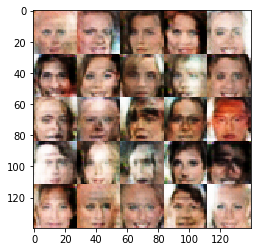

Epoch 1/1 Step 5110... Discriminator Loss: 1.4640... Generator Loss: 0.6977
Epoch 1/1 Step 5120... Discriminator Loss: 1.3241... Generator Loss: 0.6868
Epoch 1/1 Step 5130... Discriminator Loss: 1.1038... Generator Loss: 0.8346
Epoch 1/1 Step 5140... Discriminator Loss: 0.9606... Generator Loss: 1.0665
Epoch 1/1 Step 5150... Discriminator Loss: 1.4141... Generator Loss: 0.7941
Epoch 1/1 Step 5160... Discriminator Loss: 1.1234... Generator Loss: 0.8069
Epoch 1/1 Step 5170... Discriminator Loss: 1.0203... Generator Loss: 1.0495
Epoch 1/1 Step 5180... Discriminator Loss: 1.8394... Generator Loss: 0.6415
Epoch 1/1 Step 5190... Discriminator Loss: 1.2397... Generator Loss: 0.7363
Epoch 1/1 Step 5200... Discriminator Loss: 1.1688... Generator Loss: 0.7336


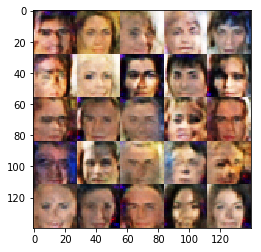

Epoch 1/1 Step 5210... Discriminator Loss: 1.5071... Generator Loss: 0.5630
Epoch 1/1 Step 5220... Discriminator Loss: 1.2517... Generator Loss: 0.8267
Epoch 1/1 Step 5230... Discriminator Loss: 1.5373... Generator Loss: 0.4831
Epoch 1/1 Step 5240... Discriminator Loss: 1.1251... Generator Loss: 0.8354
Epoch 1/1 Step 5250... Discriminator Loss: 1.1300... Generator Loss: 1.0445
Epoch 1/1 Step 5260... Discriminator Loss: 1.2381... Generator Loss: 0.8673
Epoch 1/1 Step 5270... Discriminator Loss: 1.1528... Generator Loss: 1.0463
Epoch 1/1 Step 5280... Discriminator Loss: 1.1434... Generator Loss: 0.8151
Epoch 1/1 Step 5290... Discriminator Loss: 0.6488... Generator Loss: 2.1496
Epoch 1/1 Step 5300... Discriminator Loss: 1.0478... Generator Loss: 0.9805


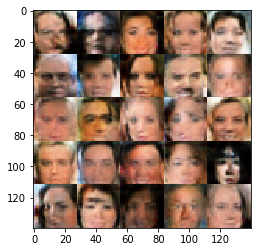

Epoch 1/1 Step 5310... Discriminator Loss: 1.6222... Generator Loss: 0.4247
Epoch 1/1 Step 5320... Discriminator Loss: 1.4452... Generator Loss: 0.9035
Epoch 1/1 Step 5330... Discriminator Loss: 1.2431... Generator Loss: 0.7869
Epoch 1/1 Step 5340... Discriminator Loss: 1.3262... Generator Loss: 0.7411
Epoch 1/1 Step 5350... Discriminator Loss: 1.3289... Generator Loss: 0.7119
Epoch 1/1 Step 5360... Discriminator Loss: 1.0684... Generator Loss: 1.1943
Epoch 1/1 Step 5370... Discriminator Loss: 1.3638... Generator Loss: 0.7294
Epoch 1/1 Step 5380... Discriminator Loss: 1.3292... Generator Loss: 0.7721
Epoch 1/1 Step 5390... Discriminator Loss: 1.3045... Generator Loss: 0.7511
Epoch 1/1 Step 5400... Discriminator Loss: 1.3821... Generator Loss: 0.7198


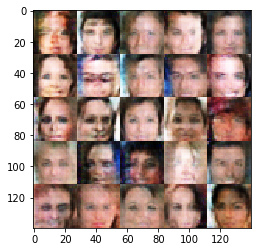

Epoch 1/1 Step 5410... Discriminator Loss: 1.1358... Generator Loss: 1.0006
Epoch 1/1 Step 5420... Discriminator Loss: 1.2647... Generator Loss: 0.6325
Epoch 1/1 Step 5430... Discriminator Loss: 1.2682... Generator Loss: 0.7654
Epoch 1/1 Step 5440... Discriminator Loss: 1.3005... Generator Loss: 0.6969
Epoch 1/1 Step 5450... Discriminator Loss: 1.2421... Generator Loss: 0.6714
Epoch 1/1 Step 5460... Discriminator Loss: 1.3288... Generator Loss: 0.7603
Epoch 1/1 Step 5470... Discriminator Loss: 1.0214... Generator Loss: 1.1452
Epoch 1/1 Step 5480... Discriminator Loss: 1.1161... Generator Loss: 0.7809
Epoch 1/1 Step 5490... Discriminator Loss: 1.1530... Generator Loss: 0.8188
Epoch 1/1 Step 5500... Discriminator Loss: 0.8816... Generator Loss: 1.2329


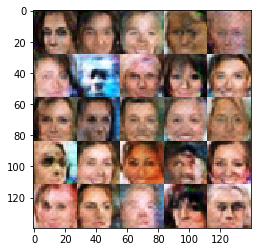

Epoch 1/1 Step 5510... Discriminator Loss: 1.3048... Generator Loss: 0.6176
Epoch 1/1 Step 5520... Discriminator Loss: 1.4414... Generator Loss: 0.5286
Epoch 1/1 Step 5530... Discriminator Loss: 1.2137... Generator Loss: 0.8334
Epoch 1/1 Step 5540... Discriminator Loss: 1.1530... Generator Loss: 0.7966
Epoch 1/1 Step 5550... Discriminator Loss: 1.5004... Generator Loss: 0.4607
Epoch 1/1 Step 5560... Discriminator Loss: 1.2410... Generator Loss: 0.8145
Epoch 1/1 Step 5570... Discriminator Loss: 1.3146... Generator Loss: 0.8226
Epoch 1/1 Step 5580... Discriminator Loss: 1.4102... Generator Loss: 0.5701
Epoch 1/1 Step 5590... Discriminator Loss: 1.4799... Generator Loss: 0.7132
Epoch 1/1 Step 5600... Discriminator Loss: 1.4519... Generator Loss: 0.5701


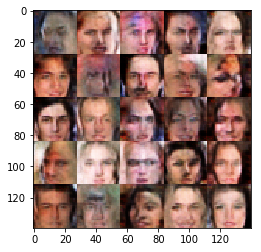

Epoch 1/1 Step 5610... Discriminator Loss: 1.4511... Generator Loss: 0.5491
Epoch 1/1 Step 5620... Discriminator Loss: 1.3149... Generator Loss: 0.6012
Epoch 1/1 Step 5630... Discriminator Loss: 1.4393... Generator Loss: 0.5581
Epoch 1/1 Step 5640... Discriminator Loss: 1.1261... Generator Loss: 0.9926
Epoch 1/1 Step 5650... Discriminator Loss: 1.6112... Generator Loss: 0.5996
Epoch 1/1 Step 5660... Discriminator Loss: 1.1766... Generator Loss: 0.8223
Epoch 1/1 Step 5670... Discriminator Loss: 1.0761... Generator Loss: 1.2080
Epoch 1/1 Step 5680... Discriminator Loss: 1.3688... Generator Loss: 0.6634
Epoch 1/1 Step 5690... Discriminator Loss: 1.2002... Generator Loss: 0.7413
Epoch 1/1 Step 5700... Discriminator Loss: 1.3081... Generator Loss: 0.6533


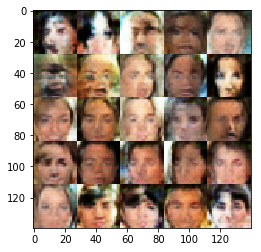

Epoch 1/1 Step 5710... Discriminator Loss: 1.1480... Generator Loss: 0.8601
Epoch 1/1 Step 5720... Discriminator Loss: 1.5220... Generator Loss: 0.7322
Epoch 1/1 Step 5730... Discriminator Loss: 1.2345... Generator Loss: 0.9238
Epoch 1/1 Step 5740... Discriminator Loss: 1.3431... Generator Loss: 0.7175
Epoch 1/1 Step 5750... Discriminator Loss: 1.3746... Generator Loss: 0.7482
Epoch 1/1 Step 5760... Discriminator Loss: 1.1284... Generator Loss: 0.7962
Epoch 1/1 Step 5770... Discriminator Loss: 1.0588... Generator Loss: 0.9869
Epoch 1/1 Step 5780... Discriminator Loss: 1.5756... Generator Loss: 0.6740
Epoch 1/1 Step 5790... Discriminator Loss: 1.3172... Generator Loss: 0.7440
Epoch 1/1 Step 5800... Discriminator Loss: 0.9493... Generator Loss: 1.0723


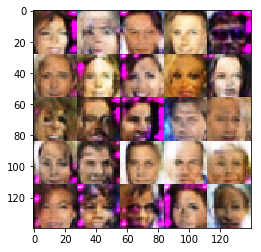

Epoch 1/1 Step 5810... Discriminator Loss: 0.7744... Generator Loss: 1.2212
Epoch 1/1 Step 5820... Discriminator Loss: 2.0016... Generator Loss: 0.2507
Epoch 1/1 Step 5830... Discriminator Loss: 1.2639... Generator Loss: 0.5652
Epoch 1/1 Step 5840... Discriminator Loss: 1.1743... Generator Loss: 1.6267
Epoch 1/1 Step 5850... Discriminator Loss: 1.0826... Generator Loss: 1.0608
Epoch 1/1 Step 5860... Discriminator Loss: 1.8046... Generator Loss: 0.2799
Epoch 1/1 Step 5870... Discriminator Loss: 1.5279... Generator Loss: 0.5466
Epoch 1/1 Step 5880... Discriminator Loss: 1.8817... Generator Loss: 0.5317
Epoch 1/1 Step 5890... Discriminator Loss: 1.4907... Generator Loss: 0.6199
Epoch 1/1 Step 5900... Discriminator Loss: 1.2219... Generator Loss: 0.8085


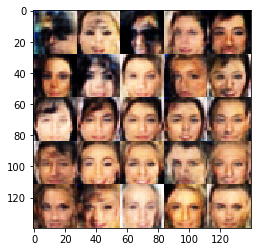

Epoch 1/1 Step 5910... Discriminator Loss: 1.2940... Generator Loss: 0.6247
Epoch 1/1 Step 5920... Discriminator Loss: 1.0131... Generator Loss: 0.9599
Epoch 1/1 Step 5930... Discriminator Loss: 1.3150... Generator Loss: 0.7738
Epoch 1/1 Step 5940... Discriminator Loss: 1.4177... Generator Loss: 0.6615
Epoch 1/1 Step 5950... Discriminator Loss: 0.8535... Generator Loss: 1.0959
Epoch 1/1 Step 5960... Discriminator Loss: 0.9877... Generator Loss: 1.1843
Epoch 1/1 Step 5970... Discriminator Loss: 1.4346... Generator Loss: 0.5726
Epoch 1/1 Step 5980... Discriminator Loss: 1.4112... Generator Loss: 0.6474
Epoch 1/1 Step 5990... Discriminator Loss: 1.1736... Generator Loss: 0.8010
Epoch 1/1 Step 6000... Discriminator Loss: 1.4047... Generator Loss: 0.7684


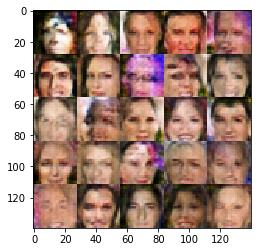

Epoch 1/1 Step 6010... Discriminator Loss: 1.2251... Generator Loss: 0.7980
Epoch 1/1 Step 6020... Discriminator Loss: 1.2203... Generator Loss: 0.8184
Epoch 1/1 Step 6030... Discriminator Loss: 1.3745... Generator Loss: 0.7077
Epoch 1/1 Step 6040... Discriminator Loss: 1.1248... Generator Loss: 0.9594
Epoch 1/1 Step 6050... Discriminator Loss: 1.2627... Generator Loss: 0.7227
Epoch 1/1 Step 6060... Discriminator Loss: 1.0260... Generator Loss: 0.8989
Epoch 1/1 Step 6070... Discriminator Loss: 1.3364... Generator Loss: 0.7983
Epoch 1/1 Step 6080... Discriminator Loss: 1.2222... Generator Loss: 0.8540
Epoch 1/1 Step 6090... Discriminator Loss: 1.3700... Generator Loss: 0.6663
Epoch 1/1 Step 6100... Discriminator Loss: 1.3590... Generator Loss: 0.9593


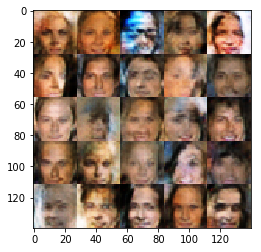

Epoch 1/1 Step 6110... Discriminator Loss: 1.4174... Generator Loss: 0.6710
Epoch 1/1 Step 6120... Discriminator Loss: 1.2182... Generator Loss: 0.8057
Epoch 1/1 Step 6130... Discriminator Loss: 1.5318... Generator Loss: 0.5998
Epoch 1/1 Step 6140... Discriminator Loss: 0.9104... Generator Loss: 1.1056
Epoch 1/1 Step 6150... Discriminator Loss: 1.5346... Generator Loss: 1.1803
Epoch 1/1 Step 6160... Discriminator Loss: 1.3652... Generator Loss: 0.6699
Epoch 1/1 Step 6170... Discriminator Loss: 1.1766... Generator Loss: 0.8267
Epoch 1/1 Step 6180... Discriminator Loss: 1.2200... Generator Loss: 0.7327
Epoch 1/1 Step 6190... Discriminator Loss: 1.4282... Generator Loss: 0.7789
Epoch 1/1 Step 6200... Discriminator Loss: 1.0160... Generator Loss: 0.9752


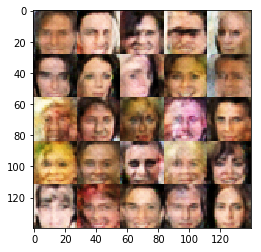

Epoch 1/1 Step 6210... Discriminator Loss: 1.6055... Generator Loss: 0.5420
Epoch 1/1 Step 6220... Discriminator Loss: 1.3667... Generator Loss: 0.6092
Epoch 1/1 Step 6230... Discriminator Loss: 1.1512... Generator Loss: 0.9501
Epoch 1/1 Step 6240... Discriminator Loss: 1.2799... Generator Loss: 0.7690
Epoch 1/1 Step 6250... Discriminator Loss: 1.7190... Generator Loss: 0.4618
Epoch 1/1 Step 6260... Discriminator Loss: 1.1170... Generator Loss: 0.9171
Epoch 1/1 Step 6270... Discriminator Loss: 1.3902... Generator Loss: 0.5552
Epoch 1/1 Step 6280... Discriminator Loss: 1.1200... Generator Loss: 1.0328
Epoch 1/1 Step 6290... Discriminator Loss: 1.7921... Generator Loss: 0.4523
Epoch 1/1 Step 6300... Discriminator Loss: 1.2457... Generator Loss: 0.7595


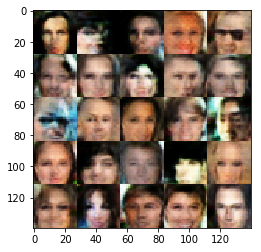

Epoch 1/1 Step 6310... Discriminator Loss: 1.3348... Generator Loss: 0.6056
Epoch 1/1 Step 6320... Discriminator Loss: 1.2301... Generator Loss: 0.7422
Epoch 1/1 Step 6330... Discriminator Loss: 1.2333... Generator Loss: 0.6674
Epoch 1/1 Step 6340... Discriminator Loss: 1.5438... Generator Loss: 0.4294
Epoch 1/1 Step 6350... Discriminator Loss: 1.3542... Generator Loss: 0.8570
Epoch 1/1 Step 6360... Discriminator Loss: 1.9595... Generator Loss: 0.3113
Epoch 1/1 Step 6370... Discriminator Loss: 1.4382... Generator Loss: 0.6643
Epoch 1/1 Step 6380... Discriminator Loss: 1.2197... Generator Loss: 0.7207
Epoch 1/1 Step 6390... Discriminator Loss: 1.3066... Generator Loss: 1.0418
Epoch 1/1 Step 6400... Discriminator Loss: 1.3101... Generator Loss: 0.8059


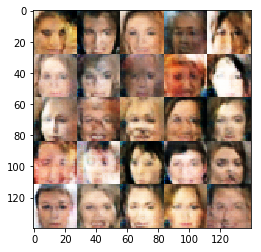

Epoch 1/1 Step 6410... Discriminator Loss: 1.5829... Generator Loss: 0.5744
Epoch 1/1 Step 6420... Discriminator Loss: 1.3347... Generator Loss: 0.8949
Epoch 1/1 Step 6430... Discriminator Loss: 1.4381... Generator Loss: 0.6597
Epoch 1/1 Step 6440... Discriminator Loss: 1.3279... Generator Loss: 0.5802
Epoch 1/1 Step 6450... Discriminator Loss: 1.2764... Generator Loss: 0.7458
Epoch 1/1 Step 6460... Discriminator Loss: 1.0603... Generator Loss: 1.1698
Epoch 1/1 Step 6470... Discriminator Loss: 1.0381... Generator Loss: 1.3113
Epoch 1/1 Step 6480... Discriminator Loss: 1.0745... Generator Loss: 0.8645
Epoch 1/1 Step 6490... Discriminator Loss: 1.1583... Generator Loss: 0.8222
Epoch 1/1 Step 6500... Discriminator Loss: 1.2443... Generator Loss: 0.6860


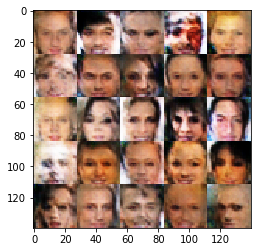

Epoch 1/1 Step 6510... Discriminator Loss: 1.5649... Generator Loss: 0.4916
Epoch 1/1 Step 6520... Discriminator Loss: 1.3119... Generator Loss: 0.6144
Epoch 1/1 Step 6530... Discriminator Loss: 1.2998... Generator Loss: 0.7938
Epoch 1/1 Step 6540... Discriminator Loss: 1.1819... Generator Loss: 0.8566
Epoch 1/1 Step 6550... Discriminator Loss: 1.1581... Generator Loss: 1.0417
Epoch 1/1 Step 6560... Discriminator Loss: 1.8313... Generator Loss: 0.4467
Epoch 1/1 Step 6570... Discriminator Loss: 1.3583... Generator Loss: 0.7632
Epoch 1/1 Step 6580... Discriminator Loss: 1.0981... Generator Loss: 1.0601
Epoch 1/1 Step 6590... Discriminator Loss: 1.2450... Generator Loss: 0.6934
Epoch 1/1 Step 6600... Discriminator Loss: 1.3011... Generator Loss: 0.8827


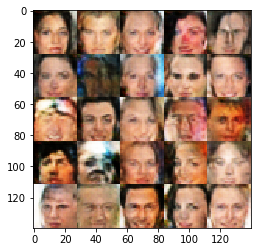

Epoch 1/1 Step 6610... Discriminator Loss: 1.5354... Generator Loss: 0.4713
Epoch 1/1 Step 6620... Discriminator Loss: 1.3742... Generator Loss: 0.7273
Epoch 1/1 Step 6630... Discriminator Loss: 1.4899... Generator Loss: 0.6480
Epoch 1/1 Step 6640... Discriminator Loss: 1.6039... Generator Loss: 0.5698
Epoch 1/1 Step 6650... Discriminator Loss: 1.4638... Generator Loss: 0.6917
Epoch 1/1 Step 6660... Discriminator Loss: 1.2172... Generator Loss: 0.8612
Epoch 1/1 Step 6670... Discriminator Loss: 1.3462... Generator Loss: 0.7989
Epoch 1/1 Step 6680... Discriminator Loss: 1.4704... Generator Loss: 0.6136
Epoch 1/1 Step 6690... Discriminator Loss: 1.3988... Generator Loss: 0.6151
Epoch 1/1 Step 6700... Discriminator Loss: 1.6189... Generator Loss: 0.6014


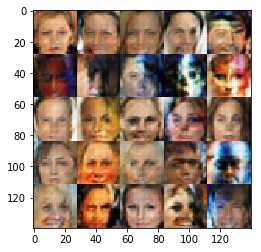

Epoch 1/1 Step 6710... Discriminator Loss: 1.3695... Generator Loss: 0.6860
Epoch 1/1 Step 6720... Discriminator Loss: 1.2626... Generator Loss: 0.6830
Epoch 1/1 Step 6730... Discriminator Loss: 1.2861... Generator Loss: 0.6323
Epoch 1/1 Step 6740... Discriminator Loss: 1.5201... Generator Loss: 0.6085
Epoch 1/1 Step 6750... Discriminator Loss: 1.2714... Generator Loss: 0.7572
Epoch 1/1 Step 6760... Discriminator Loss: 1.2589... Generator Loss: 0.6864
Epoch 1/1 Step 6770... Discriminator Loss: 1.0922... Generator Loss: 0.9270
Epoch 1/1 Step 6780... Discriminator Loss: 1.4101... Generator Loss: 0.9468
Epoch 1/1 Step 6790... Discriminator Loss: 1.0994... Generator Loss: 0.9783
Epoch 1/1 Step 6800... Discriminator Loss: 1.2582... Generator Loss: 0.7505


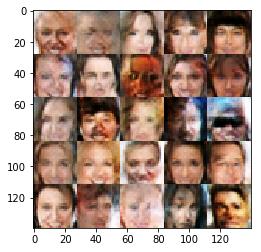

Epoch 1/1 Step 6810... Discriminator Loss: 1.0885... Generator Loss: 0.9186
Epoch 1/1 Step 6820... Discriminator Loss: 1.2799... Generator Loss: 0.7924
Epoch 1/1 Step 6830... Discriminator Loss: 1.4656... Generator Loss: 0.6014
Epoch 1/1 Step 6840... Discriminator Loss: 1.3522... Generator Loss: 0.7394
Epoch 1/1 Step 6850... Discriminator Loss: 1.3900... Generator Loss: 0.8659
Epoch 1/1 Step 6860... Discriminator Loss: 1.2470... Generator Loss: 0.8385
Epoch 1/1 Step 6870... Discriminator Loss: 1.4191... Generator Loss: 0.6386
Epoch 1/1 Step 6880... Discriminator Loss: 1.5403... Generator Loss: 0.5597
Epoch 1/1 Step 6890... Discriminator Loss: 1.4676... Generator Loss: 0.6094
Epoch 1/1 Step 6900... Discriminator Loss: 1.1968... Generator Loss: 0.6613


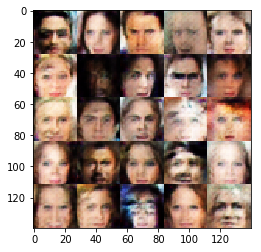

Epoch 1/1 Step 6910... Discriminator Loss: 1.2875... Generator Loss: 0.6980
Epoch 1/1 Step 6920... Discriminator Loss: 1.0392... Generator Loss: 1.1031
Epoch 1/1 Step 6930... Discriminator Loss: 1.3061... Generator Loss: 0.6851
Epoch 1/1 Step 6940... Discriminator Loss: 1.5362... Generator Loss: 0.5674
Epoch 1/1 Step 6950... Discriminator Loss: 1.0344... Generator Loss: 0.8683
Epoch 1/1 Step 6960... Discriminator Loss: 1.4745... Generator Loss: 0.5470
Epoch 1/1 Step 6970... Discriminator Loss: 1.3076... Generator Loss: 0.7239
Epoch 1/1 Step 6980... Discriminator Loss: 1.2988... Generator Loss: 0.8314
Epoch 1/1 Step 6990... Discriminator Loss: 1.3507... Generator Loss: 0.7644
Epoch 1/1 Step 7000... Discriminator Loss: 1.4165... Generator Loss: 0.7458


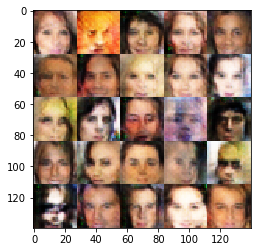

Epoch 1/1 Step 7010... Discriminator Loss: 1.3332... Generator Loss: 0.7462
Epoch 1/1 Step 7020... Discriminator Loss: 1.1968... Generator Loss: 0.8867
Epoch 1/1 Step 7030... Discriminator Loss: 1.3116... Generator Loss: 0.7301
Epoch 1/1 Step 7040... Discriminator Loss: 1.2272... Generator Loss: 0.7392
Epoch 1/1 Step 7050... Discriminator Loss: 1.5262... Generator Loss: 0.5613
Epoch 1/1 Step 7060... Discriminator Loss: 1.3929... Generator Loss: 1.2047
Epoch 1/1 Step 7070... Discriminator Loss: 1.3950... Generator Loss: 0.6417
Epoch 1/1 Step 7080... Discriminator Loss: 1.3706... Generator Loss: 0.7412
Epoch 1/1 Step 7090... Discriminator Loss: 1.1837... Generator Loss: 0.8058
Epoch 1/1 Step 7100... Discriminator Loss: 1.3864... Generator Loss: 0.6293


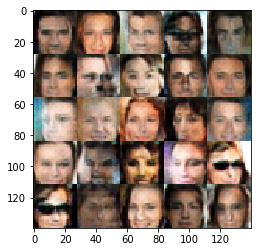

Epoch 1/1 Step 7110... Discriminator Loss: 1.5600... Generator Loss: 0.6801
Epoch 1/1 Step 7120... Discriminator Loss: 1.2405... Generator Loss: 0.7883
Epoch 1/1 Step 7130... Discriminator Loss: 1.4171... Generator Loss: 0.8136
Epoch 1/1 Step 7140... Discriminator Loss: 1.2212... Generator Loss: 0.7489
Epoch 1/1 Step 7150... Discriminator Loss: 1.0562... Generator Loss: 0.9460
Epoch 1/1 Step 7160... Discriminator Loss: 1.3218... Generator Loss: 0.8096
Epoch 1/1 Step 7170... Discriminator Loss: 1.4986... Generator Loss: 0.5687
Epoch 1/1 Step 7180... Discriminator Loss: 1.2968... Generator Loss: 0.7254
Epoch 1/1 Step 7190... Discriminator Loss: 1.2236... Generator Loss: 0.8744
Epoch 1/1 Step 7200... Discriminator Loss: 1.3376... Generator Loss: 0.6828


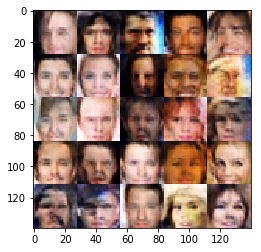

Epoch 1/1 Step 7210... Discriminator Loss: 1.4841... Generator Loss: 0.4969
Epoch 1/1 Step 7220... Discriminator Loss: 1.2194... Generator Loss: 0.8263
Epoch 1/1 Step 7230... Discriminator Loss: 1.2120... Generator Loss: 0.7799
Epoch 1/1 Step 7240... Discriminator Loss: 1.3551... Generator Loss: 0.6634
Epoch 1/1 Step 7250... Discriminator Loss: 1.1367... Generator Loss: 0.8483
Epoch 1/1 Step 7260... Discriminator Loss: 1.6826... Generator Loss: 0.4562
Epoch 1/1 Step 7270... Discriminator Loss: 1.2857... Generator Loss: 0.8039
Epoch 1/1 Step 7280... Discriminator Loss: 1.2289... Generator Loss: 0.7438
Epoch 1/1 Step 7290... Discriminator Loss: 1.3574... Generator Loss: 0.7183
Epoch 1/1 Step 7300... Discriminator Loss: 1.2120... Generator Loss: 0.9130


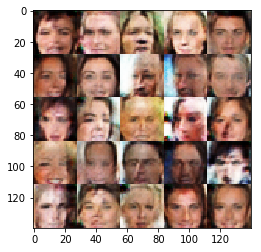

Epoch 1/1 Step 7310... Discriminator Loss: 1.2488... Generator Loss: 0.7765
Epoch 1/1 Step 7320... Discriminator Loss: 1.4900... Generator Loss: 0.5870
Epoch 1/1 Step 7330... Discriminator Loss: 1.6418... Generator Loss: 0.5588
Epoch 1/1 Step 7340... Discriminator Loss: 1.1398... Generator Loss: 0.8604
Epoch 1/1 Step 7350... Discriminator Loss: 1.1950... Generator Loss: 0.8810
Epoch 1/1 Step 7360... Discriminator Loss: 1.4023... Generator Loss: 1.0472
Epoch 1/1 Step 7370... Discriminator Loss: 0.9585... Generator Loss: 1.2455
Epoch 1/1 Step 7380... Discriminator Loss: 1.3909... Generator Loss: 0.8262
Epoch 1/1 Step 7390... Discriminator Loss: 1.2848... Generator Loss: 0.7536
Epoch 1/1 Step 7400... Discriminator Loss: 1.2340... Generator Loss: 0.7477


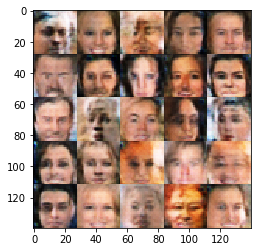

Epoch 1/1 Step 7410... Discriminator Loss: 1.3726... Generator Loss: 0.8275
Epoch 1/1 Step 7420... Discriminator Loss: 1.4346... Generator Loss: 0.6798
Epoch 1/1 Step 7430... Discriminator Loss: 1.4330... Generator Loss: 0.5932
Epoch 1/1 Step 7440... Discriminator Loss: 1.2098... Generator Loss: 0.8181
Epoch 1/1 Step 7450... Discriminator Loss: 1.4492... Generator Loss: 0.7107
Epoch 1/1 Step 7460... Discriminator Loss: 1.2700... Generator Loss: 0.8206
Epoch 1/1 Step 7470... Discriminator Loss: 1.2950... Generator Loss: 0.9104
Epoch 1/1 Step 7480... Discriminator Loss: 1.3548... Generator Loss: 0.6917
Epoch 1/1 Step 7490... Discriminator Loss: 1.4492... Generator Loss: 0.7475
Epoch 1/1 Step 7500... Discriminator Loss: 1.2871... Generator Loss: 0.6365


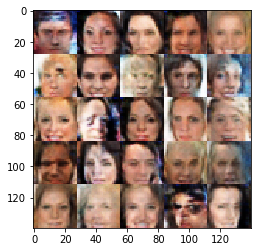

Epoch 1/1 Step 7510... Discriminator Loss: 1.3068... Generator Loss: 0.6862
Epoch 1/1 Step 7520... Discriminator Loss: 1.2357... Generator Loss: 0.7739
Epoch 1/1 Step 7530... Discriminator Loss: 1.0740... Generator Loss: 0.8744
Epoch 1/1 Step 7540... Discriminator Loss: 1.5106... Generator Loss: 0.6947
Epoch 1/1 Step 7550... Discriminator Loss: 1.3719... Generator Loss: 0.7244
Epoch 1/1 Step 7560... Discriminator Loss: 1.3771... Generator Loss: 0.6981
Epoch 1/1 Step 7570... Discriminator Loss: 1.1427... Generator Loss: 0.8754
Epoch 1/1 Step 7580... Discriminator Loss: 1.4070... Generator Loss: 0.5562
Epoch 1/1 Step 7590... Discriminator Loss: 1.3210... Generator Loss: 0.7322
Epoch 1/1 Step 7600... Discriminator Loss: 1.3888... Generator Loss: 0.6402


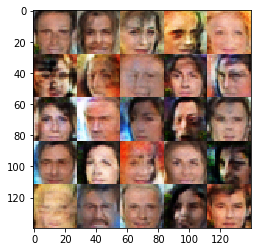

Epoch 1/1 Step 7610... Discriminator Loss: 1.2594... Generator Loss: 0.7236
Epoch 1/1 Step 7620... Discriminator Loss: 1.4342... Generator Loss: 0.6081
Epoch 1/1 Step 7630... Discriminator Loss: 1.2967... Generator Loss: 0.7771
Epoch 1/1 Step 7640... Discriminator Loss: 1.2496... Generator Loss: 0.7336
Epoch 1/1 Step 7650... Discriminator Loss: 1.3130... Generator Loss: 0.7504
Epoch 1/1 Step 7660... Discriminator Loss: 1.5485... Generator Loss: 0.6086
Epoch 1/1 Step 7670... Discriminator Loss: 1.4421... Generator Loss: 0.6724
Epoch 1/1 Step 7680... Discriminator Loss: 1.0711... Generator Loss: 0.8260
Epoch 1/1 Step 7690... Discriminator Loss: 1.3801... Generator Loss: 0.7031
Epoch 1/1 Step 7700... Discriminator Loss: 1.4121... Generator Loss: 0.5727


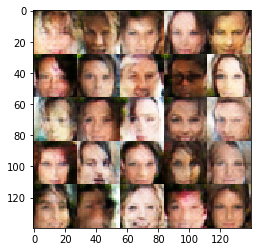

Epoch 1/1 Step 7710... Discriminator Loss: 1.2225... Generator Loss: 0.7531
Epoch 1/1 Step 7720... Discriminator Loss: 1.3896... Generator Loss: 0.7068
Epoch 1/1 Step 7730... Discriminator Loss: 1.1122... Generator Loss: 1.0145
Epoch 1/1 Step 7740... Discriminator Loss: 1.3135... Generator Loss: 0.7000
Epoch 1/1 Step 7750... Discriminator Loss: 1.1777... Generator Loss: 0.8501
Epoch 1/1 Step 7760... Discriminator Loss: 1.5580... Generator Loss: 0.5391
Epoch 1/1 Step 7770... Discriminator Loss: 1.4561... Generator Loss: 0.6182
Epoch 1/1 Step 7780... Discriminator Loss: 1.5285... Generator Loss: 0.5351
Epoch 1/1 Step 7790... Discriminator Loss: 1.2743... Generator Loss: 0.8124
Epoch 1/1 Step 7800... Discriminator Loss: 1.1763... Generator Loss: 0.7915


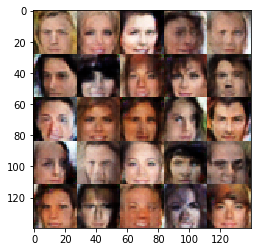

Epoch 1/1 Step 7810... Discriminator Loss: 1.6259... Generator Loss: 0.6305
Epoch 1/1 Step 7820... Discriminator Loss: 1.3806... Generator Loss: 0.8112
Epoch 1/1 Step 7830... Discriminator Loss: 1.2748... Generator Loss: 0.7119
Epoch 1/1 Step 7840... Discriminator Loss: 1.3654... Generator Loss: 0.7825
Epoch 1/1 Step 7850... Discriminator Loss: 1.4489... Generator Loss: 0.5488
Epoch 1/1 Step 7860... Discriminator Loss: 1.2495... Generator Loss: 0.7261
Epoch 1/1 Step 7870... Discriminator Loss: 1.4299... Generator Loss: 0.7069
Epoch 1/1 Step 7880... Discriminator Loss: 1.1934... Generator Loss: 0.8266
Epoch 1/1 Step 7890... Discriminator Loss: 1.3841... Generator Loss: 0.7660
Epoch 1/1 Step 7900... Discriminator Loss: 1.0930... Generator Loss: 1.0127


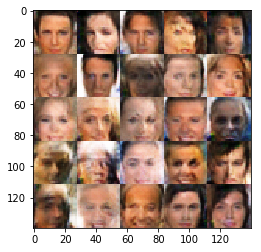

Epoch 1/1 Step 7910... Discriminator Loss: 1.2345... Generator Loss: 0.8178
Epoch 1/1 Step 7920... Discriminator Loss: 1.3143... Generator Loss: 0.7757
Epoch 1/1 Step 7930... Discriminator Loss: 1.3052... Generator Loss: 0.8270
Epoch 1/1 Step 7940... Discriminator Loss: 1.0441... Generator Loss: 1.0133
Epoch 1/1 Step 7950... Discriminator Loss: 1.1428... Generator Loss: 0.9626
Epoch 1/1 Step 7960... Discriminator Loss: 1.3066... Generator Loss: 0.7393
Epoch 1/1 Step 7970... Discriminator Loss: 1.2468... Generator Loss: 0.8507
Epoch 1/1 Step 7980... Discriminator Loss: 1.5119... Generator Loss: 0.7112
Epoch 1/1 Step 7990... Discriminator Loss: 1.1978... Generator Loss: 0.7414
Epoch 1/1 Step 8000... Discriminator Loss: 1.4483... Generator Loss: 0.7965


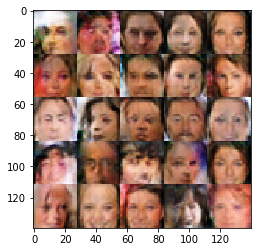

Epoch 1/1 Step 8010... Discriminator Loss: 1.3747... Generator Loss: 0.7465
Epoch 1/1 Step 8020... Discriminator Loss: 1.6695... Generator Loss: 0.5423
Epoch 1/1 Step 8030... Discriminator Loss: 1.4859... Generator Loss: 0.5456
Epoch 1/1 Step 8040... Discriminator Loss: 1.3378... Generator Loss: 0.7184
Epoch 1/1 Step 8050... Discriminator Loss: 1.3663... Generator Loss: 0.7177
Epoch 1/1 Step 8060... Discriminator Loss: 1.2150... Generator Loss: 0.7441
Epoch 1/1 Step 8070... Discriminator Loss: 1.3965... Generator Loss: 0.6477
Epoch 1/1 Step 8080... Discriminator Loss: 1.1466... Generator Loss: 0.9669
Epoch 1/1 Step 8090... Discriminator Loss: 1.2854... Generator Loss: 0.7450
Epoch 1/1 Step 8100... Discriminator Loss: 1.3268... Generator Loss: 0.9022


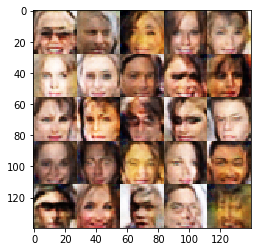

Epoch 1/1 Step 8110... Discriminator Loss: 1.5308... Generator Loss: 0.5692
Epoch 1/1 Step 8120... Discriminator Loss: 1.3758... Generator Loss: 0.6679
Epoch 1/1 Step 8130... Discriminator Loss: 0.9983... Generator Loss: 0.8442
Epoch 1/1 Step 8140... Discriminator Loss: 1.2624... Generator Loss: 0.8096
Epoch 1/1 Step 8150... Discriminator Loss: 0.9305... Generator Loss: 1.7502
Epoch 1/1 Step 8160... Discriminator Loss: 1.2049... Generator Loss: 0.7165
Epoch 1/1 Step 8170... Discriminator Loss: 1.1433... Generator Loss: 0.9531
Epoch 1/1 Step 8180... Discriminator Loss: 1.3999... Generator Loss: 0.8076
Epoch 1/1 Step 8190... Discriminator Loss: 1.1725... Generator Loss: 0.8219
Epoch 1/1 Step 8200... Discriminator Loss: 1.3723... Generator Loss: 0.5434


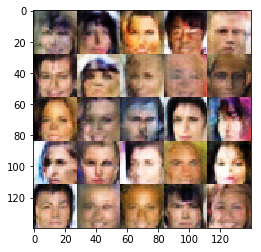

Epoch 1/1 Step 8210... Discriminator Loss: 1.3846... Generator Loss: 0.6996
Epoch 1/1 Step 8220... Discriminator Loss: 1.2366... Generator Loss: 0.6918
Epoch 1/1 Step 8230... Discriminator Loss: 1.2548... Generator Loss: 0.9218
Epoch 1/1 Step 8240... Discriminator Loss: 1.5467... Generator Loss: 0.5952
Epoch 1/1 Step 8250... Discriminator Loss: 1.2624... Generator Loss: 0.7406
Epoch 1/1 Step 8260... Discriminator Loss: 1.2371... Generator Loss: 0.9376
Epoch 1/1 Step 8270... Discriminator Loss: 1.4222... Generator Loss: 0.7286
Epoch 1/1 Step 8280... Discriminator Loss: 1.3552... Generator Loss: 0.7515
Epoch 1/1 Step 8290... Discriminator Loss: 1.4048... Generator Loss: 0.9152
Epoch 1/1 Step 8300... Discriminator Loss: 1.2354... Generator Loss: 0.7697


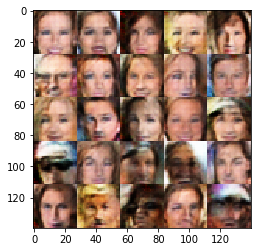

Epoch 1/1 Step 8310... Discriminator Loss: 1.2820... Generator Loss: 0.6922
Epoch 1/1 Step 8320... Discriminator Loss: 1.0848... Generator Loss: 0.9195
Epoch 1/1 Step 8330... Discriminator Loss: 1.4338... Generator Loss: 0.5692
Epoch 1/1 Step 8340... Discriminator Loss: 1.3065... Generator Loss: 0.7020
Epoch 1/1 Step 8350... Discriminator Loss: 1.4344... Generator Loss: 0.6797
Epoch 1/1 Step 8360... Discriminator Loss: 1.2906... Generator Loss: 0.8243
Epoch 1/1 Step 8370... Discriminator Loss: 1.2885... Generator Loss: 0.7516
Epoch 1/1 Step 8380... Discriminator Loss: 1.1930... Generator Loss: 0.8806
Epoch 1/1 Step 8390... Discriminator Loss: 1.3124... Generator Loss: 0.7015
Epoch 1/1 Step 8400... Discriminator Loss: 1.2544... Generator Loss: 0.7472


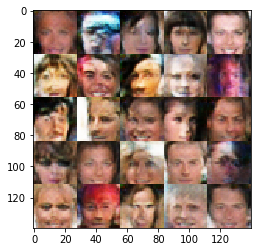

Epoch 1/1 Step 8410... Discriminator Loss: 1.4051... Generator Loss: 0.7429
Epoch 1/1 Step 8420... Discriminator Loss: 1.5894... Generator Loss: 0.6310
Epoch 1/1 Step 8430... Discriminator Loss: 1.2257... Generator Loss: 0.7524
Epoch 1/1 Step 8440... Discriminator Loss: 1.3434... Generator Loss: 0.7301
Epoch 1/1 Step 8450... Discriminator Loss: 1.2527... Generator Loss: 0.7421
Epoch 1/1 Step 8460... Discriminator Loss: 1.4983... Generator Loss: 0.5881
Epoch 1/1 Step 8470... Discriminator Loss: 1.3656... Generator Loss: 0.7473
Epoch 1/1 Step 8480... Discriminator Loss: 1.1752... Generator Loss: 0.8921
Epoch 1/1 Step 8490... Discriminator Loss: 1.3338... Generator Loss: 0.7209
Epoch 1/1 Step 8500... Discriminator Loss: 1.5094... Generator Loss: 0.5489


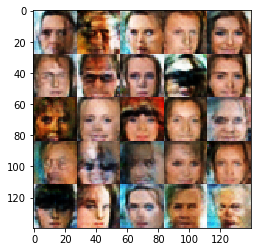

Epoch 1/1 Step 8510... Discriminator Loss: 1.4326... Generator Loss: 0.6131
Epoch 1/1 Step 8520... Discriminator Loss: 1.1973... Generator Loss: 0.8279
Epoch 1/1 Step 8530... Discriminator Loss: 1.4344... Generator Loss: 0.6903
Epoch 1/1 Step 8540... Discriminator Loss: 1.3965... Generator Loss: 0.6898
Epoch 1/1 Step 8550... Discriminator Loss: 1.2708... Generator Loss: 0.7380
Epoch 1/1 Step 8560... Discriminator Loss: 1.5389... Generator Loss: 0.5771
Epoch 1/1 Step 8570... Discriminator Loss: 1.4961... Generator Loss: 0.5791
Epoch 1/1 Step 8580... Discriminator Loss: 1.4595... Generator Loss: 0.7093
Epoch 1/1 Step 8590... Discriminator Loss: 1.2477... Generator Loss: 0.8799
Epoch 1/1 Step 8600... Discriminator Loss: 1.2705... Generator Loss: 0.8105


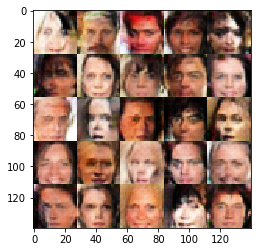

Epoch 1/1 Step 8610... Discriminator Loss: 1.2298... Generator Loss: 0.8225
Epoch 1/1 Step 8620... Discriminator Loss: 1.1860... Generator Loss: 0.7767
Epoch 1/1 Step 8630... Discriminator Loss: 1.4177... Generator Loss: 0.6543
Epoch 1/1 Step 8640... Discriminator Loss: 1.3105... Generator Loss: 0.7485
Epoch 1/1 Step 8650... Discriminator Loss: 1.6247... Generator Loss: 0.5599
Epoch 1/1 Step 8660... Discriminator Loss: 1.1762... Generator Loss: 0.9558
Epoch 1/1 Step 8670... Discriminator Loss: 1.1493... Generator Loss: 0.8552
Epoch 1/1 Step 8680... Discriminator Loss: 1.1626... Generator Loss: 0.8323
Epoch 1/1 Step 8690... Discriminator Loss: 1.3769... Generator Loss: 0.6425
Epoch 1/1 Step 8700... Discriminator Loss: 1.4094... Generator Loss: 0.6528


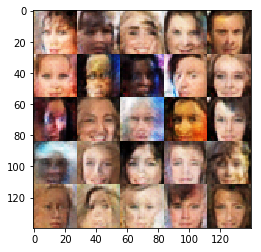

Epoch 1/1 Step 8710... Discriminator Loss: 1.2013... Generator Loss: 0.9425
Epoch 1/1 Step 8720... Discriminator Loss: 1.2683... Generator Loss: 0.9472
Epoch 1/1 Step 8730... Discriminator Loss: 1.0923... Generator Loss: 1.0389
Epoch 1/1 Step 8740... Discriminator Loss: 1.3184... Generator Loss: 0.6279
Epoch 1/1 Step 8750... Discriminator Loss: 1.3826... Generator Loss: 0.7155
Epoch 1/1 Step 8760... Discriminator Loss: 1.3490... Generator Loss: 0.7605
Epoch 1/1 Step 8770... Discriminator Loss: 1.4921... Generator Loss: 0.7613
Epoch 1/1 Step 8780... Discriminator Loss: 1.3435... Generator Loss: 0.7311
Epoch 1/1 Step 8790... Discriminator Loss: 1.2904... Generator Loss: 0.7883
Epoch 1/1 Step 8800... Discriminator Loss: 1.2665... Generator Loss: 0.8344


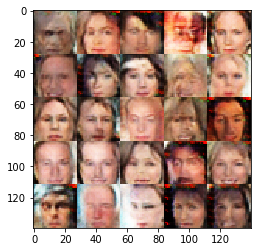

Epoch 1/1 Step 8810... Discriminator Loss: 1.1726... Generator Loss: 0.8385
Epoch 1/1 Step 8820... Discriminator Loss: 1.0868... Generator Loss: 0.9296
Epoch 1/1 Step 8830... Discriminator Loss: 1.3775... Generator Loss: 0.6590
Epoch 1/1 Step 8840... Discriminator Loss: 1.3330... Generator Loss: 0.6854
Epoch 1/1 Step 8850... Discriminator Loss: 1.3025... Generator Loss: 0.7035
Epoch 1/1 Step 8860... Discriminator Loss: 1.3079... Generator Loss: 0.7500
Epoch 1/1 Step 8870... Discriminator Loss: 1.2361... Generator Loss: 0.7968
Epoch 1/1 Step 8880... Discriminator Loss: 1.3598... Generator Loss: 0.8476
Epoch 1/1 Step 8890... Discriminator Loss: 1.3782... Generator Loss: 0.7283
Epoch 1/1 Step 8900... Discriminator Loss: 1.1879... Generator Loss: 0.7927


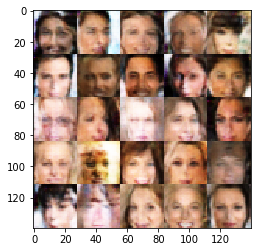

Epoch 1/1 Step 8910... Discriminator Loss: 1.3163... Generator Loss: 0.6561
Epoch 1/1 Step 8920... Discriminator Loss: 1.5614... Generator Loss: 0.6094
Epoch 1/1 Step 8930... Discriminator Loss: 1.3432... Generator Loss: 0.6994
Epoch 1/1 Step 8940... Discriminator Loss: 1.5108... Generator Loss: 0.5596
Epoch 1/1 Step 8950... Discriminator Loss: 1.2889... Generator Loss: 0.8312
Epoch 1/1 Step 8960... Discriminator Loss: 1.2884... Generator Loss: 0.7662
Epoch 1/1 Step 8970... Discriminator Loss: 1.4657... Generator Loss: 0.7264
Epoch 1/1 Step 8980... Discriminator Loss: 1.2712... Generator Loss: 0.7004
Epoch 1/1 Step 8990... Discriminator Loss: 1.1467... Generator Loss: 0.9013
Epoch 1/1 Step 9000... Discriminator Loss: 1.3788... Generator Loss: 0.6808


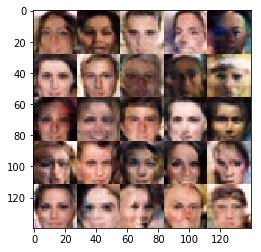

Epoch 1/1 Step 9010... Discriminator Loss: 1.4870... Generator Loss: 0.6939
Epoch 1/1 Step 9020... Discriminator Loss: 1.3147... Generator Loss: 0.7354
Epoch 1/1 Step 9030... Discriminator Loss: 1.4066... Generator Loss: 0.6704
Epoch 1/1 Step 9040... Discriminator Loss: 1.3954... Generator Loss: 0.7320
Epoch 1/1 Step 9050... Discriminator Loss: 1.3683... Generator Loss: 0.6822
Epoch 1/1 Step 9060... Discriminator Loss: 1.3525... Generator Loss: 0.7337
Epoch 1/1 Step 9070... Discriminator Loss: 1.4134... Generator Loss: 0.6945
Epoch 1/1 Step 9080... Discriminator Loss: 1.3435... Generator Loss: 0.6565
Epoch 1/1 Step 9090... Discriminator Loss: 1.3728... Generator Loss: 0.7314
Epoch 1/1 Step 9100... Discriminator Loss: 1.2705... Generator Loss: 0.8285


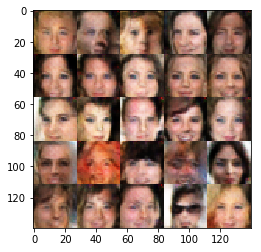

Epoch 1/1 Step 9110... Discriminator Loss: 1.4244... Generator Loss: 0.7252
Epoch 1/1 Step 9120... Discriminator Loss: 1.2814... Generator Loss: 0.8248
Epoch 1/1 Step 9130... Discriminator Loss: 1.2398... Generator Loss: 0.7944
Epoch 1/1 Step 9140... Discriminator Loss: 1.5607... Generator Loss: 0.6284
Epoch 1/1 Step 9150... Discriminator Loss: 1.3643... Generator Loss: 0.6403
Epoch 1/1 Step 9160... Discriminator Loss: 1.1994... Generator Loss: 1.0168
Epoch 1/1 Step 9170... Discriminator Loss: 1.3077... Generator Loss: 0.8223
Epoch 1/1 Step 9180... Discriminator Loss: 1.3936... Generator Loss: 0.7489
Epoch 1/1 Step 9190... Discriminator Loss: 1.2303... Generator Loss: 0.8521
Epoch 1/1 Step 9200... Discriminator Loss: 1.3561... Generator Loss: 0.7857


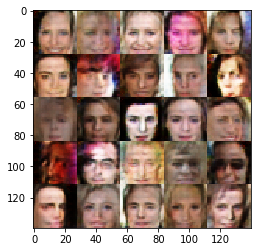

Epoch 1/1 Step 9210... Discriminator Loss: 1.3348... Generator Loss: 0.7520
Epoch 1/1 Step 9220... Discriminator Loss: 1.2289... Generator Loss: 0.8056
Epoch 1/1 Step 9230... Discriminator Loss: 1.4104... Generator Loss: 0.7644
Epoch 1/1 Step 9240... Discriminator Loss: 1.3119... Generator Loss: 0.7974
Epoch 1/1 Step 9250... Discriminator Loss: 1.2565... Generator Loss: 0.8421
Epoch 1/1 Step 9260... Discriminator Loss: 1.2888... Generator Loss: 0.6988
Epoch 1/1 Step 9270... Discriminator Loss: 1.2592... Generator Loss: 0.8439
Epoch 1/1 Step 9280... Discriminator Loss: 1.1927... Generator Loss: 0.8052
Epoch 1/1 Step 9290... Discriminator Loss: 1.2603... Generator Loss: 0.8434
Epoch 1/1 Step 9300... Discriminator Loss: 1.2913... Generator Loss: 0.8800


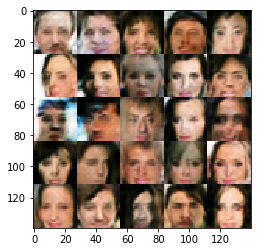

Epoch 1/1 Step 9310... Discriminator Loss: 1.4502... Generator Loss: 0.6224
Epoch 1/1 Step 9320... Discriminator Loss: 1.2439... Generator Loss: 0.7954
Epoch 1/1 Step 9330... Discriminator Loss: 1.3377... Generator Loss: 0.7540
Epoch 1/1 Step 9340... Discriminator Loss: 1.2636... Generator Loss: 0.7442
Epoch 1/1 Step 9350... Discriminator Loss: 1.3738... Generator Loss: 0.6228
Epoch 1/1 Step 9360... Discriminator Loss: 1.4353... Generator Loss: 0.5991
Epoch 1/1 Step 9370... Discriminator Loss: 1.3786... Generator Loss: 0.7041
Epoch 1/1 Step 9380... Discriminator Loss: 1.3156... Generator Loss: 0.6394
Epoch 1/1 Step 9390... Discriminator Loss: 1.0250... Generator Loss: 0.9188
Epoch 1/1 Step 9400... Discriminator Loss: 1.3455... Generator Loss: 0.6806


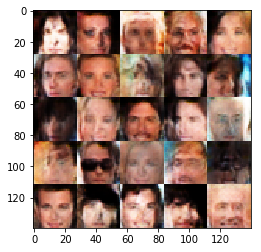

Epoch 1/1 Step 9410... Discriminator Loss: 1.2751... Generator Loss: 0.7871
Epoch 1/1 Step 9420... Discriminator Loss: 1.1440... Generator Loss: 0.8728
Epoch 1/1 Step 9430... Discriminator Loss: 1.3733... Generator Loss: 0.6619
Epoch 1/1 Step 9440... Discriminator Loss: 1.3669... Generator Loss: 0.7007
Epoch 1/1 Step 9450... Discriminator Loss: 1.3634... Generator Loss: 0.6865
Epoch 1/1 Step 9460... Discriminator Loss: 1.1053... Generator Loss: 0.9819
Epoch 1/1 Step 9470... Discriminator Loss: 1.3336... Generator Loss: 0.8802
Epoch 1/1 Step 9480... Discriminator Loss: 1.3748... Generator Loss: 0.7330
Epoch 1/1 Step 9490... Discriminator Loss: 1.3726... Generator Loss: 0.7772
Epoch 1/1 Step 9500... Discriminator Loss: 1.1684... Generator Loss: 0.7872


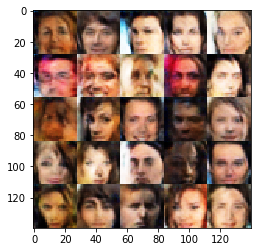

Epoch 1/1 Step 9510... Discriminator Loss: 1.3991... Generator Loss: 0.7066
Epoch 1/1 Step 9520... Discriminator Loss: 1.3993... Generator Loss: 0.7979
Epoch 1/1 Step 9530... Discriminator Loss: 1.2275... Generator Loss: 0.7429
Epoch 1/1 Step 9540... Discriminator Loss: 1.4782... Generator Loss: 0.7288
Epoch 1/1 Step 9550... Discriminator Loss: 1.3449... Generator Loss: 0.7379
Epoch 1/1 Step 9560... Discriminator Loss: 1.3392... Generator Loss: 0.7689
Epoch 1/1 Step 9570... Discriminator Loss: 1.1329... Generator Loss: 0.9136
Epoch 1/1 Step 9580... Discriminator Loss: 1.3807... Generator Loss: 0.6609
Epoch 1/1 Step 9590... Discriminator Loss: 1.2227... Generator Loss: 0.7447
Epoch 1/1 Step 9600... Discriminator Loss: 1.3203... Generator Loss: 0.7044


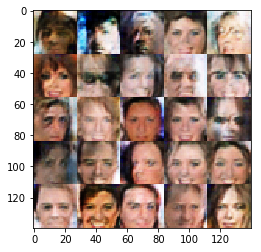

Epoch 1/1 Step 9610... Discriminator Loss: 1.4456... Generator Loss: 0.6409
Epoch 1/1 Step 9620... Discriminator Loss: 1.3454... Generator Loss: 0.7860
Epoch 1/1 Step 9630... Discriminator Loss: 1.4214... Generator Loss: 0.6581
Epoch 1/1 Step 9640... Discriminator Loss: 1.4304... Generator Loss: 0.6667
Epoch 1/1 Step 9650... Discriminator Loss: 1.4894... Generator Loss: 0.5907
Epoch 1/1 Step 9660... Discriminator Loss: 1.2663... Generator Loss: 0.7700
Epoch 1/1 Step 9670... Discriminator Loss: 1.4278... Generator Loss: 0.6983
Epoch 1/1 Step 9680... Discriminator Loss: 1.3474... Generator Loss: 0.7037
Epoch 1/1 Step 9690... Discriminator Loss: 1.2507... Generator Loss: 0.8393
Epoch 1/1 Step 9700... Discriminator Loss: 1.4801... Generator Loss: 0.6430


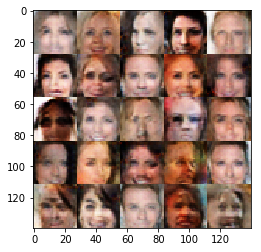

Epoch 1/1 Step 9710... Discriminator Loss: 1.4743... Generator Loss: 0.7437
Epoch 1/1 Step 9720... Discriminator Loss: 1.1427... Generator Loss: 0.7442
Epoch 1/1 Step 9730... Discriminator Loss: 1.2114... Generator Loss: 0.8710
Epoch 1/1 Step 9740... Discriminator Loss: 1.1478... Generator Loss: 0.8538
Epoch 1/1 Step 9750... Discriminator Loss: 1.2032... Generator Loss: 0.8181
Epoch 1/1 Step 9760... Discriminator Loss: 1.3530... Generator Loss: 0.8301
Epoch 1/1 Step 9770... Discriminator Loss: 1.3592... Generator Loss: 0.6643
Epoch 1/1 Step 9780... Discriminator Loss: 1.3211... Generator Loss: 0.8093
Epoch 1/1 Step 9790... Discriminator Loss: 1.4874... Generator Loss: 0.6528
Epoch 1/1 Step 9800... Discriminator Loss: 1.2651... Generator Loss: 0.7891


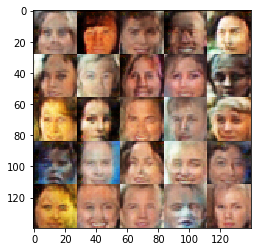

Epoch 1/1 Step 9810... Discriminator Loss: 1.2640... Generator Loss: 0.7551
Epoch 1/1 Step 9820... Discriminator Loss: 1.3621... Generator Loss: 0.8590
Epoch 1/1 Step 9830... Discriminator Loss: 1.2737... Generator Loss: 0.6576
Epoch 1/1 Step 9840... Discriminator Loss: 1.2663... Generator Loss: 0.7532
Epoch 1/1 Step 9850... Discriminator Loss: 1.2111... Generator Loss: 0.8109
Epoch 1/1 Step 9860... Discriminator Loss: 1.3510... Generator Loss: 0.6571
Epoch 1/1 Step 9870... Discriminator Loss: 1.3687... Generator Loss: 0.6967
Epoch 1/1 Step 9880... Discriminator Loss: 1.4412... Generator Loss: 0.6287
Epoch 1/1 Step 9890... Discriminator Loss: 1.2648... Generator Loss: 0.8323
Epoch 1/1 Step 9900... Discriminator Loss: 1.2531... Generator Loss: 0.8001


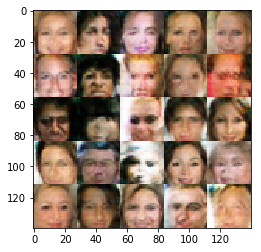

Epoch 1/1 Step 9910... Discriminator Loss: 1.3942... Generator Loss: 0.7088
Epoch 1/1 Step 9920... Discriminator Loss: 1.2536... Generator Loss: 0.7903
Epoch 1/1 Step 9930... Discriminator Loss: 1.2897... Generator Loss: 0.7367
Epoch 1/1 Step 9940... Discriminator Loss: 1.4480... Generator Loss: 0.6502
Epoch 1/1 Step 9950... Discriminator Loss: 1.6204... Generator Loss: 0.5588
Epoch 1/1 Step 9960... Discriminator Loss: 1.3030... Generator Loss: 0.8140
Epoch 1/1 Step 9970... Discriminator Loss: 1.3024... Generator Loss: 0.9048
Epoch 1/1 Step 9980... Discriminator Loss: 1.3947... Generator Loss: 0.7591
Epoch 1/1 Step 9990... Discriminator Loss: 1.2468... Generator Loss: 0.8097
Epoch 1/1 Step 10000... Discriminator Loss: 1.2649... Generator Loss: 0.6566


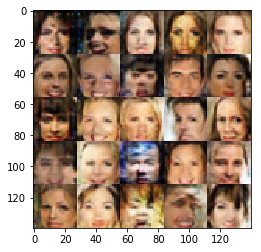

Epoch 1/1 Step 10010... Discriminator Loss: 1.5092... Generator Loss: 0.6526
Epoch 1/1 Step 10020... Discriminator Loss: 1.3859... Generator Loss: 0.8208
Epoch 1/1 Step 10030... Discriminator Loss: 1.5551... Generator Loss: 0.6143
Epoch 1/1 Step 10040... Discriminator Loss: 1.4570... Generator Loss: 0.7136
Epoch 1/1 Step 10050... Discriminator Loss: 1.3412... Generator Loss: 0.7267
Epoch 1/1 Step 10060... Discriminator Loss: 1.2403... Generator Loss: 0.7388
Epoch 1/1 Step 10070... Discriminator Loss: 1.3033... Generator Loss: 0.8069
Epoch 1/1 Step 10080... Discriminator Loss: 1.3134... Generator Loss: 0.7014
Epoch 1/1 Step 10090... Discriminator Loss: 1.4414... Generator Loss: 0.7517
Epoch 1/1 Step 10100... Discriminator Loss: 1.5223... Generator Loss: 0.6161


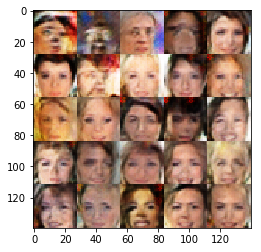

Epoch 1/1 Step 10110... Discriminator Loss: 1.2960... Generator Loss: 0.8256
Epoch 1/1 Step 10120... Discriminator Loss: 1.1602... Generator Loss: 0.9100
Epoch 1/1 Step 10130... Discriminator Loss: 1.3137... Generator Loss: 0.7902
Epoch 1/1 Step 10140... Discriminator Loss: 1.3455... Generator Loss: 0.6988
Epoch 1/1 Step 10150... Discriminator Loss: 1.3177... Generator Loss: 0.6955
Epoch 1/1 Step 10160... Discriminator Loss: 1.2727... Generator Loss: 0.8297
Epoch 1/1 Step 10170... Discriminator Loss: 1.2676... Generator Loss: 0.8138
Epoch 1/1 Step 10180... Discriminator Loss: 1.4582... Generator Loss: 0.7419
Epoch 1/1 Step 10190... Discriminator Loss: 1.3184... Generator Loss: 0.8458
Epoch 1/1 Step 10200... Discriminator Loss: 1.3440... Generator Loss: 0.6773


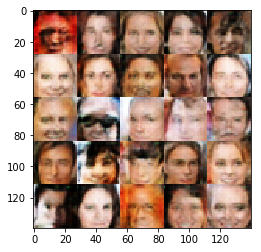

Epoch 1/1 Step 10210... Discriminator Loss: 1.2227... Generator Loss: 0.8024
Epoch 1/1 Step 10220... Discriminator Loss: 1.3819... Generator Loss: 0.7011
Epoch 1/1 Step 10230... Discriminator Loss: 1.3541... Generator Loss: 0.8420
Epoch 1/1 Step 10240... Discriminator Loss: 1.4263... Generator Loss: 0.7461
Epoch 1/1 Step 10250... Discriminator Loss: 1.3791... Generator Loss: 0.7258
Epoch 1/1 Step 10260... Discriminator Loss: 1.1928... Generator Loss: 0.7306
Epoch 1/1 Step 10270... Discriminator Loss: 1.1961... Generator Loss: 0.8019
Epoch 1/1 Step 10280... Discriminator Loss: 1.1804... Generator Loss: 0.8297
Epoch 1/1 Step 10290... Discriminator Loss: 1.3230... Generator Loss: 0.7497
Epoch 1/1 Step 10300... Discriminator Loss: 1.2668... Generator Loss: 0.7641


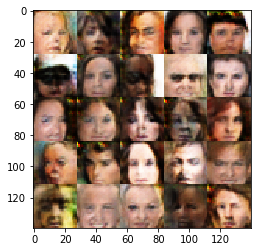

Epoch 1/1 Step 10310... Discriminator Loss: 1.5244... Generator Loss: 0.5483
Epoch 1/1 Step 10320... Discriminator Loss: 1.2890... Generator Loss: 0.8028
Epoch 1/1 Step 10330... Discriminator Loss: 1.3954... Generator Loss: 0.6737
Epoch 1/1 Step 10340... Discriminator Loss: 1.1034... Generator Loss: 0.7613
Epoch 1/1 Step 10350... Discriminator Loss: 1.2630... Generator Loss: 0.8568
Epoch 1/1 Step 10360... Discriminator Loss: 1.2772... Generator Loss: 0.7871
Epoch 1/1 Step 10370... Discriminator Loss: 1.2353... Generator Loss: 0.8116
Epoch 1/1 Step 10380... Discriminator Loss: 1.2171... Generator Loss: 0.9132
Epoch 1/1 Step 10390... Discriminator Loss: 1.3368... Generator Loss: 0.7952
Epoch 1/1 Step 10400... Discriminator Loss: 0.9585... Generator Loss: 1.0588


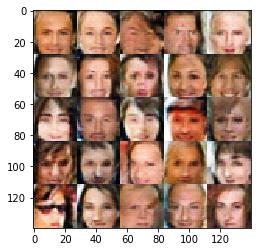

Epoch 1/1 Step 10410... Discriminator Loss: 1.3739... Generator Loss: 0.7215
Epoch 1/1 Step 10420... Discriminator Loss: 1.2823... Generator Loss: 0.7666
Epoch 1/1 Step 10430... Discriminator Loss: 1.3884... Generator Loss: 0.8351
Epoch 1/1 Step 10440... Discriminator Loss: 1.3860... Generator Loss: 0.7101
Epoch 1/1 Step 10450... Discriminator Loss: 1.5306... Generator Loss: 0.5689
Epoch 1/1 Step 10460... Discriminator Loss: 1.1914... Generator Loss: 0.8193
Epoch 1/1 Step 10470... Discriminator Loss: 1.1594... Generator Loss: 0.9838
Epoch 1/1 Step 10480... Discriminator Loss: 1.3111... Generator Loss: 0.6995
Epoch 1/1 Step 10490... Discriminator Loss: 1.2917... Generator Loss: 0.8113
Epoch 1/1 Step 10500... Discriminator Loss: 1.2697... Generator Loss: 0.7833


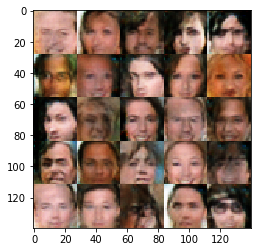

Epoch 1/1 Step 10510... Discriminator Loss: 1.4316... Generator Loss: 0.7373
Epoch 1/1 Step 10520... Discriminator Loss: 1.5515... Generator Loss: 0.6774
Epoch 1/1 Step 10530... Discriminator Loss: 1.2350... Generator Loss: 0.7357
Epoch 1/1 Step 10540... Discriminator Loss: 1.6099... Generator Loss: 0.4887
Epoch 1/1 Step 10550... Discriminator Loss: 1.3146... Generator Loss: 0.8025
Epoch 1/1 Step 10560... Discriminator Loss: 1.4889... Generator Loss: 0.5925
Epoch 1/1 Step 10570... Discriminator Loss: 1.1712... Generator Loss: 0.8953
Epoch 1/1 Step 10580... Discriminator Loss: 1.2212... Generator Loss: 0.7866
Epoch 1/1 Step 10590... Discriminator Loss: 1.2443... Generator Loss: 0.8180
Epoch 1/1 Step 10600... Discriminator Loss: 1.2894... Generator Loss: 0.8294


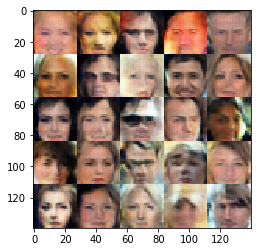

Epoch 1/1 Step 10610... Discriminator Loss: 1.1891... Generator Loss: 0.9380
Epoch 1/1 Step 10620... Discriminator Loss: 1.4503... Generator Loss: 0.7383
Epoch 1/1 Step 10630... Discriminator Loss: 1.3578... Generator Loss: 0.7313
Epoch 1/1 Step 10640... Discriminator Loss: 1.4482... Generator Loss: 0.6481
Epoch 1/1 Step 10650... Discriminator Loss: 1.3116... Generator Loss: 0.7166
Epoch 1/1 Step 10660... Discriminator Loss: 1.3807... Generator Loss: 0.7732
Epoch 1/1 Step 10670... Discriminator Loss: 1.5046... Generator Loss: 0.5775
Epoch 1/1 Step 10680... Discriminator Loss: 1.3278... Generator Loss: 0.7397
Epoch 1/1 Step 10690... Discriminator Loss: 1.3480... Generator Loss: 0.6934
Epoch 1/1 Step 10700... Discriminator Loss: 1.3850... Generator Loss: 0.7502


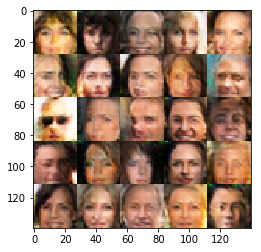

Epoch 1/1 Step 10710... Discriminator Loss: 1.3530... Generator Loss: 0.7361
Epoch 1/1 Step 10720... Discriminator Loss: 1.4958... Generator Loss: 0.6225
Epoch 1/1 Step 10730... Discriminator Loss: 1.2261... Generator Loss: 0.7847
Epoch 1/1 Step 10740... Discriminator Loss: 1.2601... Generator Loss: 0.7017
Epoch 1/1 Step 10750... Discriminator Loss: 1.2675... Generator Loss: 0.8861
Epoch 1/1 Step 10760... Discriminator Loss: 1.4664... Generator Loss: 0.6202
Epoch 1/1 Step 10770... Discriminator Loss: 1.3159... Generator Loss: 0.7280
Epoch 1/1 Step 10780... Discriminator Loss: 1.4494... Generator Loss: 0.6082
Epoch 1/1 Step 10790... Discriminator Loss: 1.4138... Generator Loss: 0.7187
Epoch 1/1 Step 10800... Discriminator Loss: 1.2264... Generator Loss: 0.7973


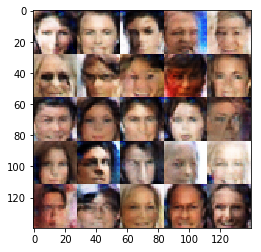

Epoch 1/1 Step 10810... Discriminator Loss: 1.3300... Generator Loss: 0.7458
Epoch 1/1 Step 10820... Discriminator Loss: 1.3662... Generator Loss: 0.7567
Epoch 1/1 Step 10830... Discriminator Loss: 1.3119... Generator Loss: 0.8261
Epoch 1/1 Step 10840... Discriminator Loss: 1.5662... Generator Loss: 0.6967
Epoch 1/1 Step 10850... Discriminator Loss: 1.4957... Generator Loss: 0.5974
Epoch 1/1 Step 10860... Discriminator Loss: 1.1593... Generator Loss: 0.8410
Epoch 1/1 Step 10870... Discriminator Loss: 1.5949... Generator Loss: 0.6020
Epoch 1/1 Step 10880... Discriminator Loss: 1.4470... Generator Loss: 0.7194
Epoch 1/1 Step 10890... Discriminator Loss: 1.3423... Generator Loss: 0.7214
Epoch 1/1 Step 10900... Discriminator Loss: 1.4204... Generator Loss: 0.7246


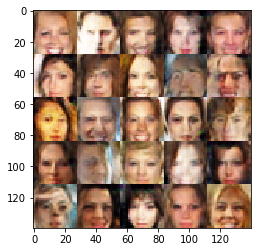

Epoch 1/1 Step 10910... Discriminator Loss: 1.4253... Generator Loss: 0.6974
Epoch 1/1 Step 10920... Discriminator Loss: 1.3155... Generator Loss: 0.8018
Epoch 1/1 Step 10930... Discriminator Loss: 1.5682... Generator Loss: 0.5650
Epoch 1/1 Step 10940... Discriminator Loss: 1.3590... Generator Loss: 0.6284
Epoch 1/1 Step 10950... Discriminator Loss: 1.4533... Generator Loss: 0.7193
Epoch 1/1 Step 10960... Discriminator Loss: 1.2859... Generator Loss: 0.7785
Epoch 1/1 Step 10970... Discriminator Loss: 1.4276... Generator Loss: 0.7008
Epoch 1/1 Step 10980... Discriminator Loss: 1.3153... Generator Loss: 0.7735
Epoch 1/1 Step 10990... Discriminator Loss: 1.4241... Generator Loss: 0.7566
Epoch 1/1 Step 11000... Discriminator Loss: 1.2247... Generator Loss: 0.8066


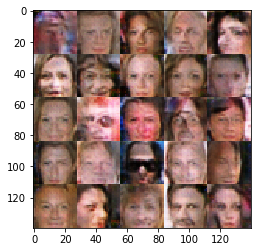

Epoch 1/1 Step 11010... Discriminator Loss: 1.4013... Generator Loss: 0.7095
Epoch 1/1 Step 11020... Discriminator Loss: 1.4490... Generator Loss: 0.7175
Epoch 1/1 Step 11030... Discriminator Loss: 1.3341... Generator Loss: 0.7272
Epoch 1/1 Step 11040... Discriminator Loss: 1.4031... Generator Loss: 0.7578
Epoch 1/1 Step 11050... Discriminator Loss: 1.3265... Generator Loss: 0.8076
Epoch 1/1 Step 11060... Discriminator Loss: 1.3703... Generator Loss: 0.8342
Epoch 1/1 Step 11070... Discriminator Loss: 1.3137... Generator Loss: 0.7500
Epoch 1/1 Step 11080... Discriminator Loss: 1.2064... Generator Loss: 0.8112
Epoch 1/1 Step 11090... Discriminator Loss: 1.3079... Generator Loss: 0.7234
Epoch 1/1 Step 11100... Discriminator Loss: 1.3763... Generator Loss: 0.6372


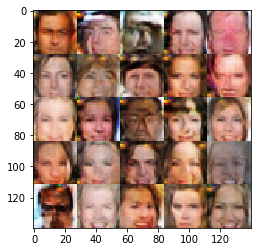

Epoch 1/1 Step 11110... Discriminator Loss: 1.4967... Generator Loss: 0.6590
Epoch 1/1 Step 11120... Discriminator Loss: 1.2761... Generator Loss: 0.7688
Epoch 1/1 Step 11130... Discriminator Loss: 1.3617... Generator Loss: 0.8102
Epoch 1/1 Step 11140... Discriminator Loss: 1.3753... Generator Loss: 0.8260
Epoch 1/1 Step 11150... Discriminator Loss: 1.4752... Generator Loss: 0.7314
Epoch 1/1 Step 11160... Discriminator Loss: 1.3037... Generator Loss: 0.7521
Epoch 1/1 Step 11170... Discriminator Loss: 1.3285... Generator Loss: 0.7548
Epoch 1/1 Step 11180... Discriminator Loss: 1.4004... Generator Loss: 0.6559
Epoch 1/1 Step 11190... Discriminator Loss: 1.5485... Generator Loss: 0.6039
Epoch 1/1 Step 11200... Discriminator Loss: 1.4224... Generator Loss: 0.7443


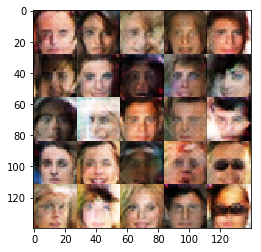

Epoch 1/1 Step 11210... Discriminator Loss: 1.4382... Generator Loss: 0.7012
Epoch 1/1 Step 11220... Discriminator Loss: 1.3246... Generator Loss: 0.7926
Epoch 1/1 Step 11230... Discriminator Loss: 1.3259... Generator Loss: 0.7850
Epoch 1/1 Step 11240... Discriminator Loss: 1.4591... Generator Loss: 0.6289
Epoch 1/1 Step 11250... Discriminator Loss: 1.4580... Generator Loss: 0.6780
Epoch 1/1 Step 11260... Discriminator Loss: 1.2337... Generator Loss: 0.8872
Epoch 1/1 Step 11270... Discriminator Loss: 1.4289... Generator Loss: 0.7254
Epoch 1/1 Step 11280... Discriminator Loss: 1.3092... Generator Loss: 0.8145
Epoch 1/1 Step 11290... Discriminator Loss: 1.5313... Generator Loss: 0.7375
Epoch 1/1 Step 11300... Discriminator Loss: 1.4396... Generator Loss: 0.7125


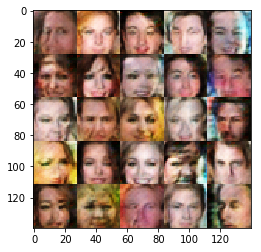

Epoch 1/1 Step 11310... Discriminator Loss: 1.2368... Generator Loss: 0.8445
Epoch 1/1 Step 11320... Discriminator Loss: 1.2303... Generator Loss: 0.8764
Epoch 1/1 Step 11330... Discriminator Loss: 1.2480... Generator Loss: 0.8428
Epoch 1/1 Step 11340... Discriminator Loss: 1.4538... Generator Loss: 0.7260
Epoch 1/1 Step 11350... Discriminator Loss: 1.4560... Generator Loss: 0.6997
Epoch 1/1 Step 11360... Discriminator Loss: 1.4102... Generator Loss: 0.7902
Epoch 1/1 Step 11370... Discriminator Loss: 1.6081... Generator Loss: 0.5939
Epoch 1/1 Step 11380... Discriminator Loss: 1.0520... Generator Loss: 1.0853
Epoch 1/1 Step 11390... Discriminator Loss: 1.4802... Generator Loss: 0.6610
Epoch 1/1 Step 11400... Discriminator Loss: 1.2766... Generator Loss: 0.8033


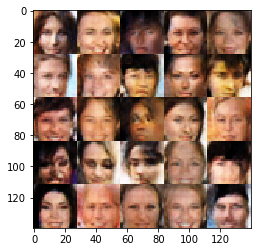

Epoch 1/1 Step 11410... Discriminator Loss: 1.2973... Generator Loss: 0.7174
Epoch 1/1 Step 11420... Discriminator Loss: 1.5546... Generator Loss: 0.6382
Epoch 1/1 Step 11430... Discriminator Loss: 1.1313... Generator Loss: 1.0173
Epoch 1/1 Step 11440... Discriminator Loss: 1.4121... Generator Loss: 0.7077
Epoch 1/1 Step 11450... Discriminator Loss: 1.2715... Generator Loss: 0.9897
Epoch 1/1 Step 11460... Discriminator Loss: 1.3475... Generator Loss: 0.7955
Epoch 1/1 Step 11470... Discriminator Loss: 1.4240... Generator Loss: 0.6872
Epoch 1/1 Step 11480... Discriminator Loss: 1.2618... Generator Loss: 0.7631
Epoch 1/1 Step 11490... Discriminator Loss: 1.4175... Generator Loss: 0.6422
Epoch 1/1 Step 11500... Discriminator Loss: 1.3786... Generator Loss: 0.7535


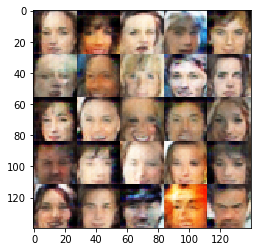

Epoch 1/1 Step 11510... Discriminator Loss: 1.4553... Generator Loss: 0.7049
Epoch 1/1 Step 11520... Discriminator Loss: 1.6341... Generator Loss: 0.5435
Epoch 1/1 Step 11530... Discriminator Loss: 1.3401... Generator Loss: 0.7218
Epoch 1/1 Step 11540... Discriminator Loss: 1.3528... Generator Loss: 0.7293
Epoch 1/1 Step 11550... Discriminator Loss: 1.5051... Generator Loss: 0.6029
Epoch 1/1 Step 11560... Discriminator Loss: 1.4271... Generator Loss: 0.7778
Epoch 1/1 Step 11570... Discriminator Loss: 1.3209... Generator Loss: 0.7196
Epoch 1/1 Step 11580... Discriminator Loss: 1.3946... Generator Loss: 0.6936
Epoch 1/1 Step 11590... Discriminator Loss: 1.4402... Generator Loss: 0.6965
Epoch 1/1 Step 11600... Discriminator Loss: 1.4197... Generator Loss: 0.6482


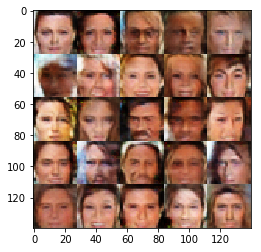

Epoch 1/1 Step 11610... Discriminator Loss: 1.3448... Generator Loss: 0.9320
Epoch 1/1 Step 11620... Discriminator Loss: 1.0735... Generator Loss: 1.0336
Epoch 1/1 Step 11630... Discriminator Loss: 1.3818... Generator Loss: 0.7115
Epoch 1/1 Step 11640... Discriminator Loss: 1.3882... Generator Loss: 0.7426
Epoch 1/1 Step 11650... Discriminator Loss: 1.3533... Generator Loss: 0.7215
Epoch 1/1 Step 11660... Discriminator Loss: 1.2492... Generator Loss: 0.8076
Epoch 1/1 Step 11670... Discriminator Loss: 1.5087... Generator Loss: 0.7105
Epoch 1/1 Step 11680... Discriminator Loss: 1.1884... Generator Loss: 0.9908
Epoch 1/1 Step 11690... Discriminator Loss: 1.3501... Generator Loss: 0.7534
Epoch 1/1 Step 11700... Discriminator Loss: 1.3344... Generator Loss: 0.6869


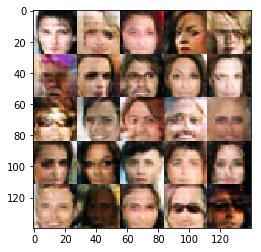

Epoch 1/1 Step 11710... Discriminator Loss: 1.2904... Generator Loss: 0.7339
Epoch 1/1 Step 11720... Discriminator Loss: 1.4135... Generator Loss: 0.8187
Epoch 1/1 Step 11730... Discriminator Loss: 1.3358... Generator Loss: 0.7350
Epoch 1/1 Step 11740... Discriminator Loss: 1.3381... Generator Loss: 0.8062
Epoch 1/1 Step 11750... Discriminator Loss: 1.3346... Generator Loss: 0.8295
Epoch 1/1 Step 11760... Discriminator Loss: 1.2882... Generator Loss: 0.8068
Epoch 1/1 Step 11770... Discriminator Loss: 1.3372... Generator Loss: 0.7681
Epoch 1/1 Step 11780... Discriminator Loss: 1.4254... Generator Loss: 0.7131
Epoch 1/1 Step 11790... Discriminator Loss: 1.3405... Generator Loss: 0.9077
Epoch 1/1 Step 11800... Discriminator Loss: 1.5228... Generator Loss: 0.6913


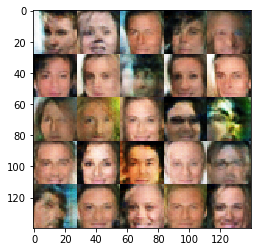

Epoch 1/1 Step 11810... Discriminator Loss: 1.3631... Generator Loss: 0.7735
Epoch 1/1 Step 11820... Discriminator Loss: 1.3631... Generator Loss: 0.6951
Epoch 1/1 Step 11830... Discriminator Loss: 1.2480... Generator Loss: 0.8208
Epoch 1/1 Step 11840... Discriminator Loss: 1.3976... Generator Loss: 0.7155
Epoch 1/1 Step 11850... Discriminator Loss: 1.3928... Generator Loss: 0.7462
Epoch 1/1 Step 11860... Discriminator Loss: 1.2583... Generator Loss: 0.7924
Epoch 1/1 Step 11870... Discriminator Loss: 1.3249... Generator Loss: 0.7950
Epoch 1/1 Step 11880... Discriminator Loss: 1.3963... Generator Loss: 0.7313
Epoch 1/1 Step 11890... Discriminator Loss: 1.3615... Generator Loss: 0.8105
Epoch 1/1 Step 11900... Discriminator Loss: 1.2847... Generator Loss: 0.8712


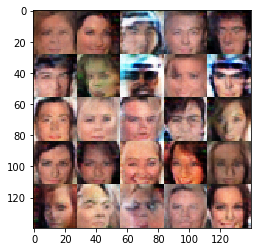

Epoch 1/1 Step 11910... Discriminator Loss: 1.3047... Generator Loss: 0.6941
Epoch 1/1 Step 11920... Discriminator Loss: 1.2441... Generator Loss: 0.8230
Epoch 1/1 Step 11930... Discriminator Loss: 1.3310... Generator Loss: 0.7807
Epoch 1/1 Step 11940... Discriminator Loss: 1.3962... Generator Loss: 0.6935
Epoch 1/1 Step 11950... Discriminator Loss: 1.5406... Generator Loss: 0.6134
Epoch 1/1 Step 11960... Discriminator Loss: 1.3325... Generator Loss: 0.8834
Epoch 1/1 Step 11970... Discriminator Loss: 1.3975... Generator Loss: 0.6152
Epoch 1/1 Step 11980... Discriminator Loss: 1.2839... Generator Loss: 0.7653
Epoch 1/1 Step 11990... Discriminator Loss: 1.3180... Generator Loss: 0.8218
Epoch 1/1 Step 12000... Discriminator Loss: 1.3125... Generator Loss: 0.8517


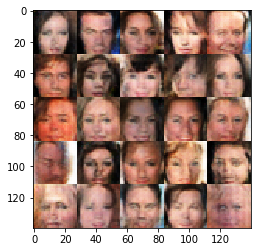

Epoch 1/1 Step 12010... Discriminator Loss: 1.4036... Generator Loss: 0.7334
Epoch 1/1 Step 12020... Discriminator Loss: 1.3230... Generator Loss: 0.7501
Epoch 1/1 Step 12030... Discriminator Loss: 1.3335... Generator Loss: 0.7611
Epoch 1/1 Step 12040... Discriminator Loss: 1.3844... Generator Loss: 0.6756
Epoch 1/1 Step 12050... Discriminator Loss: 1.2220... Generator Loss: 0.7869
Epoch 1/1 Step 12060... Discriminator Loss: 1.4845... Generator Loss: 0.6774
Epoch 1/1 Step 12070... Discriminator Loss: 1.3106... Generator Loss: 0.7783
Epoch 1/1 Step 12080... Discriminator Loss: 1.3680... Generator Loss: 0.7855
Epoch 1/1 Step 12090... Discriminator Loss: 1.3583... Generator Loss: 0.7796
Epoch 1/1 Step 12100... Discriminator Loss: 1.4148... Generator Loss: 0.7166


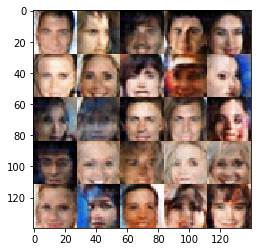

Epoch 1/1 Step 12110... Discriminator Loss: 1.3686... Generator Loss: 0.7341
Epoch 1/1 Step 12120... Discriminator Loss: 1.3239... Generator Loss: 0.7201
Epoch 1/1 Step 12130... Discriminator Loss: 1.2121... Generator Loss: 0.9813
Epoch 1/1 Step 12140... Discriminator Loss: 1.4051... Generator Loss: 0.7739
Epoch 1/1 Step 12150... Discriminator Loss: 1.3431... Generator Loss: 0.9005
Epoch 1/1 Step 12160... Discriminator Loss: 1.2812... Generator Loss: 0.7551
Epoch 1/1 Step 12170... Discriminator Loss: 1.3344... Generator Loss: 0.7849
Epoch 1/1 Step 12180... Discriminator Loss: 1.2825... Generator Loss: 0.8571
Epoch 1/1 Step 12190... Discriminator Loss: 1.4139... Generator Loss: 0.6729
Epoch 1/1 Step 12200... Discriminator Loss: 1.2929... Generator Loss: 0.7638


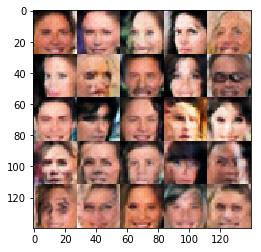

Epoch 1/1 Step 12210... Discriminator Loss: 1.3405... Generator Loss: 0.6986
Epoch 1/1 Step 12220... Discriminator Loss: 1.3830... Generator Loss: 0.6548
Epoch 1/1 Step 12230... Discriminator Loss: 1.4336... Generator Loss: 0.7010
Epoch 1/1 Step 12240... Discriminator Loss: 1.2715... Generator Loss: 0.7685
Epoch 1/1 Step 12250... Discriminator Loss: 1.3561... Generator Loss: 0.7394
Epoch 1/1 Step 12260... Discriminator Loss: 1.2601... Generator Loss: 0.8947
Epoch 1/1 Step 12270... Discriminator Loss: 1.2806... Generator Loss: 0.8705
Epoch 1/1 Step 12280... Discriminator Loss: 1.3546... Generator Loss: 0.7721
Epoch 1/1 Step 12290... Discriminator Loss: 1.1908... Generator Loss: 0.9709
Epoch 1/1 Step 12300... Discriminator Loss: 1.5922... Generator Loss: 0.7005


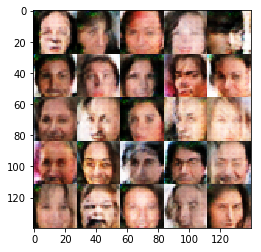

Epoch 1/1 Step 12310... Discriminator Loss: 1.5117... Generator Loss: 0.6070
Epoch 1/1 Step 12320... Discriminator Loss: 1.4235... Generator Loss: 0.7461
Epoch 1/1 Step 12330... Discriminator Loss: 1.4084... Generator Loss: 0.7818
Epoch 1/1 Step 12340... Discriminator Loss: 1.4435... Generator Loss: 0.7366
Epoch 1/1 Step 12350... Discriminator Loss: 1.3138... Generator Loss: 0.8037
Epoch 1/1 Step 12360... Discriminator Loss: 1.3884... Generator Loss: 0.7818
Epoch 1/1 Step 12370... Discriminator Loss: 1.4524... Generator Loss: 0.7739
Epoch 1/1 Step 12380... Discriminator Loss: 1.3931... Generator Loss: 0.8173
Epoch 1/1 Step 12390... Discriminator Loss: 1.3777... Generator Loss: 0.7948
Epoch 1/1 Step 12400... Discriminator Loss: 1.2769... Generator Loss: 0.7652


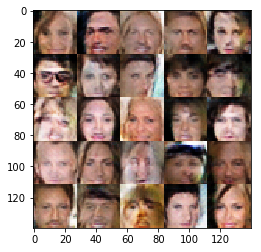

Epoch 1/1 Step 12410... Discriminator Loss: 1.4664... Generator Loss: 0.6561
Epoch 1/1 Step 12420... Discriminator Loss: 1.3709... Generator Loss: 0.7679
Epoch 1/1 Step 12430... Discriminator Loss: 1.5066... Generator Loss: 0.6448
Epoch 1/1 Step 12440... Discriminator Loss: 1.3495... Generator Loss: 0.7246
Epoch 1/1 Step 12450... Discriminator Loss: 1.3621... Generator Loss: 0.6727
Epoch 1/1 Step 12460... Discriminator Loss: 1.4728... Generator Loss: 0.7099
Epoch 1/1 Step 12470... Discriminator Loss: 1.3556... Generator Loss: 0.7202
Epoch 1/1 Step 12480... Discriminator Loss: 1.2941... Generator Loss: 0.7997
Epoch 1/1 Step 12490... Discriminator Loss: 1.3493... Generator Loss: 0.7544
Epoch 1/1 Step 12500... Discriminator Loss: 1.4085... Generator Loss: 0.7481


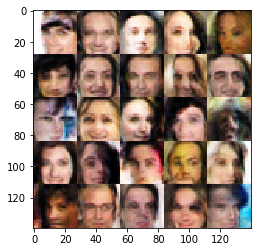

Epoch 1/1 Step 12510... Discriminator Loss: 1.2529... Generator Loss: 0.8189
Epoch 1/1 Step 12520... Discriminator Loss: 1.5103... Generator Loss: 0.6483
Epoch 1/1 Step 12530... Discriminator Loss: 1.3717... Generator Loss: 0.7017
Epoch 1/1 Step 12540... Discriminator Loss: 1.2274... Generator Loss: 0.8292
Epoch 1/1 Step 12550... Discriminator Loss: 1.4532... Generator Loss: 0.6491
Epoch 1/1 Step 12560... Discriminator Loss: 1.4200... Generator Loss: 0.7629
Epoch 1/1 Step 12570... Discriminator Loss: 1.3613... Generator Loss: 0.7270
Epoch 1/1 Step 12580... Discriminator Loss: 1.3365... Generator Loss: 0.7640
Epoch 1/1 Step 12590... Discriminator Loss: 1.3230... Generator Loss: 0.8381
Epoch 1/1 Step 12600... Discriminator Loss: 1.3436... Generator Loss: 0.6912


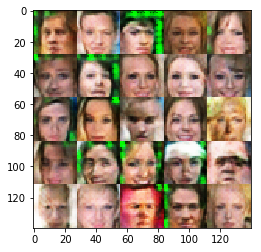

Epoch 1/1 Step 12610... Discriminator Loss: 1.1413... Generator Loss: 0.7916
Epoch 1/1 Step 12620... Discriminator Loss: 1.4169... Generator Loss: 0.5761
Epoch 1/1 Step 12630... Discriminator Loss: 1.0871... Generator Loss: 1.0346
Epoch 1/1 Step 12640... Discriminator Loss: 1.4116... Generator Loss: 0.7100
Epoch 1/1 Step 12650... Discriminator Loss: 1.4342... Generator Loss: 0.6497
Epoch 1/1 Step 12660... Discriminator Loss: 1.1876... Generator Loss: 0.8209
Epoch 1/1 Step 12670... Discriminator Loss: 1.3952... Generator Loss: 0.7261
Epoch 1/1 Step 12680... Discriminator Loss: 1.2165... Generator Loss: 0.8639
Epoch 1/1 Step 12690... Discriminator Loss: 1.4714... Generator Loss: 0.6564
Epoch 1/1 Step 12700... Discriminator Loss: 1.2191... Generator Loss: 0.9004


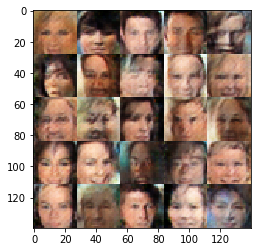

Epoch 1/1 Step 12710... Discriminator Loss: 1.3694... Generator Loss: 0.6969
Epoch 1/1 Step 12720... Discriminator Loss: 1.4056... Generator Loss: 0.6685
Epoch 1/1 Step 12730... Discriminator Loss: 1.3058... Generator Loss: 0.7682
Epoch 1/1 Step 12740... Discriminator Loss: 1.3068... Generator Loss: 0.7239
Epoch 1/1 Step 12750... Discriminator Loss: 1.4217... Generator Loss: 0.7680
Epoch 1/1 Step 12760... Discriminator Loss: 1.3214... Generator Loss: 0.7902
Epoch 1/1 Step 12770... Discriminator Loss: 1.2953... Generator Loss: 0.8067
Epoch 1/1 Step 12780... Discriminator Loss: 1.4762... Generator Loss: 0.6968
Epoch 1/1 Step 12790... Discriminator Loss: 1.3617... Generator Loss: 0.7385
Epoch 1/1 Step 12800... Discriminator Loss: 1.4349... Generator Loss: 0.6667


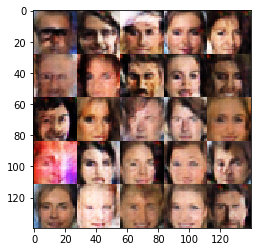

Epoch 1/1 Step 12810... Discriminator Loss: 1.1679... Generator Loss: 0.9931
Epoch 1/1 Step 12820... Discriminator Loss: 1.4853... Generator Loss: 0.7422
Epoch 1/1 Step 12830... Discriminator Loss: 1.4134... Generator Loss: 0.7163
Epoch 1/1 Step 12840... Discriminator Loss: 1.2480... Generator Loss: 0.8716
Epoch 1/1 Step 12850... Discriminator Loss: 1.3855... Generator Loss: 0.7935
Epoch 1/1 Step 12860... Discriminator Loss: 1.4068... Generator Loss: 0.7077
Epoch 1/1 Step 12870... Discriminator Loss: 1.4281... Generator Loss: 0.6471
Epoch 1/1 Step 12880... Discriminator Loss: 1.3560... Generator Loss: 0.8357
Epoch 1/1 Step 12890... Discriminator Loss: 1.2497... Generator Loss: 0.8848
Epoch 1/1 Step 12900... Discriminator Loss: 1.3433... Generator Loss: 0.8131


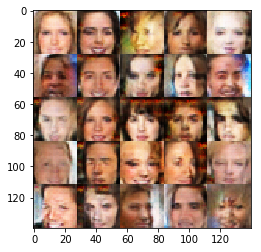

Epoch 1/1 Step 12910... Discriminator Loss: 1.3882... Generator Loss: 0.7128
Epoch 1/1 Step 12920... Discriminator Loss: 1.2735... Generator Loss: 0.8201
Epoch 1/1 Step 12930... Discriminator Loss: 1.3984... Generator Loss: 0.7473
Epoch 1/1 Step 12940... Discriminator Loss: 1.2450... Generator Loss: 0.8145
Epoch 1/1 Step 12950... Discriminator Loss: 1.5113... Generator Loss: 0.5874
Epoch 1/1 Step 12960... Discriminator Loss: 1.3016... Generator Loss: 0.9017
Epoch 1/1 Step 12970... Discriminator Loss: 1.2484... Generator Loss: 0.7961
Epoch 1/1 Step 12980... Discriminator Loss: 1.3950... Generator Loss: 0.6787
Epoch 1/1 Step 12990... Discriminator Loss: 1.4493... Generator Loss: 0.6473
Epoch 1/1 Step 13000... Discriminator Loss: 1.5195... Generator Loss: 0.7432


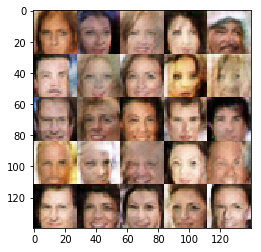

Epoch 1/1 Step 13010... Discriminator Loss: 1.4532... Generator Loss: 0.6346
Epoch 1/1 Step 13020... Discriminator Loss: 1.1842... Generator Loss: 0.9348
Epoch 1/1 Step 13030... Discriminator Loss: 1.3406... Generator Loss: 0.7025
Epoch 1/1 Step 13040... Discriminator Loss: 1.3263... Generator Loss: 0.7685
Epoch 1/1 Step 13050... Discriminator Loss: 1.4711... Generator Loss: 0.6961
Epoch 1/1 Step 13060... Discriminator Loss: 1.2710... Generator Loss: 0.8056
Epoch 1/1 Step 13070... Discriminator Loss: 1.3996... Generator Loss: 0.6946
Epoch 1/1 Step 13080... Discriminator Loss: 1.2866... Generator Loss: 0.8134
Epoch 1/1 Step 13090... Discriminator Loss: 1.3521... Generator Loss: 0.7334
Epoch 1/1 Step 13100... Discriminator Loss: 1.4325... Generator Loss: 0.6897


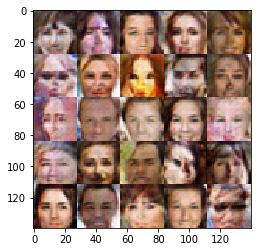

Epoch 1/1 Step 13110... Discriminator Loss: 1.4112... Generator Loss: 0.7267
Epoch 1/1 Step 13120... Discriminator Loss: 1.4694... Generator Loss: 0.7318
Epoch 1/1 Step 13130... Discriminator Loss: 1.4054... Generator Loss: 0.7793
Epoch 1/1 Step 13140... Discriminator Loss: 1.5281... Generator Loss: 0.6157
Epoch 1/1 Step 13150... Discriminator Loss: 1.3494... Generator Loss: 0.8083
Epoch 1/1 Step 13160... Discriminator Loss: 1.2726... Generator Loss: 0.7645
Epoch 1/1 Step 13170... Discriminator Loss: 1.3757... Generator Loss: 0.7496
Epoch 1/1 Step 13180... Discriminator Loss: 1.4455... Generator Loss: 0.7647
Epoch 1/1 Step 13190... Discriminator Loss: 1.4099... Generator Loss: 0.6471
Epoch 1/1 Step 13200... Discriminator Loss: 1.5527... Generator Loss: 0.5782


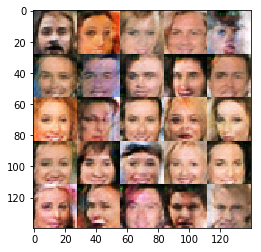

Epoch 1/1 Step 13210... Discriminator Loss: 1.3811... Generator Loss: 0.6744
Epoch 1/1 Step 13220... Discriminator Loss: 1.4297... Generator Loss: 0.6704
Epoch 1/1 Step 13230... Discriminator Loss: 1.2409... Generator Loss: 0.8328
Epoch 1/1 Step 13240... Discriminator Loss: 1.4014... Generator Loss: 0.8283
Epoch 1/1 Step 13250... Discriminator Loss: 1.3373... Generator Loss: 0.8192
Epoch 1/1 Step 13260... Discriminator Loss: 1.2331... Generator Loss: 0.8074
Epoch 1/1 Step 13270... Discriminator Loss: 1.3614... Generator Loss: 0.8212
Epoch 1/1 Step 13280... Discriminator Loss: 1.3112... Generator Loss: 0.7937
Epoch 1/1 Step 13290... Discriminator Loss: 1.2957... Generator Loss: 0.8892
Epoch 1/1 Step 13300... Discriminator Loss: 1.3376... Generator Loss: 0.7978


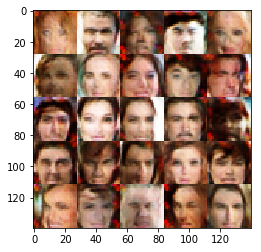

Epoch 1/1 Step 13310... Discriminator Loss: 1.3138... Generator Loss: 0.7909
Epoch 1/1 Step 13320... Discriminator Loss: 1.2452... Generator Loss: 0.8274
Epoch 1/1 Step 13330... Discriminator Loss: 1.4177... Generator Loss: 0.6898
Epoch 1/1 Step 13340... Discriminator Loss: 1.4938... Generator Loss: 0.6768
Epoch 1/1 Step 13350... Discriminator Loss: 1.3386... Generator Loss: 0.8096
Epoch 1/1 Step 13360... Discriminator Loss: 1.0392... Generator Loss: 1.0037
Epoch 1/1 Step 13370... Discriminator Loss: 1.4364... Generator Loss: 0.7539
Epoch 1/1 Step 13380... Discriminator Loss: 1.5372... Generator Loss: 0.6091
Epoch 1/1 Step 13390... Discriminator Loss: 1.4892... Generator Loss: 0.7024
Epoch 1/1 Step 13400... Discriminator Loss: 1.3137... Generator Loss: 0.8196


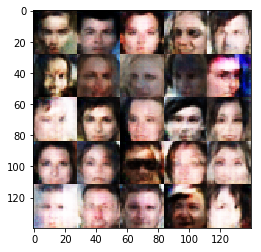

Epoch 1/1 Step 13410... Discriminator Loss: 1.3190... Generator Loss: 0.7751
Epoch 1/1 Step 13420... Discriminator Loss: 1.3597... Generator Loss: 0.7142
Epoch 1/1 Step 13430... Discriminator Loss: 1.3552... Generator Loss: 0.7749
Epoch 1/1 Step 13440... Discriminator Loss: 1.5215... Generator Loss: 0.7938
Epoch 1/1 Step 13450... Discriminator Loss: 1.3383... Generator Loss: 0.7876
Epoch 1/1 Step 13460... Discriminator Loss: 1.3359... Generator Loss: 0.7161
Epoch 1/1 Step 13470... Discriminator Loss: 1.3509... Generator Loss: 0.7529
Epoch 1/1 Step 13480... Discriminator Loss: 1.3962... Generator Loss: 0.7469
Epoch 1/1 Step 13490... Discriminator Loss: 1.5067... Generator Loss: 0.7124
Epoch 1/1 Step 13500... Discriminator Loss: 1.4671... Generator Loss: 0.7200


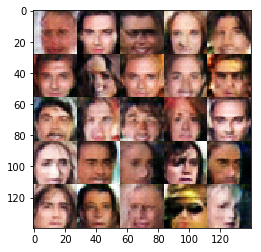

Epoch 1/1 Step 13510... Discriminator Loss: 1.3263... Generator Loss: 0.7137
Epoch 1/1 Step 13520... Discriminator Loss: 1.3192... Generator Loss: 0.7493
Epoch 1/1 Step 13530... Discriminator Loss: 1.4201... Generator Loss: 0.6496
Epoch 1/1 Step 13540... Discriminator Loss: 1.3412... Generator Loss: 0.7204
Epoch 1/1 Step 13550... Discriminator Loss: 1.4525... Generator Loss: 0.6155
Epoch 1/1 Step 13560... Discriminator Loss: 1.3378... Generator Loss: 0.7482
Epoch 1/1 Step 13570... Discriminator Loss: 1.3320... Generator Loss: 0.7448
Epoch 1/1 Step 13580... Discriminator Loss: 1.4566... Generator Loss: 0.7056
Epoch 1/1 Step 13590... Discriminator Loss: 1.3486... Generator Loss: 0.8196
Epoch 1/1 Step 13600... Discriminator Loss: 1.3225... Generator Loss: 0.7705


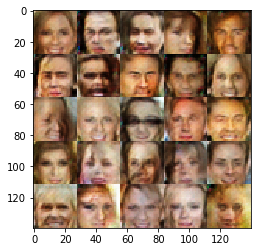

Epoch 1/1 Step 13610... Discriminator Loss: 1.3080... Generator Loss: 0.7746
Epoch 1/1 Step 13620... Discriminator Loss: 1.2230... Generator Loss: 0.9064
Epoch 1/1 Step 13630... Discriminator Loss: 1.3505... Generator Loss: 0.8050
Epoch 1/1 Step 13640... Discriminator Loss: 1.3976... Generator Loss: 0.7833
Epoch 1/1 Step 13650... Discriminator Loss: 1.4831... Generator Loss: 0.6372
Epoch 1/1 Step 13660... Discriminator Loss: 1.4178... Generator Loss: 0.7357
Epoch 1/1 Step 13670... Discriminator Loss: 1.4545... Generator Loss: 0.6563
Epoch 1/1 Step 13680... Discriminator Loss: 1.1844... Generator Loss: 0.8722
Epoch 1/1 Step 13690... Discriminator Loss: 1.4074... Generator Loss: 0.7839
Epoch 1/1 Step 13700... Discriminator Loss: 1.3661... Generator Loss: 0.7505


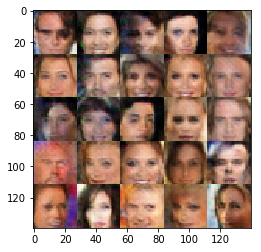

Epoch 1/1 Step 13710... Discriminator Loss: 1.4131... Generator Loss: 0.7205
Epoch 1/1 Step 13720... Discriminator Loss: 1.2433... Generator Loss: 0.7934
Epoch 1/1 Step 13730... Discriminator Loss: 1.4432... Generator Loss: 0.7216
Epoch 1/1 Step 13740... Discriminator Loss: 1.3642... Generator Loss: 0.8202
Epoch 1/1 Step 13750... Discriminator Loss: 1.3660... Generator Loss: 0.7641
Epoch 1/1 Step 13760... Discriminator Loss: 1.4593... Generator Loss: 0.6517
Epoch 1/1 Step 13770... Discriminator Loss: 1.2538... Generator Loss: 0.8487
Epoch 1/1 Step 13780... Discriminator Loss: 1.4012... Generator Loss: 0.7139
Epoch 1/1 Step 13790... Discriminator Loss: 1.3996... Generator Loss: 0.7631
Epoch 1/1 Step 13800... Discriminator Loss: 1.3206... Generator Loss: 0.7226


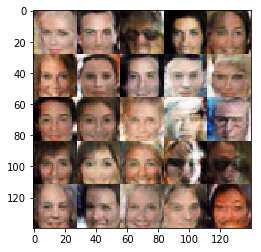

Epoch 1/1 Step 13810... Discriminator Loss: 1.3224... Generator Loss: 0.7568
Epoch 1/1 Step 13820... Discriminator Loss: 1.3136... Generator Loss: 0.7730
Epoch 1/1 Step 13830... Discriminator Loss: 1.3831... Generator Loss: 0.7378
Epoch 1/1 Step 13840... Discriminator Loss: 1.3562... Generator Loss: 0.7945
Epoch 1/1 Step 13850... Discriminator Loss: 1.2810... Generator Loss: 0.8339
Epoch 1/1 Step 13860... Discriminator Loss: 1.4800... Generator Loss: 0.5690
Epoch 1/1 Step 13870... Discriminator Loss: 1.3301... Generator Loss: 0.6968
Epoch 1/1 Step 13880... Discriminator Loss: 1.3128... Generator Loss: 0.7141
Epoch 1/1 Step 13890... Discriminator Loss: 1.4495... Generator Loss: 0.7047
Epoch 1/1 Step 13900... Discriminator Loss: 1.3670... Generator Loss: 0.7640


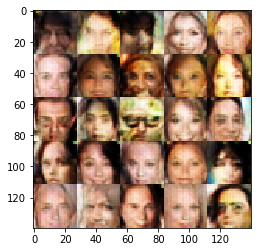

Epoch 1/1 Step 13910... Discriminator Loss: 1.3286... Generator Loss: 0.7611
Epoch 1/1 Step 13920... Discriminator Loss: 1.3581... Generator Loss: 0.7862
Epoch 1/1 Step 13930... Discriminator Loss: 1.3125... Generator Loss: 0.8092
Epoch 1/1 Step 13940... Discriminator Loss: 1.4054... Generator Loss: 0.7100
Epoch 1/1 Step 13950... Discriminator Loss: 1.3827... Generator Loss: 0.7119
Epoch 1/1 Step 13960... Discriminator Loss: 1.3766... Generator Loss: 0.8145
Epoch 1/1 Step 13970... Discriminator Loss: 1.3353... Generator Loss: 0.7431
Epoch 1/1 Step 13980... Discriminator Loss: 1.3361... Generator Loss: 0.8461
Epoch 1/1 Step 13990... Discriminator Loss: 1.3012... Generator Loss: 0.7908
Epoch 1/1 Step 14000... Discriminator Loss: 1.3435... Generator Loss: 0.7316


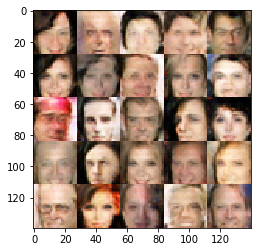

Epoch 1/1 Step 14010... Discriminator Loss: 1.2619... Generator Loss: 0.8684
Epoch 1/1 Step 14020... Discriminator Loss: 1.3432... Generator Loss: 0.7575
Epoch 1/1 Step 14030... Discriminator Loss: 1.3567... Generator Loss: 0.7327
Epoch 1/1 Step 14040... Discriminator Loss: 1.4891... Generator Loss: 0.6441
Epoch 1/1 Step 14050... Discriminator Loss: 1.4398... Generator Loss: 0.6681
Epoch 1/1 Step 14060... Discriminator Loss: 1.2811... Generator Loss: 0.7580
Epoch 1/1 Step 14070... Discriminator Loss: 1.5207... Generator Loss: 0.6234
Epoch 1/1 Step 14080... Discriminator Loss: 1.4012... Generator Loss: 0.7701
Epoch 1/1 Step 14090... Discriminator Loss: 1.3689... Generator Loss: 0.7829
Epoch 1/1 Step 14100... Discriminator Loss: 1.4230... Generator Loss: 0.7640


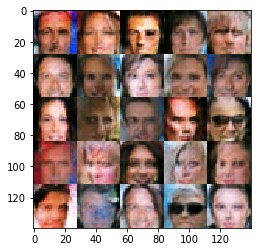

Epoch 1/1 Step 14110... Discriminator Loss: 1.3007... Generator Loss: 0.7617
Epoch 1/1 Step 14120... Discriminator Loss: 1.5405... Generator Loss: 0.6023
Epoch 1/1 Step 14130... Discriminator Loss: 1.3681... Generator Loss: 0.7655
Epoch 1/1 Step 14140... Discriminator Loss: 1.4139... Generator Loss: 0.7021
Epoch 1/1 Step 14150... Discriminator Loss: 1.4018... Generator Loss: 0.6782
Epoch 1/1 Step 14160... Discriminator Loss: 1.1887... Generator Loss: 0.8396
Epoch 1/1 Step 14170... Discriminator Loss: 1.4976... Generator Loss: 0.6234
Epoch 1/1 Step 14180... Discriminator Loss: 1.5215... Generator Loss: 0.6124
Epoch 1/1 Step 14190... Discriminator Loss: 1.3147... Generator Loss: 0.7687
Epoch 1/1 Step 14200... Discriminator Loss: 1.3309... Generator Loss: 0.7884


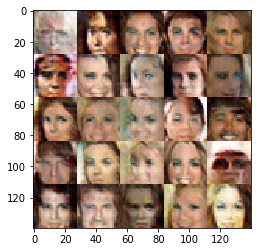

Epoch 1/1 Step 14210... Discriminator Loss: 1.2917... Generator Loss: 0.7615
Epoch 1/1 Step 14220... Discriminator Loss: 1.2930... Generator Loss: 0.7479
Epoch 1/1 Step 14230... Discriminator Loss: 1.3066... Generator Loss: 0.7458
Epoch 1/1 Step 14240... Discriminator Loss: 1.2948... Generator Loss: 0.7907
Epoch 1/1 Step 14250... Discriminator Loss: 1.3761... Generator Loss: 0.6912
Epoch 1/1 Step 14260... Discriminator Loss: 1.3337... Generator Loss: 0.7288
Epoch 1/1 Step 14270... Discriminator Loss: 1.3709... Generator Loss: 0.7360
Epoch 1/1 Step 14280... Discriminator Loss: 1.3996... Generator Loss: 0.7702
Epoch 1/1 Step 14290... Discriminator Loss: 1.3399... Generator Loss: 0.8351
Epoch 1/1 Step 14300... Discriminator Loss: 1.3074... Generator Loss: 0.6994


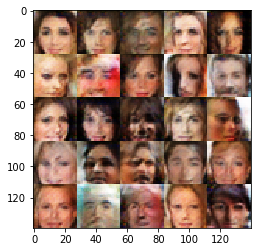

Epoch 1/1 Step 14310... Discriminator Loss: 1.4851... Generator Loss: 0.7605
Epoch 1/1 Step 14320... Discriminator Loss: 1.3766... Generator Loss: 0.7640
Epoch 1/1 Step 14330... Discriminator Loss: 1.2261... Generator Loss: 0.8998
Epoch 1/1 Step 14340... Discriminator Loss: 1.4019... Generator Loss: 0.6410
Epoch 1/1 Step 14350... Discriminator Loss: 1.3747... Generator Loss: 0.6826
Epoch 1/1 Step 14360... Discriminator Loss: 1.3704... Generator Loss: 0.7238
Epoch 1/1 Step 14370... Discriminator Loss: 1.2545... Generator Loss: 0.7992
Epoch 1/1 Step 14380... Discriminator Loss: 1.3753... Generator Loss: 0.7516
Epoch 1/1 Step 14390... Discriminator Loss: 1.3007... Generator Loss: 0.8178
Epoch 1/1 Step 14400... Discriminator Loss: 1.4366... Generator Loss: 0.6579


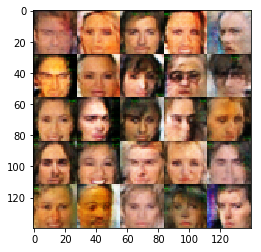

Epoch 1/1 Step 14410... Discriminator Loss: 1.4830... Generator Loss: 0.7287
Epoch 1/1 Step 14420... Discriminator Loss: 1.2452... Generator Loss: 0.8287
Epoch 1/1 Step 14430... Discriminator Loss: 1.4109... Generator Loss: 0.7898
Epoch 1/1 Step 14440... Discriminator Loss: 1.3930... Generator Loss: 0.7027
Epoch 1/1 Step 14450... Discriminator Loss: 1.4331... Generator Loss: 0.7286
Epoch 1/1 Step 14460... Discriminator Loss: 1.2783... Generator Loss: 0.7790
Epoch 1/1 Step 14470... Discriminator Loss: 1.4758... Generator Loss: 0.7099
Epoch 1/1 Step 14480... Discriminator Loss: 1.3211... Generator Loss: 0.7854
Epoch 1/1 Step 14490... Discriminator Loss: 1.3870... Generator Loss: 0.8665
Epoch 1/1 Step 14500... Discriminator Loss: 1.3553... Generator Loss: 0.7354


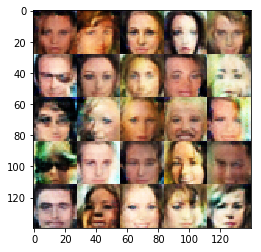

Epoch 1/1 Step 14510... Discriminator Loss: 1.3785... Generator Loss: 0.7018
Epoch 1/1 Step 14520... Discriminator Loss: 1.3828... Generator Loss: 0.7291
Epoch 1/1 Step 14530... Discriminator Loss: 1.3627... Generator Loss: 0.7305
Epoch 1/1 Step 14540... Discriminator Loss: 1.4393... Generator Loss: 0.6773
Epoch 1/1 Step 14550... Discriminator Loss: 1.4498... Generator Loss: 0.7115
Epoch 1/1 Step 14560... Discriminator Loss: 1.3698... Generator Loss: 0.7655
Epoch 1/1 Step 14570... Discriminator Loss: 1.3460... Generator Loss: 0.8083
Epoch 1/1 Step 14580... Discriminator Loss: 1.2734... Generator Loss: 0.6825
Epoch 1/1 Step 14590... Discriminator Loss: 1.4163... Generator Loss: 0.6473
Epoch 1/1 Step 14600... Discriminator Loss: 1.3481... Generator Loss: 0.8432


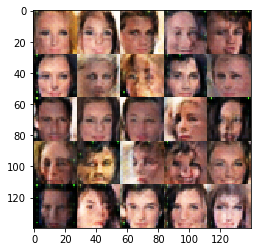

Epoch 1/1 Step 14610... Discriminator Loss: 1.3888... Generator Loss: 0.7549
Epoch 1/1 Step 14620... Discriminator Loss: 1.1014... Generator Loss: 1.0797
Epoch 1/1 Step 14630... Discriminator Loss: 1.3682... Generator Loss: 0.8010
Epoch 1/1 Step 14640... Discriminator Loss: 1.4206... Generator Loss: 0.7944
Epoch 1/1 Step 14650... Discriminator Loss: 1.3578... Generator Loss: 0.7326
Epoch 1/1 Step 14660... Discriminator Loss: 1.5602... Generator Loss: 0.6718
Epoch 1/1 Step 14670... Discriminator Loss: 1.3417... Generator Loss: 0.7506
Epoch 1/1 Step 14680... Discriminator Loss: 1.2892... Generator Loss: 0.8109
Epoch 1/1 Step 14690... Discriminator Loss: 1.4931... Generator Loss: 0.7145
Epoch 1/1 Step 14700... Discriminator Loss: 1.3586... Generator Loss: 0.8527


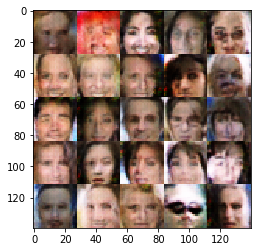

Epoch 1/1 Step 14710... Discriminator Loss: 1.3346... Generator Loss: 0.7670
Epoch 1/1 Step 14720... Discriminator Loss: 1.3169... Generator Loss: 0.7588
Epoch 1/1 Step 14730... Discriminator Loss: 1.2535... Generator Loss: 0.7892
Epoch 1/1 Step 14740... Discriminator Loss: 1.3002... Generator Loss: 0.8781
Epoch 1/1 Step 14750... Discriminator Loss: 1.3042... Generator Loss: 0.8215
Epoch 1/1 Step 14760... Discriminator Loss: 1.3982... Generator Loss: 0.6947
Epoch 1/1 Step 14770... Discriminator Loss: 1.2980... Generator Loss: 0.8481
Epoch 1/1 Step 14780... Discriminator Loss: 1.5459... Generator Loss: 0.6180
Epoch 1/1 Step 14790... Discriminator Loss: 1.3254... Generator Loss: 0.7954
Epoch 1/1 Step 14800... Discriminator Loss: 1.4548... Generator Loss: 0.8039


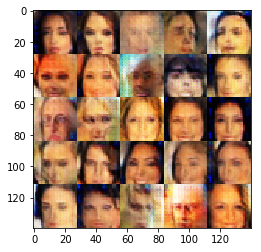

Epoch 1/1 Step 14810... Discriminator Loss: 1.4252... Generator Loss: 0.7705
Epoch 1/1 Step 14820... Discriminator Loss: 1.3430... Generator Loss: 0.7978
Epoch 1/1 Step 14830... Discriminator Loss: 1.2710... Generator Loss: 0.8216
Epoch 1/1 Step 14840... Discriminator Loss: 1.2943... Generator Loss: 0.8764
Epoch 1/1 Step 14850... Discriminator Loss: 1.4726... Generator Loss: 0.6922
Epoch 1/1 Step 14860... Discriminator Loss: 1.4218... Generator Loss: 0.7367
Epoch 1/1 Step 14870... Discriminator Loss: 1.3583... Generator Loss: 0.7106
Epoch 1/1 Step 14880... Discriminator Loss: 1.3741... Generator Loss: 0.7719
Epoch 1/1 Step 14890... Discriminator Loss: 1.4036... Generator Loss: 0.7437
Epoch 1/1 Step 14900... Discriminator Loss: 1.2272... Generator Loss: 0.7691


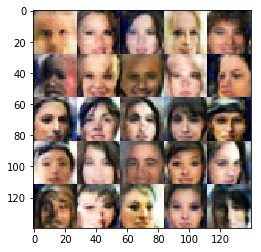

Epoch 1/1 Step 14910... Discriminator Loss: 1.4278... Generator Loss: 0.6847
Epoch 1/1 Step 14920... Discriminator Loss: 1.3723... Generator Loss: 0.6687
Epoch 1/1 Step 14930... Discriminator Loss: 1.2947... Generator Loss: 0.8601
Epoch 1/1 Step 14940... Discriminator Loss: 1.3013... Generator Loss: 0.7856
Epoch 1/1 Step 14950... Discriminator Loss: 1.2997... Generator Loss: 0.9005
Epoch 1/1 Step 14960... Discriminator Loss: 1.4474... Generator Loss: 0.7192
Epoch 1/1 Step 14970... Discriminator Loss: 1.3220... Generator Loss: 0.8295
Epoch 1/1 Step 14980... Discriminator Loss: 1.3104... Generator Loss: 0.8175
Epoch 1/1 Step 14990... Discriminator Loss: 1.3294... Generator Loss: 0.8076
Epoch 1/1 Step 15000... Discriminator Loss: 1.3412... Generator Loss: 0.7541


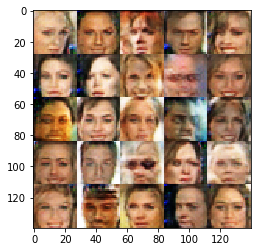

Epoch 1/1 Step 15010... Discriminator Loss: 1.2252... Generator Loss: 0.8515
Epoch 1/1 Step 15020... Discriminator Loss: 1.3793... Generator Loss: 0.7938
Epoch 1/1 Step 15030... Discriminator Loss: 1.3531... Generator Loss: 0.8179
Epoch 1/1 Step 15040... Discriminator Loss: 1.3760... Generator Loss: 0.7889
Epoch 1/1 Step 15050... Discriminator Loss: 1.3049... Generator Loss: 0.7969
Epoch 1/1 Step 15060... Discriminator Loss: 1.2246... Generator Loss: 0.9240
Epoch 1/1 Step 15070... Discriminator Loss: 1.4573... Generator Loss: 0.6478
Epoch 1/1 Step 15080... Discriminator Loss: 1.3556... Generator Loss: 0.7443
Epoch 1/1 Step 15090... Discriminator Loss: 1.3064... Generator Loss: 0.8327
Epoch 1/1 Step 15100... Discriminator Loss: 1.4177... Generator Loss: 0.7746


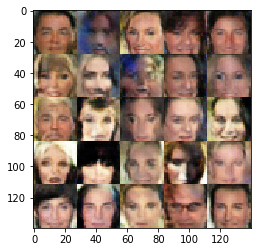

Epoch 1/1 Step 15110... Discriminator Loss: 1.3330... Generator Loss: 0.8528
Epoch 1/1 Step 15120... Discriminator Loss: 1.2490... Generator Loss: 0.8776
Epoch 1/1 Step 15130... Discriminator Loss: 1.2291... Generator Loss: 0.9309
Epoch 1/1 Step 15140... Discriminator Loss: 1.3225... Generator Loss: 0.7896
Epoch 1/1 Step 15150... Discriminator Loss: 1.3655... Generator Loss: 0.7252
Epoch 1/1 Step 15160... Discriminator Loss: 1.2042... Generator Loss: 0.8022
Epoch 1/1 Step 15170... Discriminator Loss: 1.4049... Generator Loss: 0.7423
Epoch 1/1 Step 15180... Discriminator Loss: 1.2875... Generator Loss: 0.7999
Epoch 1/1 Step 15190... Discriminator Loss: 1.4086... Generator Loss: 0.7997
Epoch 1/1 Step 15200... Discriminator Loss: 1.2820... Generator Loss: 0.8053


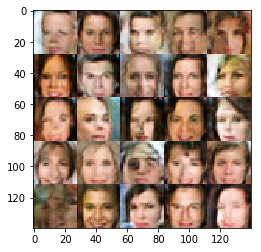

Epoch 1/1 Step 15210... Discriminator Loss: 1.2817... Generator Loss: 0.8255
Epoch 1/1 Step 15220... Discriminator Loss: 1.2979... Generator Loss: 0.8540
Epoch 1/1 Step 15230... Discriminator Loss: 1.3995... Generator Loss: 0.7563
Epoch 1/1 Step 15240... Discriminator Loss: 1.3832... Generator Loss: 0.6814
Epoch 1/1 Step 15250... Discriminator Loss: 1.4271... Generator Loss: 0.7121
Epoch 1/1 Step 15260... Discriminator Loss: 1.4768... Generator Loss: 0.6857
Epoch 1/1 Step 15270... Discriminator Loss: 1.3198... Generator Loss: 0.8035
Epoch 1/1 Step 15280... Discriminator Loss: 1.3322... Generator Loss: 0.7690
Epoch 1/1 Step 15290... Discriminator Loss: 1.4481... Generator Loss: 0.7285
Epoch 1/1 Step 15300... Discriminator Loss: 1.3566... Generator Loss: 0.7367


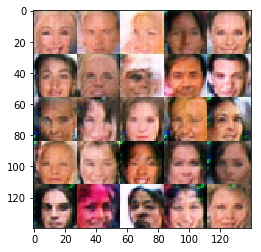

Epoch 1/1 Step 15310... Discriminator Loss: 1.3826... Generator Loss: 0.7657
Epoch 1/1 Step 15320... Discriminator Loss: 1.3193... Generator Loss: 0.7793
Epoch 1/1 Step 15330... Discriminator Loss: 1.2847... Generator Loss: 0.8260
Epoch 1/1 Step 15340... Discriminator Loss: 1.3312... Generator Loss: 0.7673
Epoch 1/1 Step 15350... Discriminator Loss: 1.2372... Generator Loss: 0.8502
Epoch 1/1 Step 15360... Discriminator Loss: 1.4423... Generator Loss: 0.6445
Epoch 1/1 Step 15370... Discriminator Loss: 1.4017... Generator Loss: 0.7863
Epoch 1/1 Step 15380... Discriminator Loss: 1.4314... Generator Loss: 0.7200
Epoch 1/1 Step 15390... Discriminator Loss: 1.4792... Generator Loss: 0.6323
Epoch 1/1 Step 15400... Discriminator Loss: 1.4386... Generator Loss: 0.7439


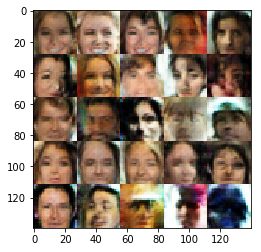

Epoch 1/1 Step 15410... Discriminator Loss: 1.3488... Generator Loss: 0.7544
Epoch 1/1 Step 15420... Discriminator Loss: 1.3720... Generator Loss: 0.7497
Epoch 1/1 Step 15430... Discriminator Loss: 1.3536... Generator Loss: 0.7307
Epoch 1/1 Step 15440... Discriminator Loss: 1.6076... Generator Loss: 0.6484
Epoch 1/1 Step 15450... Discriminator Loss: 1.2979... Generator Loss: 0.7750
Epoch 1/1 Step 15460... Discriminator Loss: 1.4234... Generator Loss: 0.7506
Epoch 1/1 Step 15470... Discriminator Loss: 1.3929... Generator Loss: 0.7192
Epoch 1/1 Step 15480... Discriminator Loss: 1.2531... Generator Loss: 0.8555
Epoch 1/1 Step 15490... Discriminator Loss: 1.2811... Generator Loss: 0.7974
Epoch 1/1 Step 15500... Discriminator Loss: 1.2742... Generator Loss: 0.8205


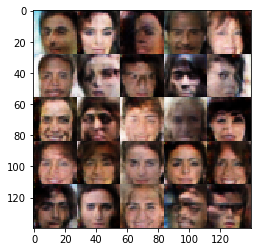

Epoch 1/1 Step 15510... Discriminator Loss: 1.3975... Generator Loss: 0.6785
Epoch 1/1 Step 15520... Discriminator Loss: 1.4057... Generator Loss: 0.7413
Epoch 1/1 Step 15530... Discriminator Loss: 1.4570... Generator Loss: 0.6952
Epoch 1/1 Step 15540... Discriminator Loss: 1.4519... Generator Loss: 0.6807
Epoch 1/1 Step 15550... Discriminator Loss: 1.4164... Generator Loss: 0.7150
Epoch 1/1 Step 15560... Discriminator Loss: 1.3989... Generator Loss: 0.7034
Epoch 1/1 Step 15570... Discriminator Loss: 1.4993... Generator Loss: 0.7269
Epoch 1/1 Step 15580... Discriminator Loss: 1.3831... Generator Loss: 0.7602
Epoch 1/1 Step 15590... Discriminator Loss: 1.3350... Generator Loss: 0.7171
Epoch 1/1 Step 15600... Discriminator Loss: 1.4238... Generator Loss: 0.7987


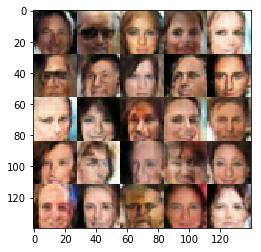

Epoch 1/1 Step 15610... Discriminator Loss: 1.3800... Generator Loss: 0.7735
Epoch 1/1 Step 15620... Discriminator Loss: 1.4129... Generator Loss: 0.8029
Epoch 1/1 Step 15630... Discriminator Loss: 1.4975... Generator Loss: 0.6832
Epoch 1/1 Step 15640... Discriminator Loss: 1.1697... Generator Loss: 0.8506
Epoch 1/1 Step 15650... Discriminator Loss: 1.4516... Generator Loss: 0.6883
Epoch 1/1 Step 15660... Discriminator Loss: 1.3256... Generator Loss: 0.7819
Epoch 1/1 Step 15670... Discriminator Loss: 1.4088... Generator Loss: 0.7643
Epoch 1/1 Step 15680... Discriminator Loss: 1.2982... Generator Loss: 0.8341
Epoch 1/1 Step 15690... Discriminator Loss: 1.2460... Generator Loss: 0.8313
Epoch 1/1 Step 15700... Discriminator Loss: 1.4151... Generator Loss: 0.7573


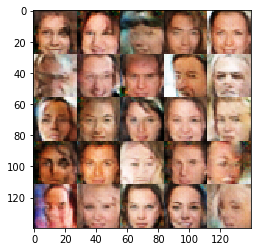

Epoch 1/1 Step 15710... Discriminator Loss: 1.2420... Generator Loss: 0.8378
Epoch 1/1 Step 15720... Discriminator Loss: 1.3454... Generator Loss: 0.9211
Epoch 1/1 Step 15730... Discriminator Loss: 1.2644... Generator Loss: 0.8424
Epoch 1/1 Step 15740... Discriminator Loss: 1.3804... Generator Loss: 0.6612
Epoch 1/1 Step 15750... Discriminator Loss: 1.4060... Generator Loss: 0.7012
Epoch 1/1 Step 15760... Discriminator Loss: 1.3218... Generator Loss: 0.7055
Epoch 1/1 Step 15770... Discriminator Loss: 1.3106... Generator Loss: 0.8190
Epoch 1/1 Step 15780... Discriminator Loss: 1.3595... Generator Loss: 0.7794
Epoch 1/1 Step 15790... Discriminator Loss: 1.3853... Generator Loss: 0.7827
Epoch 1/1 Step 15800... Discriminator Loss: 1.3243... Generator Loss: 0.8202


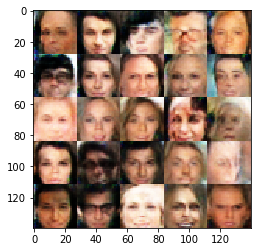

Epoch 1/1 Step 15810... Discriminator Loss: 1.3844... Generator Loss: 0.7506
Epoch 1/1 Step 15820... Discriminator Loss: 1.3548... Generator Loss: 0.8089
Epoch 1/1 Step 15830... Discriminator Loss: 1.4269... Generator Loss: 0.7642
Epoch 1/1 Step 15840... Discriminator Loss: 1.4703... Generator Loss: 0.7054
Epoch 1/1 Step 15850... Discriminator Loss: 1.4375... Generator Loss: 0.7011
Epoch 1/1 Step 15860... Discriminator Loss: 1.3643... Generator Loss: 0.7530
Epoch 1/1 Step 15870... Discriminator Loss: 1.4490... Generator Loss: 0.6708
Epoch 1/1 Step 15880... Discriminator Loss: 1.4159... Generator Loss: 0.7739
Epoch 1/1 Step 15890... Discriminator Loss: 1.2891... Generator Loss: 0.8365
Epoch 1/1 Step 15900... Discriminator Loss: 1.5339... Generator Loss: 0.6710


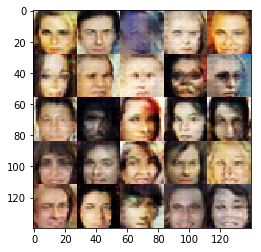

Epoch 1/1 Step 15910... Discriminator Loss: 1.3439... Generator Loss: 0.7386
Epoch 1/1 Step 15920... Discriminator Loss: 1.3781... Generator Loss: 0.7704
Epoch 1/1 Step 15930... Discriminator Loss: 1.4325... Generator Loss: 0.8230
Epoch 1/1 Step 15940... Discriminator Loss: 1.3130... Generator Loss: 0.8128
Epoch 1/1 Step 15950... Discriminator Loss: 1.1766... Generator Loss: 0.8791
Epoch 1/1 Step 15960... Discriminator Loss: 1.3612... Generator Loss: 0.7213
Epoch 1/1 Step 15970... Discriminator Loss: 1.2970... Generator Loss: 0.8030
Epoch 1/1 Step 15980... Discriminator Loss: 1.2749... Generator Loss: 0.7840
Epoch 1/1 Step 15990... Discriminator Loss: 1.1869... Generator Loss: 0.8788
Epoch 1/1 Step 16000... Discriminator Loss: 1.5375... Generator Loss: 0.7806


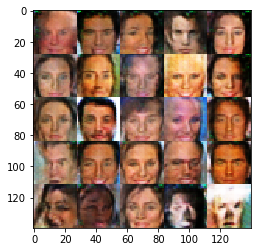

Epoch 1/1 Step 16010... Discriminator Loss: 1.4002... Generator Loss: 0.7266
Epoch 1/1 Step 16020... Discriminator Loss: 1.2366... Generator Loss: 0.9486
Epoch 1/1 Step 16030... Discriminator Loss: 1.3262... Generator Loss: 0.8002
Epoch 1/1 Step 16040... Discriminator Loss: 1.3911... Generator Loss: 0.7038
Epoch 1/1 Step 16050... Discriminator Loss: 1.4130... Generator Loss: 0.7193
Epoch 1/1 Step 16060... Discriminator Loss: 1.3104... Generator Loss: 0.7476
Epoch 1/1 Step 16070... Discriminator Loss: 1.3795... Generator Loss: 0.7645
Epoch 1/1 Step 16080... Discriminator Loss: 1.4579... Generator Loss: 0.6710
Epoch 1/1 Step 16090... Discriminator Loss: 1.2961... Generator Loss: 0.7602
Epoch 1/1 Step 16100... Discriminator Loss: 1.3680... Generator Loss: 0.7458


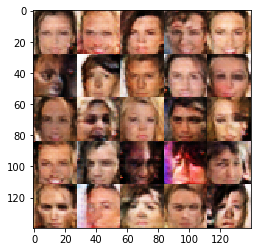

Epoch 1/1 Step 16110... Discriminator Loss: 1.4582... Generator Loss: 0.6946
Epoch 1/1 Step 16120... Discriminator Loss: 1.4381... Generator Loss: 0.7389
Epoch 1/1 Step 16130... Discriminator Loss: 1.3983... Generator Loss: 0.7943
Epoch 1/1 Step 16140... Discriminator Loss: 1.2223... Generator Loss: 0.8583
Epoch 1/1 Step 16150... Discriminator Loss: 1.2870... Generator Loss: 0.7608
Epoch 1/1 Step 16160... Discriminator Loss: 1.4351... Generator Loss: 0.8189
Epoch 1/1 Step 16170... Discriminator Loss: 1.2495... Generator Loss: 0.8684
Epoch 1/1 Step 16180... Discriminator Loss: 1.3503... Generator Loss: 0.7619
Epoch 1/1 Step 16190... Discriminator Loss: 1.4964... Generator Loss: 0.6847
Epoch 1/1 Step 16200... Discriminator Loss: 1.4222... Generator Loss: 0.7688


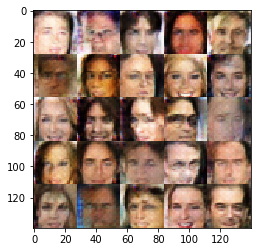

Epoch 1/1 Step 16210... Discriminator Loss: 1.2835... Generator Loss: 0.8291
Epoch 1/1 Step 16220... Discriminator Loss: 1.3527... Generator Loss: 0.7784
Epoch 1/1 Step 16230... Discriminator Loss: 1.2684... Generator Loss: 0.8591
Epoch 1/1 Step 16240... Discriminator Loss: 1.2594... Generator Loss: 0.8282
Epoch 1/1 Step 16250... Discriminator Loss: 1.2775... Generator Loss: 0.8198
Epoch 1/1 Step 16260... Discriminator Loss: 1.3367... Generator Loss: 0.7964
Epoch 1/1 Step 16270... Discriminator Loss: 1.3753... Generator Loss: 0.6961
Epoch 1/1 Step 16280... Discriminator Loss: 1.4261... Generator Loss: 0.7595
Epoch 1/1 Step 16290... Discriminator Loss: 1.3351... Generator Loss: 0.8009
Epoch 1/1 Step 16300... Discriminator Loss: 1.3481... Generator Loss: 0.7246


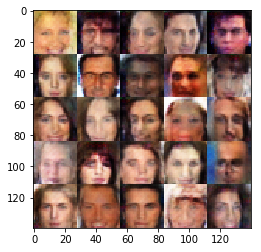

Epoch 1/1 Step 16310... Discriminator Loss: 1.4133... Generator Loss: 0.6912
Epoch 1/1 Step 16320... Discriminator Loss: 1.2528... Generator Loss: 0.9231
Epoch 1/1 Step 16330... Discriminator Loss: 1.4928... Generator Loss: 0.6662
Epoch 1/1 Step 16340... Discriminator Loss: 1.3783... Generator Loss: 0.7479
Epoch 1/1 Step 16350... Discriminator Loss: 1.2532... Generator Loss: 0.8153
Epoch 1/1 Step 16360... Discriminator Loss: 1.3838... Generator Loss: 0.8662
Epoch 1/1 Step 16370... Discriminator Loss: 1.3879... Generator Loss: 0.8105
Epoch 1/1 Step 16380... Discriminator Loss: 1.2812... Generator Loss: 0.8464
Epoch 1/1 Step 16390... Discriminator Loss: 1.3958... Generator Loss: 0.8397
Epoch 1/1 Step 16400... Discriminator Loss: 1.3562... Generator Loss: 0.7040


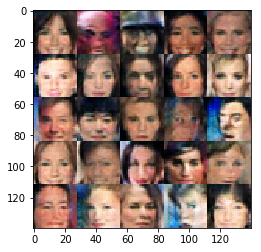

Epoch 1/1 Step 16410... Discriminator Loss: 1.3029... Generator Loss: 0.7916
Epoch 1/1 Step 16420... Discriminator Loss: 1.3871... Generator Loss: 0.8711
Epoch 1/1 Step 16430... Discriminator Loss: 1.2792... Generator Loss: 0.8668
Epoch 1/1 Step 16440... Discriminator Loss: 1.5301... Generator Loss: 0.6014
Epoch 1/1 Step 16450... Discriminator Loss: 1.4203... Generator Loss: 0.7676
Epoch 1/1 Step 16460... Discriminator Loss: 1.2675... Generator Loss: 0.7394
Epoch 1/1 Step 16470... Discriminator Loss: 1.3678... Generator Loss: 0.7089
Epoch 1/1 Step 16480... Discriminator Loss: 1.4197... Generator Loss: 0.7280
Epoch 1/1 Step 16490... Discriminator Loss: 1.1894... Generator Loss: 0.8737
Epoch 1/1 Step 16500... Discriminator Loss: 1.3652... Generator Loss: 0.7674


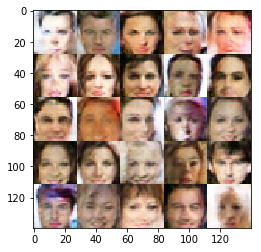

Epoch 1/1 Step 16510... Discriminator Loss: 1.3210... Generator Loss: 0.7305
Epoch 1/1 Step 16520... Discriminator Loss: 1.2733... Generator Loss: 0.8336
Epoch 1/1 Step 16530... Discriminator Loss: 1.3068... Generator Loss: 0.8000
Epoch 1/1 Step 16540... Discriminator Loss: 1.4349... Generator Loss: 0.7145
Epoch 1/1 Step 16550... Discriminator Loss: 1.2225... Generator Loss: 0.8008
Epoch 1/1 Step 16560... Discriminator Loss: 1.3928... Generator Loss: 0.6797
Epoch 1/1 Step 16570... Discriminator Loss: 1.4569... Generator Loss: 0.6202
Epoch 1/1 Step 16580... Discriminator Loss: 1.3352... Generator Loss: 0.7912
Epoch 1/1 Step 16590... Discriminator Loss: 1.7243... Generator Loss: 0.6420
Epoch 1/1 Step 16600... Discriminator Loss: 1.3376... Generator Loss: 0.7688


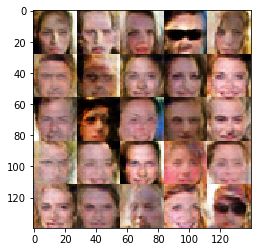

Epoch 1/1 Step 16610... Discriminator Loss: 1.3363... Generator Loss: 0.7354
Epoch 1/1 Step 16620... Discriminator Loss: 1.4254... Generator Loss: 0.7390
Epoch 1/1 Step 16630... Discriminator Loss: 1.3093... Generator Loss: 0.8577
Epoch 1/1 Step 16640... Discriminator Loss: 1.3434... Generator Loss: 0.7866
Epoch 1/1 Step 16650... Discriminator Loss: 1.3836... Generator Loss: 0.6862
Epoch 1/1 Step 16660... Discriminator Loss: 1.3205... Generator Loss: 0.7356
Epoch 1/1 Step 16670... Discriminator Loss: 1.3608... Generator Loss: 0.8272
Epoch 1/1 Step 16680... Discriminator Loss: 1.3387... Generator Loss: 0.8362
Epoch 1/1 Step 16690... Discriminator Loss: 1.2080... Generator Loss: 0.9322
Epoch 1/1 Step 16700... Discriminator Loss: 1.5203... Generator Loss: 0.7014


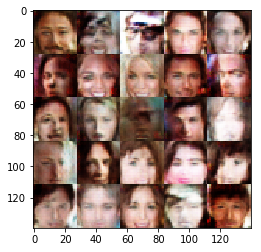

Epoch 1/1 Step 16710... Discriminator Loss: 1.3375... Generator Loss: 0.7729
Epoch 1/1 Step 16720... Discriminator Loss: 1.3626... Generator Loss: 0.6867
Epoch 1/1 Step 16730... Discriminator Loss: 1.3153... Generator Loss: 0.7473
Epoch 1/1 Step 16740... Discriminator Loss: 1.2352... Generator Loss: 0.8547
Epoch 1/1 Step 16750... Discriminator Loss: 1.4536... Generator Loss: 0.7185
Epoch 1/1 Step 16760... Discriminator Loss: 1.3563... Generator Loss: 0.8065
Epoch 1/1 Step 16770... Discriminator Loss: 1.4511... Generator Loss: 0.7140
Epoch 1/1 Step 16780... Discriminator Loss: 1.4069... Generator Loss: 0.6937
Epoch 1/1 Step 16790... Discriminator Loss: 1.3576... Generator Loss: 0.7640
Epoch 1/1 Step 16800... Discriminator Loss: 1.3932... Generator Loss: 0.7532


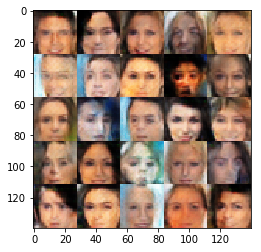

Epoch 1/1 Step 16810... Discriminator Loss: 1.3102... Generator Loss: 0.8282
Epoch 1/1 Step 16820... Discriminator Loss: 1.1605... Generator Loss: 0.9253
Epoch 1/1 Step 16830... Discriminator Loss: 1.2905... Generator Loss: 0.8119
Epoch 1/1 Step 16840... Discriminator Loss: 1.3147... Generator Loss: 0.7695
Epoch 1/1 Step 16850... Discriminator Loss: 1.5615... Generator Loss: 0.6775
Epoch 1/1 Step 16860... Discriminator Loss: 1.4150... Generator Loss: 0.7099
Epoch 1/1 Step 16870... Discriminator Loss: 1.3117... Generator Loss: 0.7739
Epoch 1/1 Step 16880... Discriminator Loss: 1.4645... Generator Loss: 0.6995
Epoch 1/1 Step 16890... Discriminator Loss: 1.3768... Generator Loss: 0.7829
Epoch 1/1 Step 16900... Discriminator Loss: 1.3390... Generator Loss: 0.7471


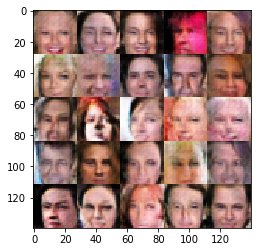

Epoch 1/1 Step 16910... Discriminator Loss: 1.3846... Generator Loss: 0.7891
Epoch 1/1 Step 16920... Discriminator Loss: 1.3392... Generator Loss: 0.8137
Epoch 1/1 Step 16930... Discriminator Loss: 1.3217... Generator Loss: 0.7217
Epoch 1/1 Step 16940... Discriminator Loss: 1.4552... Generator Loss: 0.7227
Epoch 1/1 Step 16950... Discriminator Loss: 1.3531... Generator Loss: 0.7458
Epoch 1/1 Step 16960... Discriminator Loss: 1.4069... Generator Loss: 0.7003
Epoch 1/1 Step 16970... Discriminator Loss: 1.2878... Generator Loss: 0.8200
Epoch 1/1 Step 16980... Discriminator Loss: 1.4752... Generator Loss: 0.7204
Epoch 1/1 Step 16990... Discriminator Loss: 1.4129... Generator Loss: 0.7030
Epoch 1/1 Step 17000... Discriminator Loss: 1.2742... Generator Loss: 0.8217


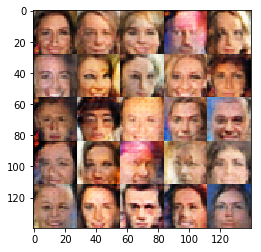

Epoch 1/1 Step 17010... Discriminator Loss: 1.4124... Generator Loss: 0.7745
Epoch 1/1 Step 17020... Discriminator Loss: 1.3299... Generator Loss: 0.7375
Epoch 1/1 Step 17030... Discriminator Loss: 1.4414... Generator Loss: 0.7443
Epoch 1/1 Step 17040... Discriminator Loss: 1.4259... Generator Loss: 0.7448
Epoch 1/1 Step 17050... Discriminator Loss: 1.4031... Generator Loss: 0.7067
Epoch 1/1 Step 17060... Discriminator Loss: 1.3340... Generator Loss: 0.7413
Epoch 1/1 Step 17070... Discriminator Loss: 1.3949... Generator Loss: 0.7270
Epoch 1/1 Step 17080... Discriminator Loss: 1.3874... Generator Loss: 0.7337
Epoch 1/1 Step 17090... Discriminator Loss: 1.2827... Generator Loss: 0.7479
Epoch 1/1 Step 17100... Discriminator Loss: 1.3196... Generator Loss: 0.8551


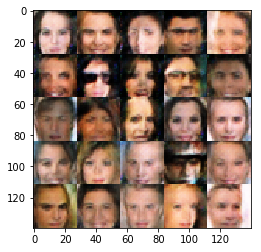

Epoch 1/1 Step 17110... Discriminator Loss: 1.3821... Generator Loss: 0.6927
Epoch 1/1 Step 17120... Discriminator Loss: 1.4059... Generator Loss: 0.7152
Epoch 1/1 Step 17130... Discriminator Loss: 1.3028... Generator Loss: 0.7972
Epoch 1/1 Step 17140... Discriminator Loss: 1.3936... Generator Loss: 0.7530
Epoch 1/1 Step 17150... Discriminator Loss: 1.3387... Generator Loss: 0.8055
Epoch 1/1 Step 17160... Discriminator Loss: 1.3740... Generator Loss: 0.8014
Epoch 1/1 Step 17170... Discriminator Loss: 1.3905... Generator Loss: 0.7517
Epoch 1/1 Step 17180... Discriminator Loss: 1.4308... Generator Loss: 0.7720
Epoch 1/1 Step 17190... Discriminator Loss: 1.3752... Generator Loss: 0.8369
Epoch 1/1 Step 17200... Discriminator Loss: 1.4150... Generator Loss: 0.7182


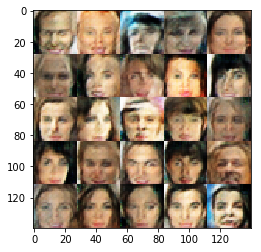

Epoch 1/1 Step 17210... Discriminator Loss: 1.2784... Generator Loss: 0.8806
Epoch 1/1 Step 17220... Discriminator Loss: 1.3640... Generator Loss: 0.7781
Epoch 1/1 Step 17230... Discriminator Loss: 1.3746... Generator Loss: 0.7284
Epoch 1/1 Step 17240... Discriminator Loss: 1.4240... Generator Loss: 0.7263
Epoch 1/1 Step 17250... Discriminator Loss: 1.3481... Generator Loss: 0.7829
Epoch 1/1 Step 17260... Discriminator Loss: 1.2925... Generator Loss: 0.7972
Epoch 1/1 Step 17270... Discriminator Loss: 1.3714... Generator Loss: 0.8186
Epoch 1/1 Step 17280... Discriminator Loss: 1.4344... Generator Loss: 0.7205
Epoch 1/1 Step 17290... Discriminator Loss: 1.3488... Generator Loss: 0.7882
Epoch 1/1 Step 17300... Discriminator Loss: 1.2698... Generator Loss: 0.8536


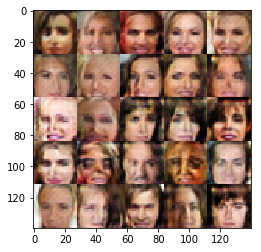

Epoch 1/1 Step 17310... Discriminator Loss: 1.3561... Generator Loss: 0.7155
Epoch 1/1 Step 17320... Discriminator Loss: 1.3026... Generator Loss: 0.7955
Epoch 1/1 Step 17330... Discriminator Loss: 1.3278... Generator Loss: 0.8203
Epoch 1/1 Step 17340... Discriminator Loss: 1.3376... Generator Loss: 0.8012
Epoch 1/1 Step 17350... Discriminator Loss: 1.3688... Generator Loss: 0.7441
Epoch 1/1 Step 17360... Discriminator Loss: 1.3091... Generator Loss: 0.8292
Epoch 1/1 Step 17370... Discriminator Loss: 1.3500... Generator Loss: 0.7791
Epoch 1/1 Step 17380... Discriminator Loss: 1.3458... Generator Loss: 0.7610
Epoch 1/1 Step 17390... Discriminator Loss: 1.2795... Generator Loss: 0.8248
Epoch 1/1 Step 17400... Discriminator Loss: 1.2669... Generator Loss: 0.8354


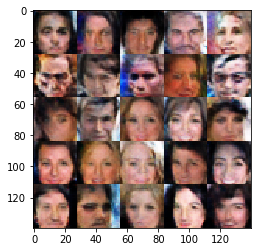

Epoch 1/1 Step 17410... Discriminator Loss: 1.4089... Generator Loss: 0.7739
Epoch 1/1 Step 17420... Discriminator Loss: 1.3808... Generator Loss: 0.7164
Epoch 1/1 Step 17430... Discriminator Loss: 1.2867... Generator Loss: 0.8280
Epoch 1/1 Step 17440... Discriminator Loss: 1.4185... Generator Loss: 0.7758
Epoch 1/1 Step 17450... Discriminator Loss: 1.1857... Generator Loss: 0.9039
Epoch 1/1 Step 17460... Discriminator Loss: 1.4689... Generator Loss: 0.6444
Epoch 1/1 Step 17470... Discriminator Loss: 1.2766... Generator Loss: 0.8602
Epoch 1/1 Step 17480... Discriminator Loss: 1.3024... Generator Loss: 0.7531
Epoch 1/1 Step 17490... Discriminator Loss: 1.4412... Generator Loss: 0.7252
Epoch 1/1 Step 17500... Discriminator Loss: 1.2575... Generator Loss: 0.8130


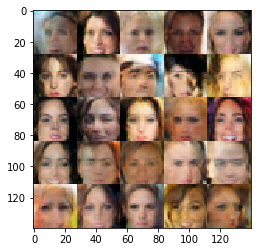

Epoch 1/1 Step 17510... Discriminator Loss: 1.6544... Generator Loss: 0.6366
Epoch 1/1 Step 17520... Discriminator Loss: 1.3055... Generator Loss: 0.7975
Epoch 1/1 Step 17530... Discriminator Loss: 1.3312... Generator Loss: 0.8602
Epoch 1/1 Step 17540... Discriminator Loss: 1.3786... Generator Loss: 0.7495
Epoch 1/1 Step 17550... Discriminator Loss: 1.3487... Generator Loss: 0.8062
Epoch 1/1 Step 17560... Discriminator Loss: 1.3727... Generator Loss: 0.6835
Epoch 1/1 Step 17570... Discriminator Loss: 1.4817... Generator Loss: 0.6704
Epoch 1/1 Step 17580... Discriminator Loss: 1.4190... Generator Loss: 0.7302
Epoch 1/1 Step 17590... Discriminator Loss: 1.2953... Generator Loss: 0.8595
Epoch 1/1 Step 17600... Discriminator Loss: 1.2572... Generator Loss: 0.9285


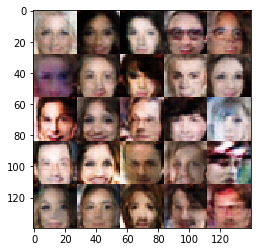

Epoch 1/1 Step 17610... Discriminator Loss: 1.4611... Generator Loss: 0.6405
Epoch 1/1 Step 17620... Discriminator Loss: 1.4762... Generator Loss: 0.7560
Epoch 1/1 Step 17630... Discriminator Loss: 1.4248... Generator Loss: 0.6944
Epoch 1/1 Step 17640... Discriminator Loss: 1.4871... Generator Loss: 0.6837
Epoch 1/1 Step 17650... Discriminator Loss: 1.4351... Generator Loss: 0.7056
Epoch 1/1 Step 17660... Discriminator Loss: 1.3779... Generator Loss: 0.7915
Epoch 1/1 Step 17670... Discriminator Loss: 1.4375... Generator Loss: 0.6766
Epoch 1/1 Step 17680... Discriminator Loss: 1.4213... Generator Loss: 0.6736
Epoch 1/1 Step 17690... Discriminator Loss: 1.3195... Generator Loss: 0.8316
Epoch 1/1 Step 17700... Discriminator Loss: 1.3461... Generator Loss: 0.8265


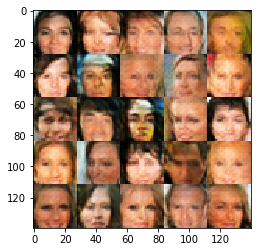

Epoch 1/1 Step 17710... Discriminator Loss: 1.4331... Generator Loss: 0.7260
Epoch 1/1 Step 17720... Discriminator Loss: 1.3886... Generator Loss: 0.7168
Epoch 1/1 Step 17730... Discriminator Loss: 1.3594... Generator Loss: 0.7446
Epoch 1/1 Step 17740... Discriminator Loss: 1.3098... Generator Loss: 0.7772
Epoch 1/1 Step 17750... Discriminator Loss: 1.3264... Generator Loss: 0.7735
Epoch 1/1 Step 17760... Discriminator Loss: 1.4175... Generator Loss: 0.7013
Epoch 1/1 Step 17770... Discriminator Loss: 1.3506... Generator Loss: 0.8103
Epoch 1/1 Step 17780... Discriminator Loss: 1.3064... Generator Loss: 0.8288
Epoch 1/1 Step 17790... Discriminator Loss: 1.2642... Generator Loss: 0.8380
Epoch 1/1 Step 17800... Discriminator Loss: 1.3882... Generator Loss: 0.7653


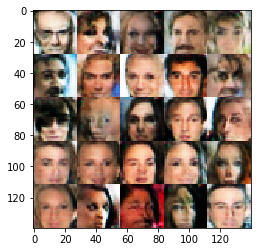

Epoch 1/1 Step 17810... Discriminator Loss: 1.2532... Generator Loss: 0.7570
Epoch 1/1 Step 17820... Discriminator Loss: 1.3539... Generator Loss: 0.8220
Epoch 1/1 Step 17830... Discriminator Loss: 1.2690... Generator Loss: 0.8986
Epoch 1/1 Step 17840... Discriminator Loss: 1.3673... Generator Loss: 0.7478
Epoch 1/1 Step 17850... Discriminator Loss: 1.4581... Generator Loss: 0.7208
Epoch 1/1 Step 17860... Discriminator Loss: 1.3292... Generator Loss: 0.7765
Epoch 1/1 Step 17870... Discriminator Loss: 1.2848... Generator Loss: 0.7775
Epoch 1/1 Step 17880... Discriminator Loss: 1.4074... Generator Loss: 0.6942
Epoch 1/1 Step 17890... Discriminator Loss: 1.4367... Generator Loss: 0.7124
Epoch 1/1 Step 17900... Discriminator Loss: 1.3937... Generator Loss: 0.8295


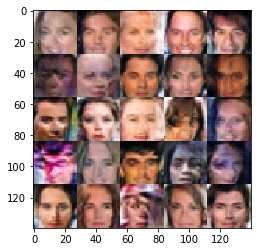

Epoch 1/1 Step 17910... Discriminator Loss: 1.4685... Generator Loss: 0.6794
Epoch 1/1 Step 17920... Discriminator Loss: 1.3753... Generator Loss: 0.8004
Epoch 1/1 Step 17930... Discriminator Loss: 1.4276... Generator Loss: 0.7553
Epoch 1/1 Step 17940... Discriminator Loss: 1.3381... Generator Loss: 0.8112
Epoch 1/1 Step 17950... Discriminator Loss: 1.3797... Generator Loss: 0.7906
Epoch 1/1 Step 17960... Discriminator Loss: 1.3475... Generator Loss: 0.7654
Epoch 1/1 Step 17970... Discriminator Loss: 1.3220... Generator Loss: 0.8040
Epoch 1/1 Step 17980... Discriminator Loss: 1.3165... Generator Loss: 0.7967
Epoch 1/1 Step 17990... Discriminator Loss: 1.3314... Generator Loss: 0.7621
Epoch 1/1 Step 18000... Discriminator Loss: 1.3137... Generator Loss: 0.7804


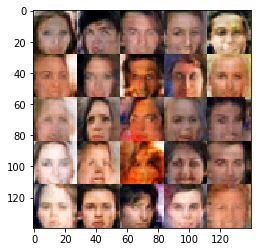

Epoch 1/1 Step 18010... Discriminator Loss: 1.4033... Generator Loss: 0.6912
Epoch 1/1 Step 18020... Discriminator Loss: 1.3921... Generator Loss: 0.7390
Epoch 1/1 Step 18030... Discriminator Loss: 1.5029... Generator Loss: 0.7337
Epoch 1/1 Step 18040... Discriminator Loss: 1.3896... Generator Loss: 0.7175
Epoch 1/1 Step 18050... Discriminator Loss: 1.3756... Generator Loss: 0.7984
Epoch 1/1 Step 18060... Discriminator Loss: 1.4532... Generator Loss: 0.6923
Epoch 1/1 Step 18070... Discriminator Loss: 1.3928... Generator Loss: 0.7341
Epoch 1/1 Step 18080... Discriminator Loss: 1.3332... Generator Loss: 0.7981
Epoch 1/1 Step 18090... Discriminator Loss: 1.3255... Generator Loss: 0.7519
Epoch 1/1 Step 18100... Discriminator Loss: 1.2880... Generator Loss: 0.8150


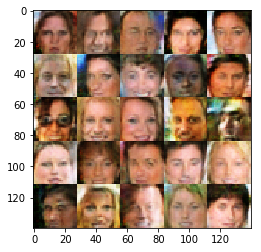

Epoch 1/1 Step 18110... Discriminator Loss: 1.3666... Generator Loss: 0.7060
Epoch 1/1 Step 18120... Discriminator Loss: 1.4016... Generator Loss: 0.7611
Epoch 1/1 Step 18130... Discriminator Loss: 1.3265... Generator Loss: 0.8524
Epoch 1/1 Step 18140... Discriminator Loss: 1.3581... Generator Loss: 0.7190
Epoch 1/1 Step 18150... Discriminator Loss: 1.2848... Generator Loss: 0.9201
Epoch 1/1 Step 18160... Discriminator Loss: 1.4089... Generator Loss: 0.7332
Epoch 1/1 Step 18170... Discriminator Loss: 1.2980... Generator Loss: 0.7549
Epoch 1/1 Step 18180... Discriminator Loss: 1.2968... Generator Loss: 0.7734
Epoch 1/1 Step 18190... Discriminator Loss: 1.3207... Generator Loss: 0.8198
Epoch 1/1 Step 18200... Discriminator Loss: 1.5336... Generator Loss: 0.6198


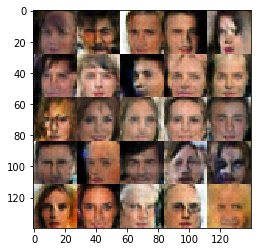

Epoch 1/1 Step 18210... Discriminator Loss: 1.3614... Generator Loss: 0.8073
Epoch 1/1 Step 18220... Discriminator Loss: 1.2351... Generator Loss: 0.7900
Epoch 1/1 Step 18230... Discriminator Loss: 1.3719... Generator Loss: 0.7677
Epoch 1/1 Step 18240... Discriminator Loss: 1.3036... Generator Loss: 0.7725
Epoch 1/1 Step 18250... Discriminator Loss: 1.3649... Generator Loss: 0.7856
Epoch 1/1 Step 18260... Discriminator Loss: 1.4447... Generator Loss: 0.7146
Epoch 1/1 Step 18270... Discriminator Loss: 1.2706... Generator Loss: 0.8658
Epoch 1/1 Step 18280... Discriminator Loss: 1.3868... Generator Loss: 0.7765
Epoch 1/1 Step 18290... Discriminator Loss: 1.3371... Generator Loss: 0.7285
Epoch 1/1 Step 18300... Discriminator Loss: 1.2537... Generator Loss: 0.8168


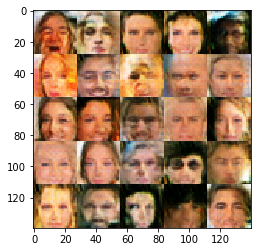

Epoch 1/1 Step 18310... Discriminator Loss: 1.3968... Generator Loss: 0.7951
Epoch 1/1 Step 18320... Discriminator Loss: 1.2687... Generator Loss: 0.8693
Epoch 1/1 Step 18330... Discriminator Loss: 1.2570... Generator Loss: 0.8150
Epoch 1/1 Step 18340... Discriminator Loss: 1.4535... Generator Loss: 0.7175
Epoch 1/1 Step 18350... Discriminator Loss: 1.3191... Generator Loss: 0.7821
Epoch 1/1 Step 18360... Discriminator Loss: 1.3036... Generator Loss: 0.8481
Epoch 1/1 Step 18370... Discriminator Loss: 1.4172... Generator Loss: 0.6830
Epoch 1/1 Step 18380... Discriminator Loss: 1.3609... Generator Loss: 0.8271
Epoch 1/1 Step 18390... Discriminator Loss: 1.3336... Generator Loss: 0.8409
Epoch 1/1 Step 18400... Discriminator Loss: 1.3254... Generator Loss: 0.8248


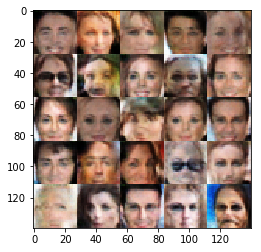

Epoch 1/1 Step 18410... Discriminator Loss: 1.4422... Generator Loss: 0.7791
Epoch 1/1 Step 18420... Discriminator Loss: 1.2556... Generator Loss: 0.9228
Epoch 1/1 Step 18430... Discriminator Loss: 1.5246... Generator Loss: 0.6822
Epoch 1/1 Step 18440... Discriminator Loss: 1.3159... Generator Loss: 0.8227
Epoch 1/1 Step 18450... Discriminator Loss: 1.3432... Generator Loss: 0.7706
Epoch 1/1 Step 18460... Discriminator Loss: 1.4102... Generator Loss: 0.7964
Epoch 1/1 Step 18470... Discriminator Loss: 1.4746... Generator Loss: 0.7840
Epoch 1/1 Step 18480... Discriminator Loss: 1.3504... Generator Loss: 0.7849
Epoch 1/1 Step 18490... Discriminator Loss: 1.3910... Generator Loss: 0.7909
Epoch 1/1 Step 18500... Discriminator Loss: 1.3243... Generator Loss: 0.7431


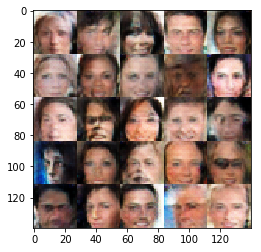

Epoch 1/1 Step 18510... Discriminator Loss: 1.4489... Generator Loss: 0.7185
Epoch 1/1 Step 18520... Discriminator Loss: 1.3808... Generator Loss: 0.8181
Epoch 1/1 Step 18530... Discriminator Loss: 1.4142... Generator Loss: 0.7301
Epoch 1/1 Step 18540... Discriminator Loss: 1.2473... Generator Loss: 0.7980
Epoch 1/1 Step 18550... Discriminator Loss: 1.3913... Generator Loss: 0.8100
Epoch 1/1 Step 18560... Discriminator Loss: 1.3580... Generator Loss: 0.8184
Epoch 1/1 Step 18570... Discriminator Loss: 1.2482... Generator Loss: 0.8771
Epoch 1/1 Step 18580... Discriminator Loss: 1.3307... Generator Loss: 0.7840
Epoch 1/1 Step 18590... Discriminator Loss: 1.3750... Generator Loss: 0.7111
Epoch 1/1 Step 18600... Discriminator Loss: 1.2666... Generator Loss: 0.8085


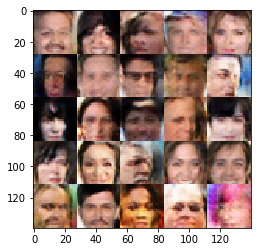

Epoch 1/1 Step 18610... Discriminator Loss: 1.3718... Generator Loss: 0.7407
Epoch 1/1 Step 18620... Discriminator Loss: 1.4346... Generator Loss: 0.6933
Epoch 1/1 Step 18630... Discriminator Loss: 1.3834... Generator Loss: 0.6901
Epoch 1/1 Step 18640... Discriminator Loss: 1.4783... Generator Loss: 0.6726
Epoch 1/1 Step 18650... Discriminator Loss: 1.4452... Generator Loss: 0.7162
Epoch 1/1 Step 18660... Discriminator Loss: 1.3719... Generator Loss: 0.7896
Epoch 1/1 Step 18670... Discriminator Loss: 1.3220... Generator Loss: 0.8334
Epoch 1/1 Step 18680... Discriminator Loss: 1.3133... Generator Loss: 0.8590
Epoch 1/1 Step 18690... Discriminator Loss: 1.4002... Generator Loss: 0.7570
Epoch 1/1 Step 18700... Discriminator Loss: 1.3773... Generator Loss: 0.7066


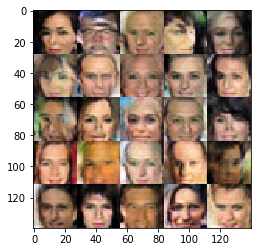

Epoch 1/1 Step 18710... Discriminator Loss: 1.3738... Generator Loss: 0.7612
Epoch 1/1 Step 18720... Discriminator Loss: 1.4168... Generator Loss: 0.7373
Epoch 1/1 Step 18730... Discriminator Loss: 1.2671... Generator Loss: 0.8527
Epoch 1/1 Step 18740... Discriminator Loss: 1.4433... Generator Loss: 0.8585
Epoch 1/1 Step 18750... Discriminator Loss: 1.2355... Generator Loss: 0.9162
Epoch 1/1 Step 18760... Discriminator Loss: 1.3967... Generator Loss: 0.7488
Epoch 1/1 Step 18770... Discriminator Loss: 1.3443... Generator Loss: 0.7748
Epoch 1/1 Step 18780... Discriminator Loss: 1.4158... Generator Loss: 0.7203
Epoch 1/1 Step 18790... Discriminator Loss: 1.3762... Generator Loss: 0.7856
Epoch 1/1 Step 18800... Discriminator Loss: 1.3299... Generator Loss: 0.7523


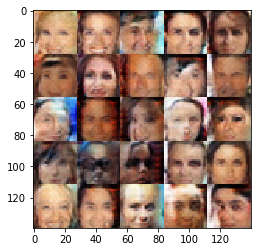

Epoch 1/1 Step 18810... Discriminator Loss: 1.3548... Generator Loss: 0.8282
Epoch 1/1 Step 18820... Discriminator Loss: 1.3942... Generator Loss: 0.7276
Epoch 1/1 Step 18830... Discriminator Loss: 1.3613... Generator Loss: 0.7220
Epoch 1/1 Step 18840... Discriminator Loss: 1.4413... Generator Loss: 0.6811
Epoch 1/1 Step 18850... Discriminator Loss: 1.2521... Generator Loss: 0.8641
Epoch 1/1 Step 18860... Discriminator Loss: 1.2416... Generator Loss: 0.7896
Epoch 1/1 Step 18870... Discriminator Loss: 1.4037... Generator Loss: 0.7784
Epoch 1/1 Step 18880... Discriminator Loss: 1.3137... Generator Loss: 0.7827
Epoch 1/1 Step 18890... Discriminator Loss: 1.3891... Generator Loss: 0.7497
Epoch 1/1 Step 18900... Discriminator Loss: 1.3070... Generator Loss: 0.7822


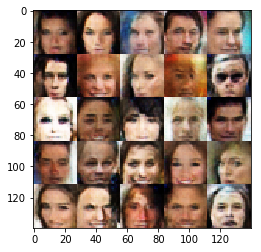

Epoch 1/1 Step 18910... Discriminator Loss: 1.3573... Generator Loss: 0.7929
Epoch 1/1 Step 18920... Discriminator Loss: 1.2211... Generator Loss: 0.9427
Epoch 1/1 Step 18930... Discriminator Loss: 1.4173... Generator Loss: 0.7440
Epoch 1/1 Step 18940... Discriminator Loss: 1.5691... Generator Loss: 0.6095
Epoch 1/1 Step 18950... Discriminator Loss: 1.3582... Generator Loss: 0.7549
Epoch 1/1 Step 18960... Discriminator Loss: 1.3739... Generator Loss: 0.7819
Epoch 1/1 Step 18970... Discriminator Loss: 1.3689... Generator Loss: 0.7240
Epoch 1/1 Step 18980... Discriminator Loss: 1.3761... Generator Loss: 0.7601
Epoch 1/1 Step 18990... Discriminator Loss: 1.3141... Generator Loss: 0.8213
Epoch 1/1 Step 19000... Discriminator Loss: 1.4117... Generator Loss: 0.7862


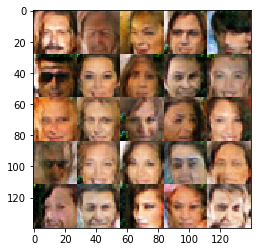

Epoch 1/1 Step 19010... Discriminator Loss: 1.4284... Generator Loss: 0.6968
Epoch 1/1 Step 19020... Discriminator Loss: 1.3157... Generator Loss: 0.7892
Epoch 1/1 Step 19030... Discriminator Loss: 1.3886... Generator Loss: 0.7935
Epoch 1/1 Step 19040... Discriminator Loss: 1.3482... Generator Loss: 0.8186
Epoch 1/1 Step 19050... Discriminator Loss: 1.2602... Generator Loss: 0.8122
Epoch 1/1 Step 19060... Discriminator Loss: 1.4362... Generator Loss: 0.6410
Epoch 1/1 Step 19070... Discriminator Loss: 1.4804... Generator Loss: 0.6917
Epoch 1/1 Step 19080... Discriminator Loss: 1.3425... Generator Loss: 0.7668
Epoch 1/1 Step 19090... Discriminator Loss: 1.3904... Generator Loss: 0.7412
Epoch 1/1 Step 19100... Discriminator Loss: 1.4459... Generator Loss: 0.7529


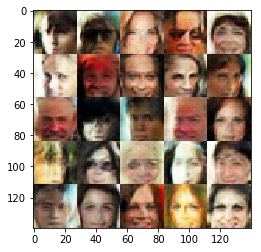

Epoch 1/1 Step 19110... Discriminator Loss: 1.3188... Generator Loss: 0.7866
Epoch 1/1 Step 19120... Discriminator Loss: 1.3614... Generator Loss: 0.7782
Epoch 1/1 Step 19130... Discriminator Loss: 1.2961... Generator Loss: 0.8517
Epoch 1/1 Step 19140... Discriminator Loss: 1.3132... Generator Loss: 0.7420
Epoch 1/1 Step 19150... Discriminator Loss: 1.2947... Generator Loss: 0.7731
Epoch 1/1 Step 19160... Discriminator Loss: 1.3651... Generator Loss: 0.7492
Epoch 1/1 Step 19170... Discriminator Loss: 1.3310... Generator Loss: 0.7916
Epoch 1/1 Step 19180... Discriminator Loss: 1.3921... Generator Loss: 0.8000
Epoch 1/1 Step 19190... Discriminator Loss: 1.2870... Generator Loss: 0.8279
Epoch 1/1 Step 19200... Discriminator Loss: 1.4041... Generator Loss: 0.7294


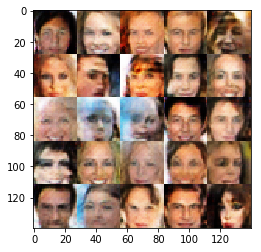

Epoch 1/1 Step 19210... Discriminator Loss: 1.3318... Generator Loss: 0.8264
Epoch 1/1 Step 19220... Discriminator Loss: 1.2120... Generator Loss: 0.8201
Epoch 1/1 Step 19230... Discriminator Loss: 1.5214... Generator Loss: 0.6695
Epoch 1/1 Step 19240... Discriminator Loss: 1.2838... Generator Loss: 0.7773
Epoch 1/1 Step 19250... Discriminator Loss: 1.3944... Generator Loss: 0.7625
Epoch 1/1 Step 19260... Discriminator Loss: 1.2537... Generator Loss: 0.8220
Epoch 1/1 Step 19270... Discriminator Loss: 1.2955... Generator Loss: 0.8628
Epoch 1/1 Step 19280... Discriminator Loss: 1.5424... Generator Loss: 0.6222
Epoch 1/1 Step 19290... Discriminator Loss: 1.3327... Generator Loss: 0.8565
Epoch 1/1 Step 19300... Discriminator Loss: 1.3200... Generator Loss: 0.7884


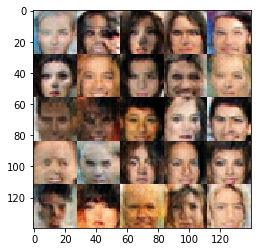

Epoch 1/1 Step 19310... Discriminator Loss: 1.4770... Generator Loss: 0.6306
Epoch 1/1 Step 19320... Discriminator Loss: 1.4099... Generator Loss: 0.7883
Epoch 1/1 Step 19330... Discriminator Loss: 1.3733... Generator Loss: 0.7503
Epoch 1/1 Step 19340... Discriminator Loss: 1.3204... Generator Loss: 0.7703
Epoch 1/1 Step 19350... Discriminator Loss: 1.4646... Generator Loss: 0.7123
Epoch 1/1 Step 19360... Discriminator Loss: 1.3672... Generator Loss: 0.8718
Epoch 1/1 Step 19370... Discriminator Loss: 1.3039... Generator Loss: 0.7995
Epoch 1/1 Step 19380... Discriminator Loss: 1.3860... Generator Loss: 0.8369
Epoch 1/1 Step 19390... Discriminator Loss: 1.4432... Generator Loss: 0.6666
Epoch 1/1 Step 19400... Discriminator Loss: 1.3905... Generator Loss: 0.7289


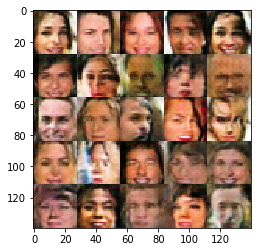

Epoch 1/1 Step 19410... Discriminator Loss: 1.3809... Generator Loss: 0.7496
Epoch 1/1 Step 19420... Discriminator Loss: 1.3359... Generator Loss: 0.7843
Epoch 1/1 Step 19430... Discriminator Loss: 1.2992... Generator Loss: 0.7720
Epoch 1/1 Step 19440... Discriminator Loss: 1.3644... Generator Loss: 0.7604
Epoch 1/1 Step 19450... Discriminator Loss: 1.4254... Generator Loss: 0.7648
Epoch 1/1 Step 19460... Discriminator Loss: 1.3682... Generator Loss: 0.7751
Epoch 1/1 Step 19470... Discriminator Loss: 1.2946... Generator Loss: 0.7702
Epoch 1/1 Step 19480... Discriminator Loss: 1.2452... Generator Loss: 0.8816
Epoch 1/1 Step 19490... Discriminator Loss: 1.4636... Generator Loss: 0.6428
Epoch 1/1 Step 19500... Discriminator Loss: 1.4649... Generator Loss: 0.6738


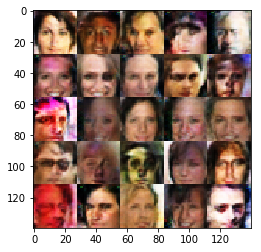

Epoch 1/1 Step 19510... Discriminator Loss: 1.3911... Generator Loss: 0.7580
Epoch 1/1 Step 19520... Discriminator Loss: 1.4506... Generator Loss: 0.7821
Epoch 1/1 Step 19530... Discriminator Loss: 1.3533... Generator Loss: 0.7731
Epoch 1/1 Step 19540... Discriminator Loss: 1.2717... Generator Loss: 0.8572
Epoch 1/1 Step 19550... Discriminator Loss: 1.3132... Generator Loss: 0.8049
Epoch 1/1 Step 19560... Discriminator Loss: 1.4317... Generator Loss: 0.6908
Epoch 1/1 Step 19570... Discriminator Loss: 1.3624... Generator Loss: 0.7141
Epoch 1/1 Step 19580... Discriminator Loss: 1.4245... Generator Loss: 0.6925
Epoch 1/1 Step 19590... Discriminator Loss: 1.3987... Generator Loss: 0.7253
Epoch 1/1 Step 19600... Discriminator Loss: 1.3673... Generator Loss: 0.7273


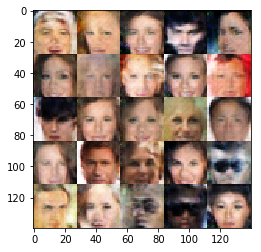

Epoch 1/1 Step 19610... Discriminator Loss: 1.3711... Generator Loss: 0.7076
Epoch 1/1 Step 19620... Discriminator Loss: 1.3520... Generator Loss: 0.7997
Epoch 1/1 Step 19630... Discriminator Loss: 1.4231... Generator Loss: 0.7962
Epoch 1/1 Step 19640... Discriminator Loss: 1.2374... Generator Loss: 0.9178
Epoch 1/1 Step 19650... Discriminator Loss: 1.3311... Generator Loss: 0.7552
Epoch 1/1 Step 19660... Discriminator Loss: 1.4574... Generator Loss: 0.6622
Epoch 1/1 Step 19670... Discriminator Loss: 1.3103... Generator Loss: 0.8070
Epoch 1/1 Step 19680... Discriminator Loss: 1.3141... Generator Loss: 0.8178
Epoch 1/1 Step 19690... Discriminator Loss: 1.5243... Generator Loss: 0.6882
Epoch 1/1 Step 19700... Discriminator Loss: 1.2869... Generator Loss: 0.9020


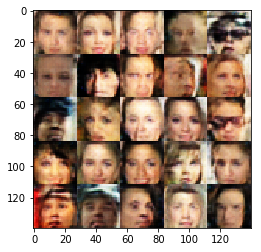

Epoch 1/1 Step 19710... Discriminator Loss: 1.4577... Generator Loss: 0.6822
Epoch 1/1 Step 19720... Discriminator Loss: 1.4871... Generator Loss: 0.6246
Epoch 1/1 Step 19730... Discriminator Loss: 1.4067... Generator Loss: 0.7842
Epoch 1/1 Step 19740... Discriminator Loss: 1.3686... Generator Loss: 0.6984
Epoch 1/1 Step 19750... Discriminator Loss: 1.4683... Generator Loss: 0.6700
Epoch 1/1 Step 19760... Discriminator Loss: 1.2765... Generator Loss: 0.7996
Epoch 1/1 Step 19770... Discriminator Loss: 1.3631... Generator Loss: 0.7278
Epoch 1/1 Step 19780... Discriminator Loss: 1.3314... Generator Loss: 0.7764
Epoch 1/1 Step 19790... Discriminator Loss: 1.3222... Generator Loss: 0.8044
Epoch 1/1 Step 19800... Discriminator Loss: 1.3074... Generator Loss: 0.8614


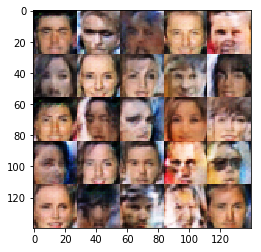

Epoch 1/1 Step 19810... Discriminator Loss: 1.3615... Generator Loss: 0.8176
Epoch 1/1 Step 19820... Discriminator Loss: 1.3294... Generator Loss: 0.7734
Epoch 1/1 Step 19830... Discriminator Loss: 1.3670... Generator Loss: 0.7969
Epoch 1/1 Step 19840... Discriminator Loss: 1.3866... Generator Loss: 0.7381
Epoch 1/1 Step 19850... Discriminator Loss: 1.4771... Generator Loss: 0.7651
Epoch 1/1 Step 19860... Discriminator Loss: 1.3554... Generator Loss: 0.8122
Epoch 1/1 Step 19870... Discriminator Loss: 1.1970... Generator Loss: 0.9388
Epoch 1/1 Step 19880... Discriminator Loss: 1.4613... Generator Loss: 0.7285
Epoch 1/1 Step 19890... Discriminator Loss: 1.3692... Generator Loss: 0.7234
Epoch 1/1 Step 19900... Discriminator Loss: 1.2273... Generator Loss: 0.9121


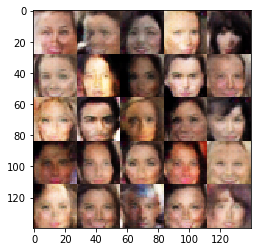

Epoch 1/1 Step 19910... Discriminator Loss: 1.3649... Generator Loss: 0.7718
Epoch 1/1 Step 19920... Discriminator Loss: 1.4231... Generator Loss: 0.7464
Epoch 1/1 Step 19930... Discriminator Loss: 1.4868... Generator Loss: 0.6724
Epoch 1/1 Step 19940... Discriminator Loss: 1.2699... Generator Loss: 0.7705
Epoch 1/1 Step 19950... Discriminator Loss: 1.3773... Generator Loss: 0.7040
Epoch 1/1 Step 19960... Discriminator Loss: 1.3870... Generator Loss: 0.7494
Epoch 1/1 Step 19970... Discriminator Loss: 1.4373... Generator Loss: 0.7505
Epoch 1/1 Step 19980... Discriminator Loss: 1.3597... Generator Loss: 0.7651
Epoch 1/1 Step 19990... Discriminator Loss: 1.4292... Generator Loss: 0.7472
Epoch 1/1 Step 20000... Discriminator Loss: 1.3267... Generator Loss: 0.8280


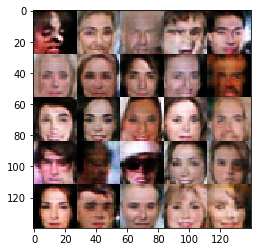

Epoch 1/1 Step 20010... Discriminator Loss: 1.2848... Generator Loss: 0.8037
Epoch 1/1 Step 20020... Discriminator Loss: 1.4640... Generator Loss: 0.6560
Epoch 1/1 Step 20030... Discriminator Loss: 1.3703... Generator Loss: 0.7315
Epoch 1/1 Step 20040... Discriminator Loss: 1.3563... Generator Loss: 0.7952
Epoch 1/1 Step 20050... Discriminator Loss: 1.3063... Generator Loss: 0.7512
Epoch 1/1 Step 20060... Discriminator Loss: 1.4287... Generator Loss: 0.7084
Epoch 1/1 Step 20070... Discriminator Loss: 1.3410... Generator Loss: 0.7518
Epoch 1/1 Step 20080... Discriminator Loss: 1.3335... Generator Loss: 0.8347
Epoch 1/1 Step 20090... Discriminator Loss: 1.2713... Generator Loss: 0.8351
Epoch 1/1 Step 20100... Discriminator Loss: 1.3575... Generator Loss: 0.7571


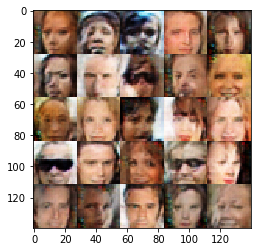

Epoch 1/1 Step 20110... Discriminator Loss: 1.2859... Generator Loss: 0.8300
Epoch 1/1 Step 20120... Discriminator Loss: 1.3680... Generator Loss: 0.7747
Epoch 1/1 Step 20130... Discriminator Loss: 1.4202... Generator Loss: 0.7276
Epoch 1/1 Step 20140... Discriminator Loss: 1.3920... Generator Loss: 0.7438
Epoch 1/1 Step 20150... Discriminator Loss: 1.2644... Generator Loss: 0.7737
Epoch 1/1 Step 20160... Discriminator Loss: 1.2902... Generator Loss: 0.8453
Epoch 1/1 Step 20170... Discriminator Loss: 1.3205... Generator Loss: 0.8050
Epoch 1/1 Step 20180... Discriminator Loss: 1.2632... Generator Loss: 0.8035
Epoch 1/1 Step 20190... Discriminator Loss: 1.3384... Generator Loss: 0.8240
Epoch 1/1 Step 20200... Discriminator Loss: 1.3779... Generator Loss: 0.7214


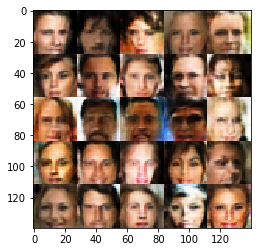

Epoch 1/1 Step 20210... Discriminator Loss: 1.4198... Generator Loss: 0.7464
Epoch 1/1 Step 20220... Discriminator Loss: 1.2418... Generator Loss: 0.8821
Epoch 1/1 Step 20230... Discriminator Loss: 1.3468... Generator Loss: 0.8135
Epoch 1/1 Step 20240... Discriminator Loss: 1.5370... Generator Loss: 0.6410
Epoch 1/1 Step 20250... Discriminator Loss: 1.3712... Generator Loss: 0.7911


In [13]:
batch_size = 10    # 64
z_dim = 100
learning_rate = 0.0005 # 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.